In [ ]:
# libraries
#%matplotlib notebook
import os
import pandas as pd
import numpy as np
import json
from scipy.signal import periodogram
from sklearn.metrics import confusion_matrix, average_precision_score
import matplotlib
import seaborn
import matplotlib.dates as md
from matplotlib import pyplot as plt
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
dfsA1 = {}

# Loop through the range 1 to 67 (inclusive) and load data
for i in range(1, 68):
    file_path = f"/content/drive/My Drive/YAHOO/A1/Yahoo_A1real_{i}_data.out"
    dfsA1[i] = pd.read_csv(file_path, sep=",", names=[f"value_{i}", "label"])
    # Add a timestamp column assuming hourly data starting from '2022-01-01 00:00:00'
    start_time = pd.Timestamp('2022-01-01 00:00:00')
    dfsA1[i]['timestamp'] = [start_time + pd.Timedelta(hours=i) for i in range(len(dfsA1[i]))]

    # Set timestamp as the index for time-series processing
    dfsA1[i].set_index('timestamp', inplace=True)

In [ ]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import StandardScaler

# Perform feature engineering
def feature_engineering(df, value_col, window_size):
    df = df.copy()

    # Rolling statistics
    df[f'rolling_mean_{window_size}'] = df[value_col].rolling(window=window_size).mean()
    df[f'rolling_std_{window_size}'] = df[value_col].rolling(window=window_size).std()
    df[f'rolling_min_{window_size}'] = df[value_col].rolling(window=window_size).min()
    df[f'rolling_max_{window_size}'] = df[value_col].rolling(window=window_size).max()

    # Time-based features
    df['hour'] = df.index.hour
    df['day_of_week'] = df.index.dayofweek
    df['day_of_month'] = df.index.day
 #   df['month'] = df.index.month
    df['Lag'] = df[value_col].shift(24)

 #   for lag in range(1, 6):
   #     df[f"lag_{lag}"] = df[value_col].shift(lag)
  #  df = df.dropna()

    # Sinusoidal encoding for seasonality
    df['sin_day'] = np.sin(2 * np.pi * df.index.dayofyear / 24)
    df['cos_day'] = np.cos(2 * np.pi * df.index.dayofyear / 24)

    # Drop rows with NaN due to rolling statistics
    df.dropna(inplace=True)
    return df

## A1A - Long term Stationarity with weak seasonality


## LOF with temporal columns

Processing dataset dfsA1[1]...
Best F1 Score for dfsA1[1]: 0.5714
Best Precision: 0.4000
Best Recall: 1.0000
Best Parameters: {'contamination': 0.01, 'n_neighbors': 40}


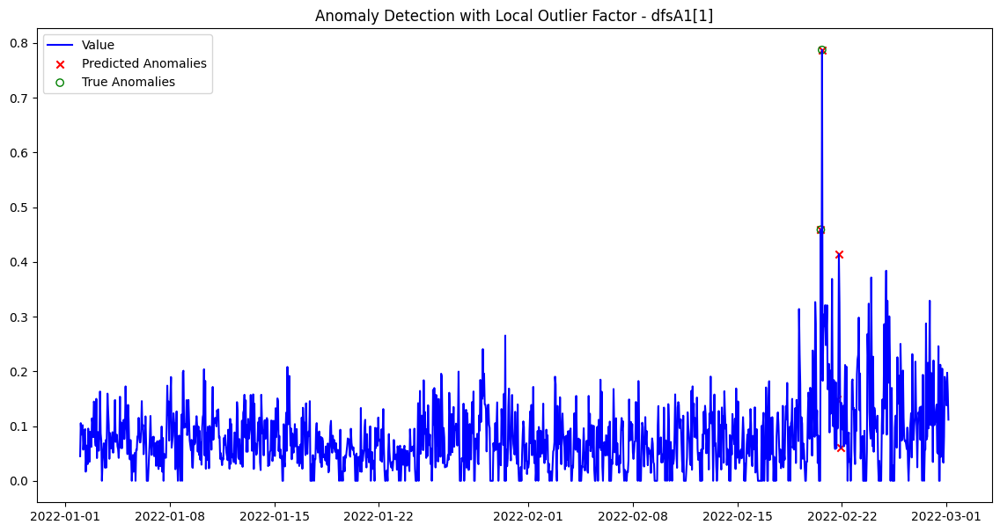

Processing dataset dfsA1[2]...
Best F1 Score for dfsA1[2]: 0.9412
Best Precision: 0.8889
Best Recall: 1.0000
Best Parameters: {'contamination': 'auto', 'n_neighbors': 20}


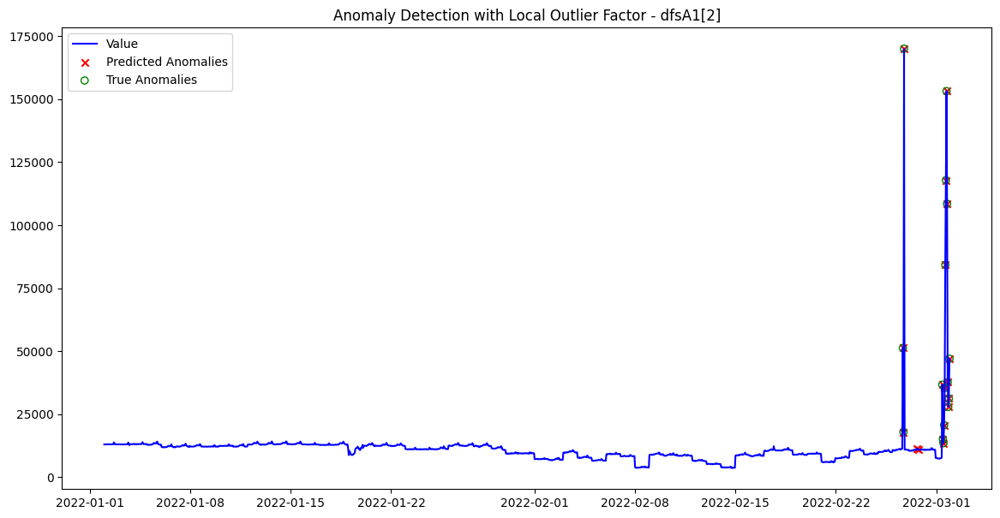

Processing dataset dfsA1[3]...
Best F1 Score for dfsA1[3]: 0.9677
Best Precision: 0.9375
Best Recall: 1.0000
Best Parameters: {'contamination': 'auto', 'n_neighbors': 20}


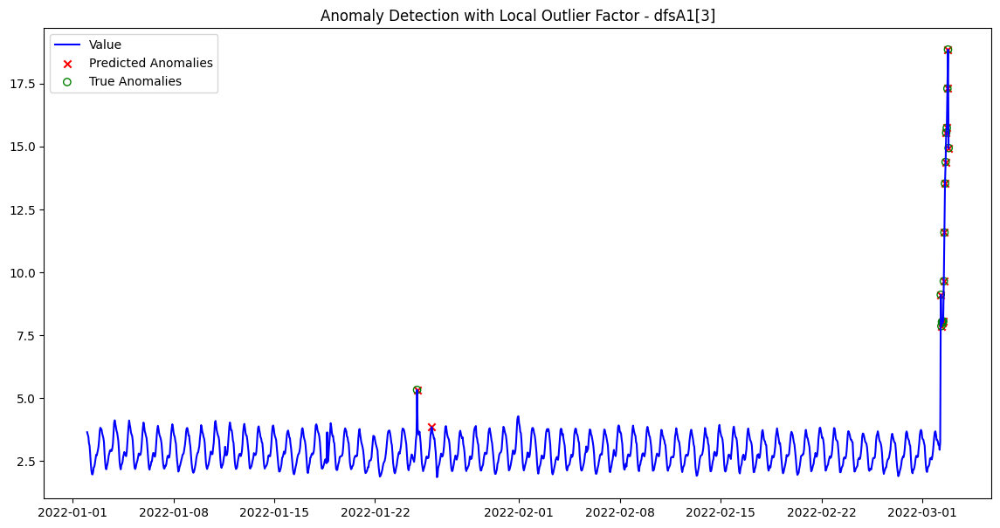

Processing dataset dfsA1[8]...
Best F1 Score for dfsA1[8]: 0.5833
Best Precision: 0.5000
Best Recall: 0.7000
Best Parameters: {'contamination': 0.01, 'n_neighbors': 40}


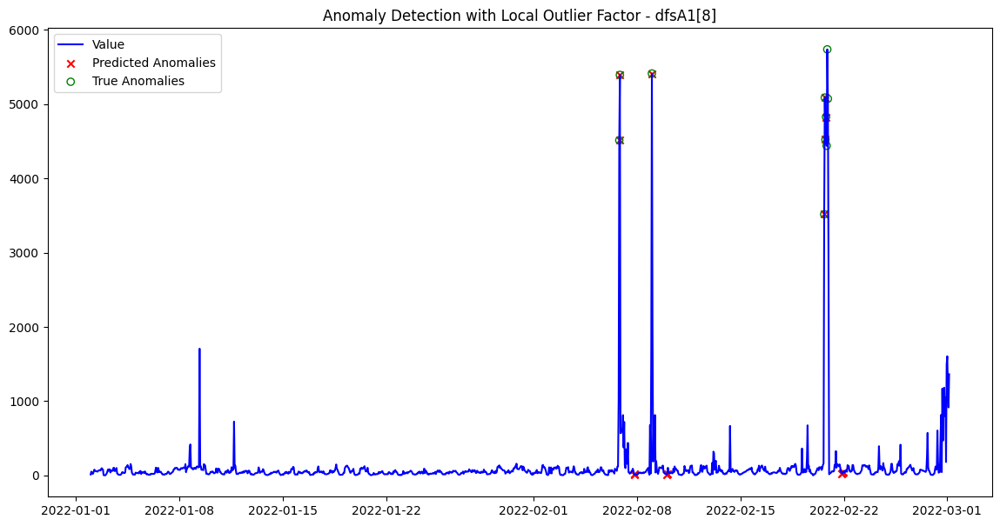

Processing dataset dfsA1[9]...
Best F1 Score for dfsA1[9]: 0.5882
Best Precision: 0.5556
Best Recall: 0.6250
Best Parameters: {'contamination': 0.01, 'n_neighbors': 40}


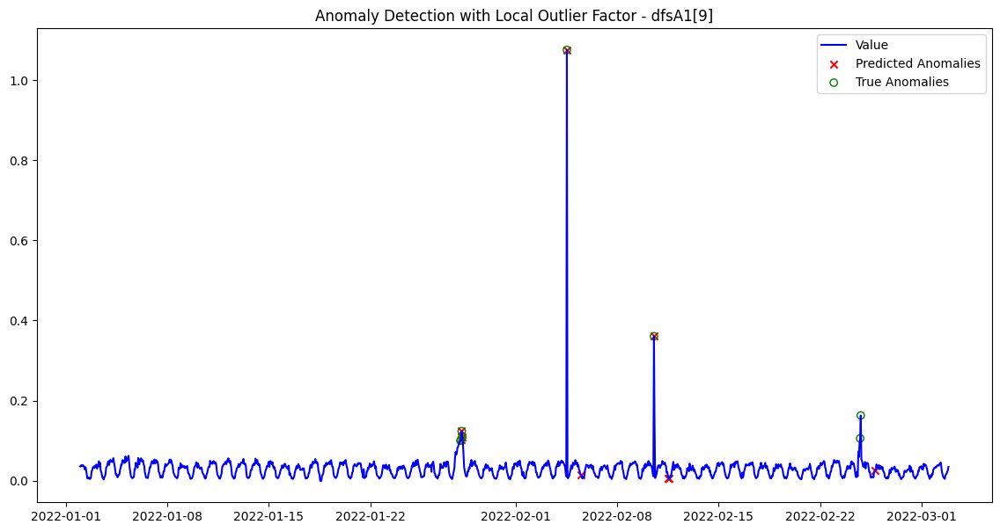

Processing dataset dfsA1[10]...
Best F1 Score for dfsA1[10]: 1.0000
Best Precision: 1.0000
Best Recall: 1.0000
Best Parameters: {'contamination': 0.01, 'n_neighbors': 20}


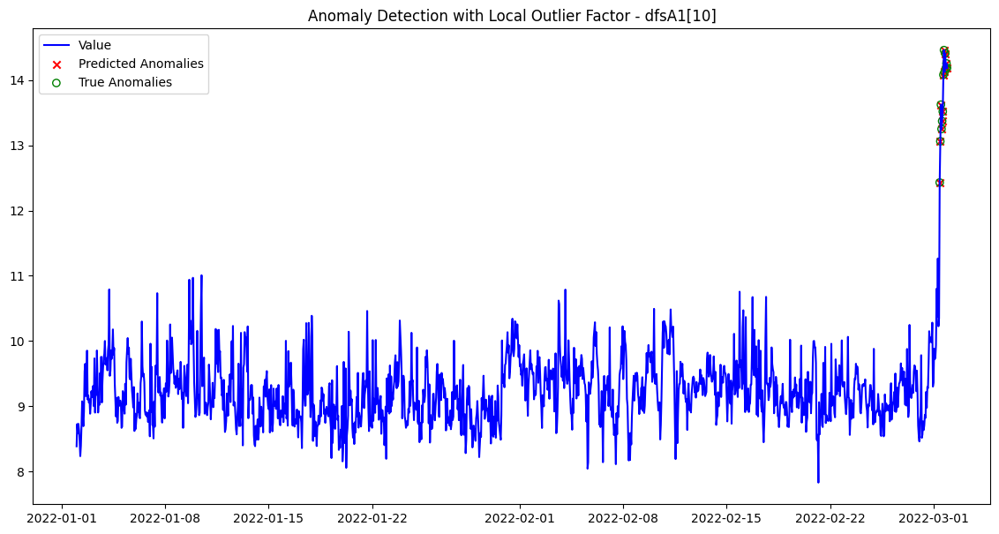

Processing dataset dfsA1[13]...
Best F1 Score for dfsA1[13]: 0.6957
Best Precision: 0.7273
Best Recall: 0.6667
Best Parameters: {'contamination': 'auto', 'n_neighbors': 40}


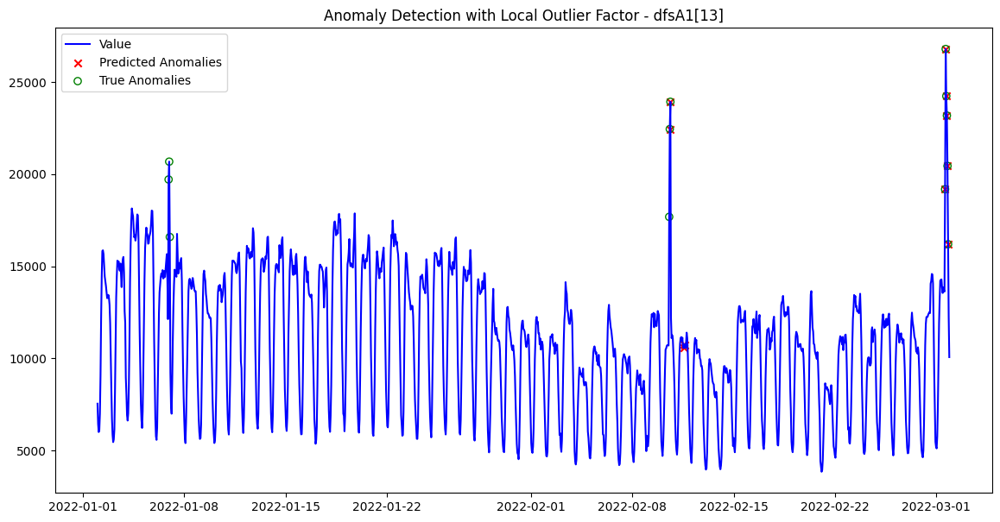

Processing dataset dfsA1[23]...
Best F1 Score for dfsA1[23]: 0.3095
Best Precision: 0.2000
Best Recall: 0.6842
Best Parameters: {'contamination': 0.05, 'n_neighbors': 40}


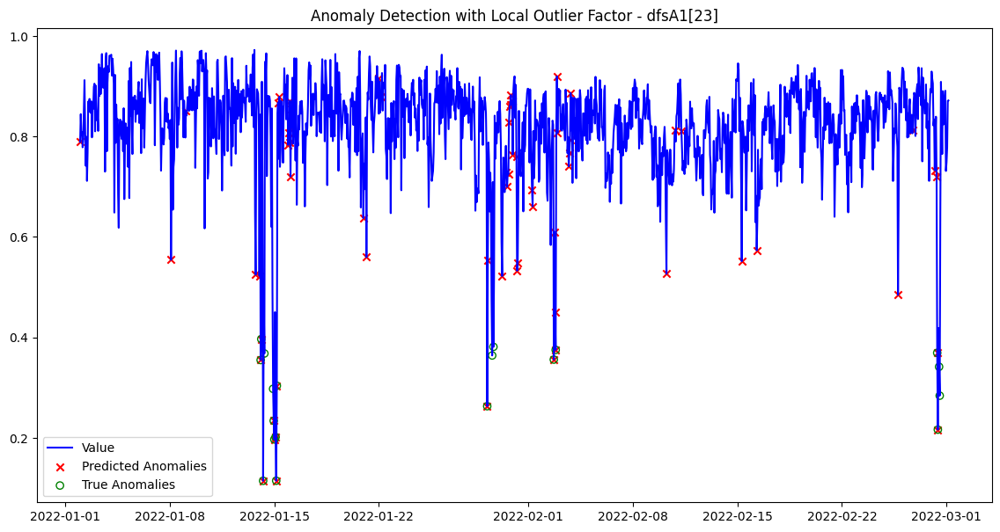

Processing dataset dfsA1[24]...
Best F1 Score for dfsA1[24]: 0.8421
Best Precision: 0.7273
Best Recall: 1.0000
Best Parameters: {'contamination': 'auto', 'n_neighbors': 20}


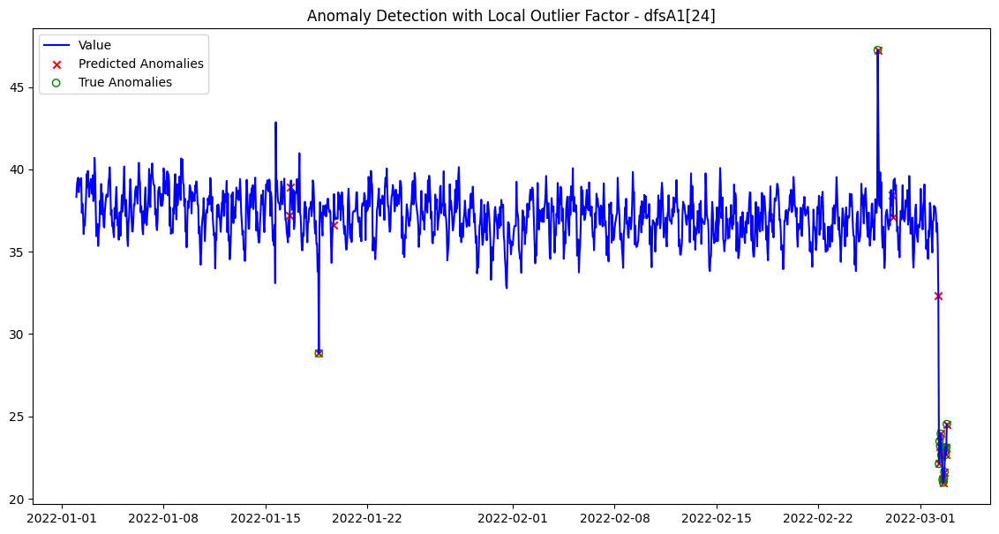

Processing dataset dfsA1[27]...
Best F1 Score for dfsA1[27]: 0.4000
Best Precision: 0.3333
Best Recall: 0.5000
Best Parameters: {'contamination': 0.01, 'n_neighbors': 40}


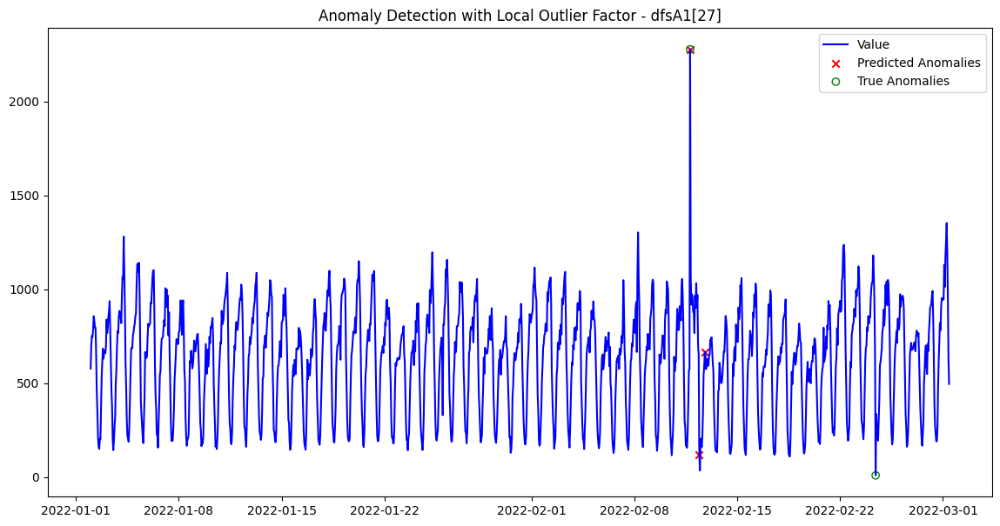

Processing dataset dfsA1[34]...
Best F1 Score for dfsA1[34]: 0.5882
Best Precision: 0.5000
Best Recall: 0.7143
Best Parameters: {'contamination': 'auto', 'n_neighbors': 40}


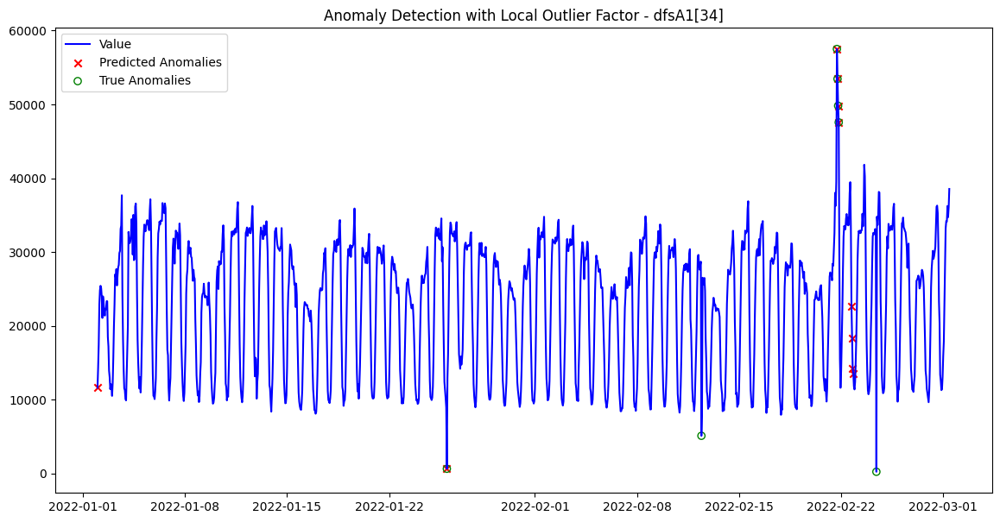

Processing dataset dfsA1[41]...
Best F1 Score for dfsA1[41]: 0.4286
Best Precision: 0.2727
Best Recall: 1.0000
Best Parameters: {'contamination': 0.01, 'n_neighbors': 20}


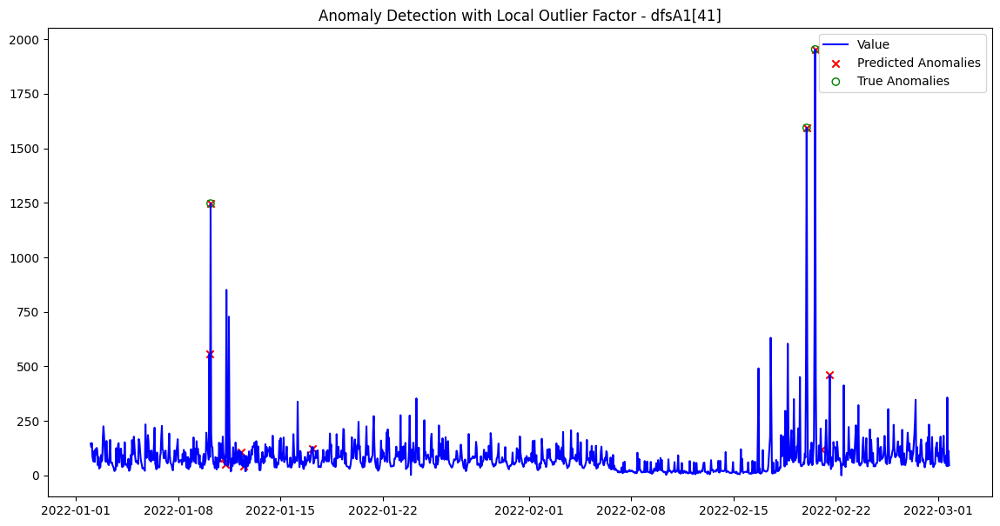

Processing dataset dfsA1[66]...
Best F1 Score for dfsA1[66]: 0.1935
Best Precision: 0.1119
Best Recall: 0.7143
Best Parameters: {'contamination': 0.1, 'n_neighbors': 30}


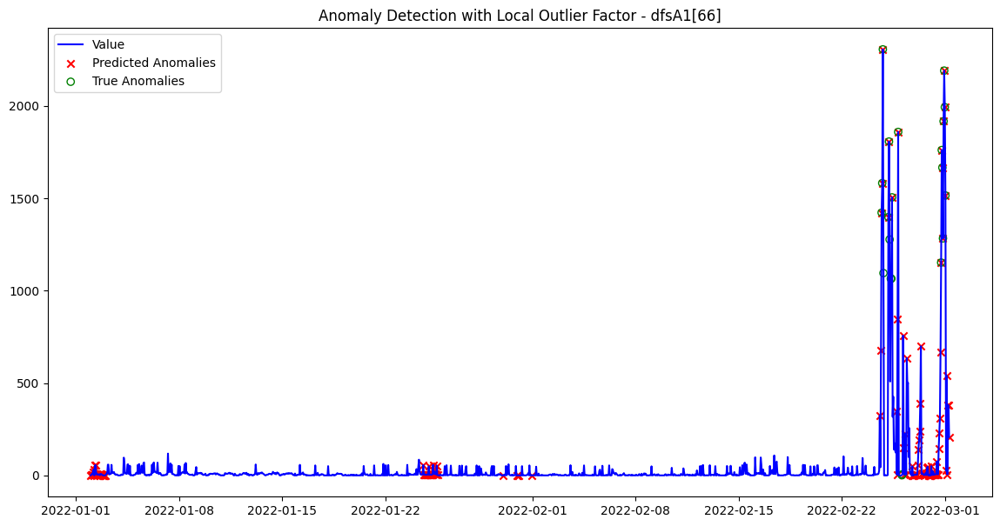

Average F1 Score across all datasets: 0.6238
Average Precision across all datasets: 0.5503
Average Recall across all datasets: 0.8157
All F1 Scores for each dataset: 0.5714, 0.9412, 0.9677, 0.5833, 0.5882, 1.0000, 0.6957, 0.3095, 0.8421, 0.4000, 0.5882, 0.4286, 0.1935


In [ ]:
from sklearn.neighbors import LocalOutlierFactor
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import f1_score, precision_score, recall_score
from sklearn.model_selection import ParameterGrid
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns

# Define A1A and ParameterGrid for hyperparameter tuning
A1A = [1,2,3,8,9,10,13,23,24,27,34,41,66]
param_grid = {
    'n_neighbors': [5, 10, 20, 30, 40],
    'contamination': ['auto', 0.01, 0.02, 0.05, 0.1]
}
grid = ParameterGrid(param_grid)

# To calculate the average F1 score, precision, and recall
f1_scores = []
precision_scores = []
recall_scores = []

# Iterate through datasets
for i in A1A:
    print(f"Processing dataset dfsA1[{i}]...")

    # Feature engineering (you'll need to implement this function)
    data_features = feature_engineering(dfsA1[i], value_col=f"value_{i}", window_size=24)

    # Separate features and labels
    X = data_features.drop(columns=['label'])  # Drop the label column
    y = data_features['label']  # Ground truth labels

    # Standardize features
    scaler = StandardScaler()
    X_scaled = scaler.fit_transform(X)

    # Estimate contamination
    #contamination = y.sum() / len(y)

    # Hyperparameter tuning using grid search
    best_f1 = -1
    best_precision = -1
    best_recall = -1
    best_params = None
    best_predictions = None

    for params in grid:
        # Update contamination dynamically if it's 'auto'
      #  if params['contamination'] == 'auto':
       #     params['contamination'] = contamination

        # Train Local Outlier Factor with current parameters
        lof = LocalOutlierFactor(
            n_neighbors=params['n_neighbors'],
            contamination=params['contamination'],
            novelty=True
        )
        lof.fit(X_scaled)
        predictions = lof.predict(X_scaled)

        # Map predictions to binary (1 = anomaly, 0 = normal)
        predictions = [1 if pred == -1 else 0 for pred in predictions]

        # Calculate metrics
        f1 = f1_score(y, predictions)
        precision = precision_score(y, predictions)
        recall = recall_score(y, predictions)

        # Update best parameters if current F1 is better
        if f1 > best_f1:
            best_f1 = f1
            best_precision = precision
            best_recall = recall
            best_params = params
            best_predictions = predictions

    # Append best metrics for the dataset
    f1_scores.append(best_f1)
    precision_scores.append(best_precision)
    recall_scores.append(best_recall)

    # Output best parameters and metrics for current dataset
    print(f"Best F1 Score for dfsA1[{i}]: {best_f1:.4f}")
    print(f"Best Precision: {best_precision:.4f}")
    print(f"Best Recall: {best_recall:.4f}")
    print(f"Best Parameters: {best_params}")

    # Add predictions to the original DataFrame for inspection
    data_features['predictions'] = best_predictions

    # Visualize anomalies
    plt.figure(figsize=(14, 7))
    plt.plot(data_features.index, data_features[f"value_{i}"], label='Value', color='blue')
    plt.scatter(data_features[data_features['predictions'] == 1].index,
                data_features[data_features['predictions'] == 1][f"value_{i}"],
                color='red', label='Predicted Anomalies', marker='x')
    plt.scatter(data_features[data_features['label'] == 1].index,
                data_features[data_features['label'] == 1][f"value_{i}"],
                color='green', label='True Anomalies', marker='o', facecolors = "none")

    plt.title(f'Anomaly Detection with Local Outlier Factor - dfsA1[{i}]')
    plt.legend()
    plt.show()

# Calculate and output the average metrics
avg_f1_score = sum(f1_scores) / len(f1_scores)
avg_precision = sum(precision_scores) / len(precision_scores)
avg_recall = sum(recall_scores) / len(recall_scores)
print(f"Average F1 Score across all datasets: {avg_f1_score:.4f}")
print(f"Average Precision across all datasets: {avg_precision:.4f}")
print(f"Average Recall across all datasets: {avg_recall:.4f}")
# Print each F1 score formatted individually
formatted_f1_scores = [f"{score:.4f}" for score in f1_scores]
print(f"All F1 Scores for each dataset: {', '.join(formatted_f1_scores)}")



## LOF

Processing dataset dfsA1[1]...
Best F1 Score for dfsA1[1]: 0.5714
Best Precision: 0.4000
Best Recall: 1.0000
Best Parameters: {'contamination': 'auto', 'n_neighbors': 20}


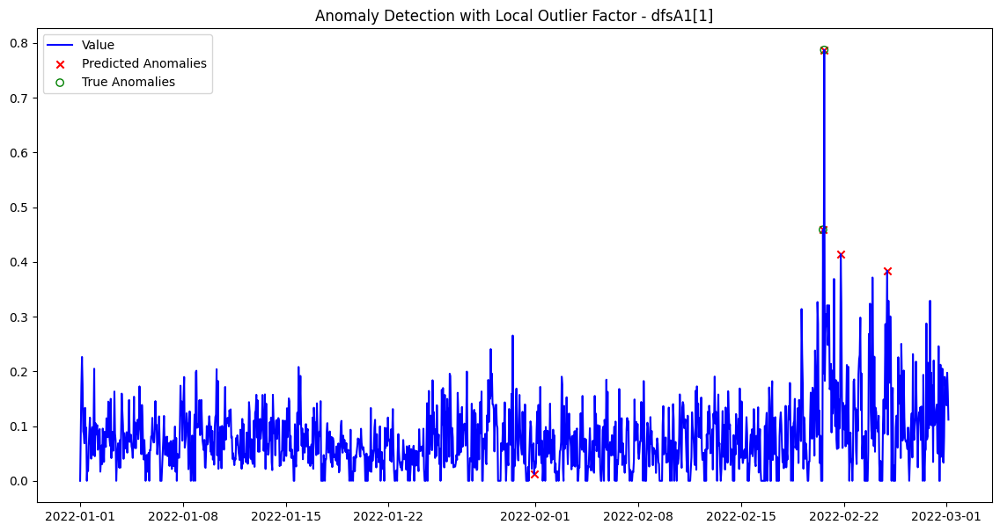

Processing dataset dfsA1[2]...
Best F1 Score for dfsA1[2]: 0.9677
Best Precision: 1.0000
Best Recall: 0.9375
Best Parameters: {'contamination': 0.01, 'n_neighbors': 20}


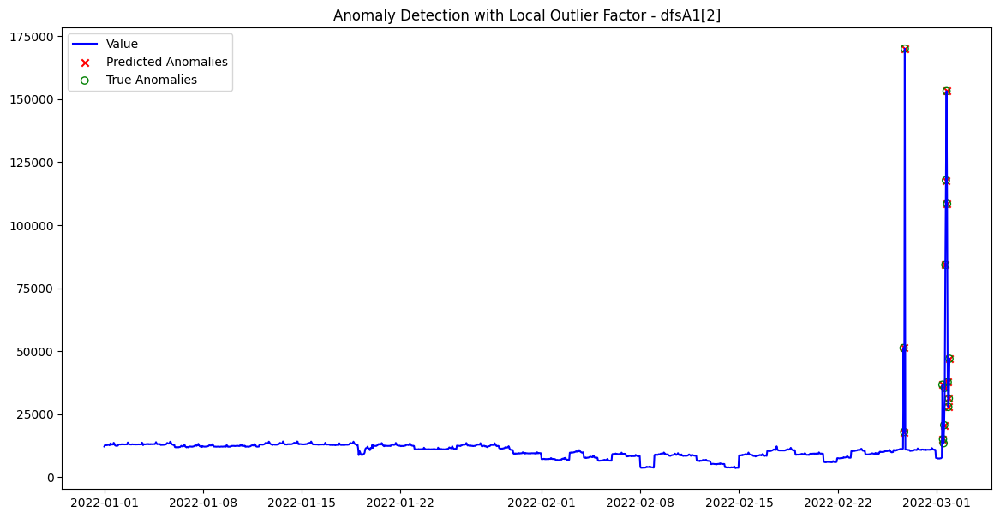

Processing dataset dfsA1[3]...
Best F1 Score for dfsA1[3]: 1.0000
Best Precision: 1.0000
Best Recall: 1.0000
Best Parameters: {'contamination': 0.01, 'n_neighbors': 20}


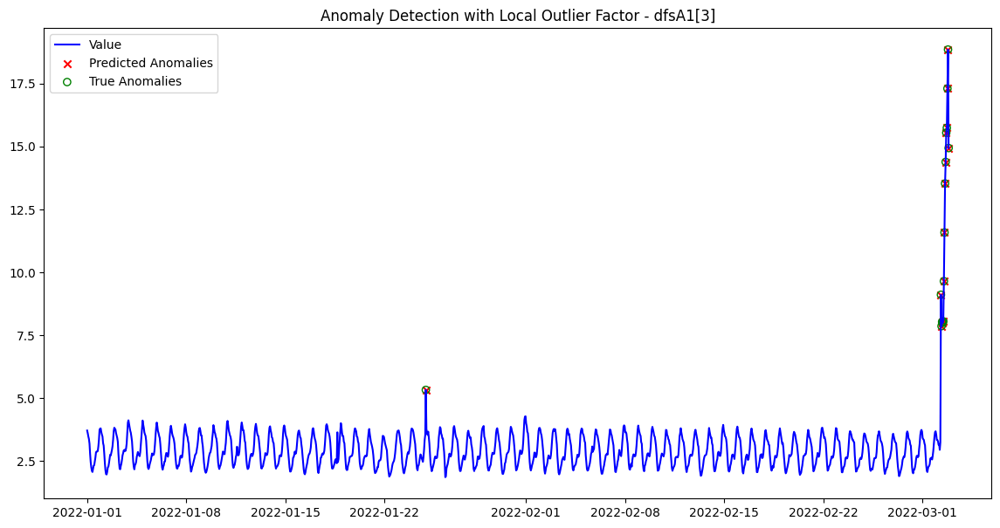

Processing dataset dfsA1[8]...


/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Best F1 Score for dfsA1[8]: 0.9474
Best Precision: 1.0000
Best Recall: 0.9000
Best Parameters: {'contamination': 0.01, 'n_neighbors': 30}


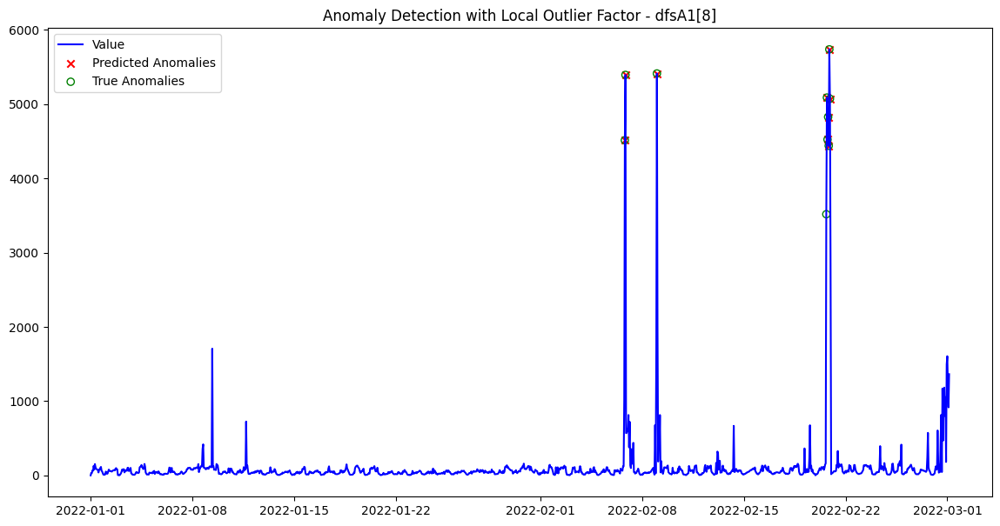

Processing dataset dfsA1[9]...
Best F1 Score for dfsA1[9]: 0.7273
Best Precision: 0.5714
Best Recall: 1.0000
Best Parameters: {'contamination': 0.01, 'n_neighbors': 40}


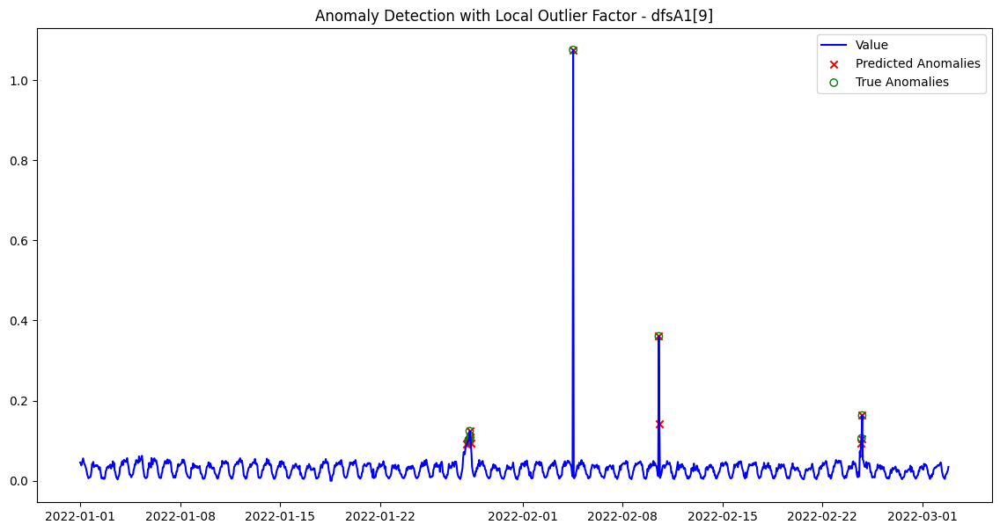

Processing dataset dfsA1[10]...
Best F1 Score for dfsA1[10]: 0.9630
Best Precision: 0.9286
Best Recall: 1.0000
Best Parameters: {'contamination': 0.01, 'n_neighbors': 20}


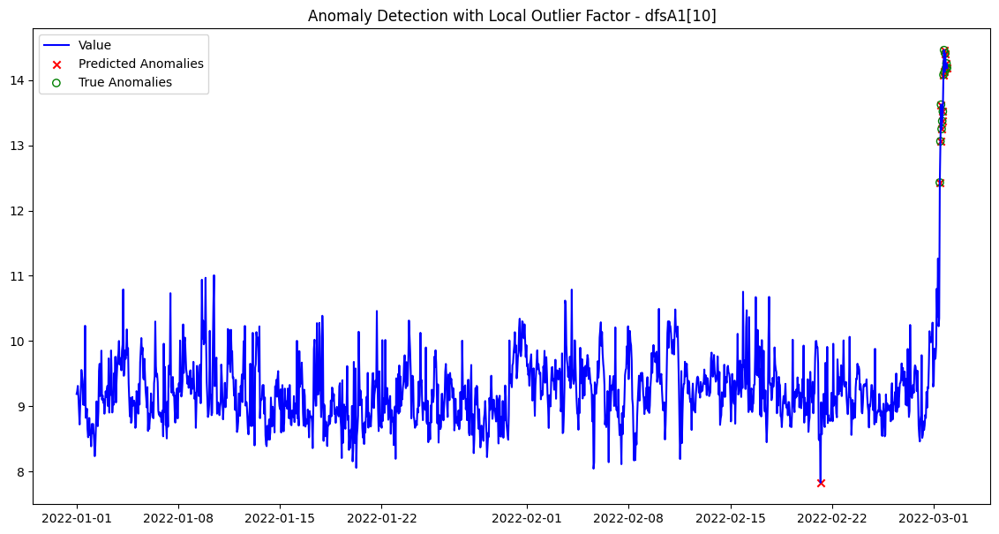

Processing dataset dfsA1[13]...
Best F1 Score for dfsA1[13]: 0.7826
Best Precision: 0.8182
Best Recall: 0.7500
Best Parameters: {'contamination': 'auto', 'n_neighbors': 20}


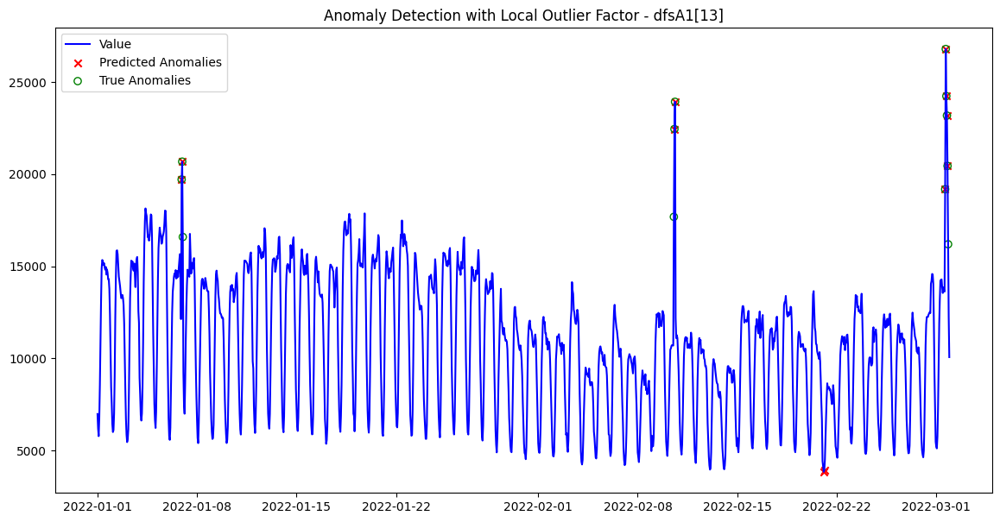

Processing dataset dfsA1[23]...
Best F1 Score for dfsA1[23]: 0.6230
Best Precision: 0.4524
Best Recall: 1.0000
Best Parameters: {'contamination': 'auto', 'n_neighbors': 40}


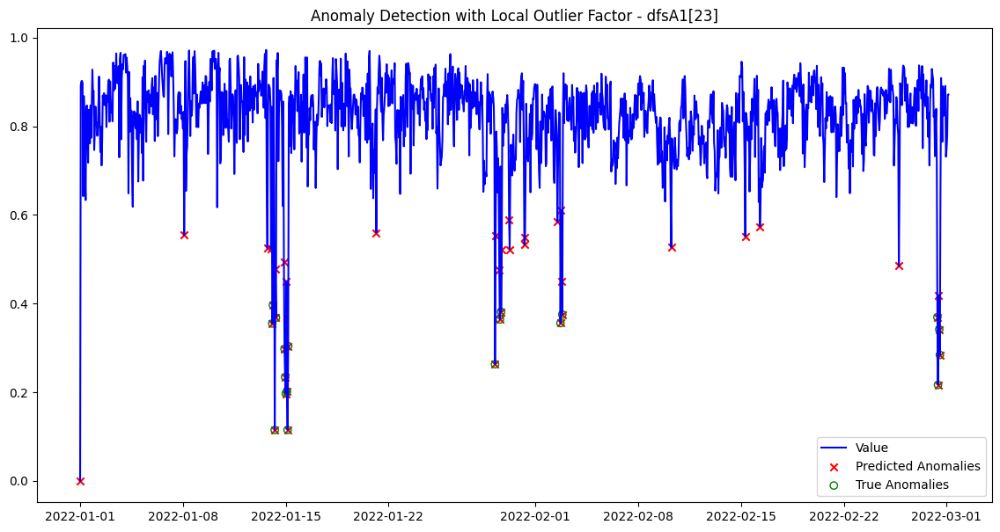

Processing dataset dfsA1[24]...
Best F1 Score for dfsA1[24]: 0.9333
Best Precision: 1.0000
Best Recall: 0.8750
Best Parameters: {'contamination': 0.01, 'n_neighbors': 40}


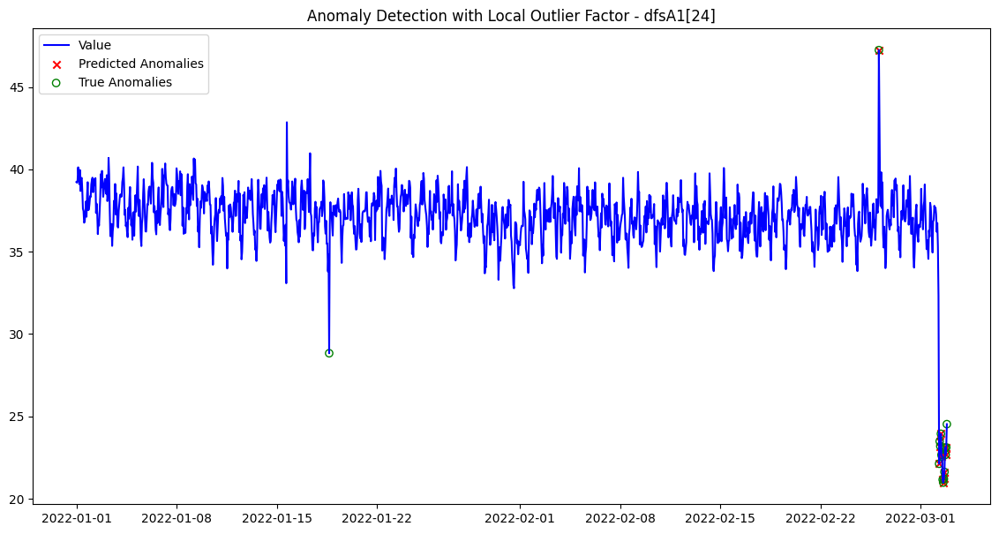

Processing dataset dfsA1[27]...
Best F1 Score for dfsA1[27]: 0.3636
Best Precision: 0.2222
Best Recall: 1.0000
Best Parameters: {'contamination': 0.01, 'n_neighbors': 10}


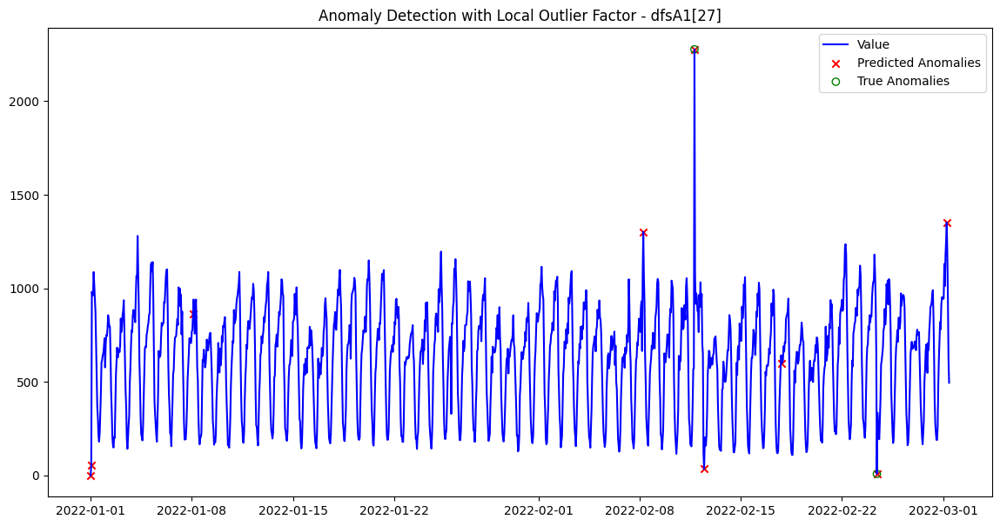

Processing dataset dfsA1[34]...
Best F1 Score for dfsA1[34]: 0.7368
Best Precision: 0.5833
Best Recall: 1.0000
Best Parameters: {'contamination': 0.01, 'n_neighbors': 10}


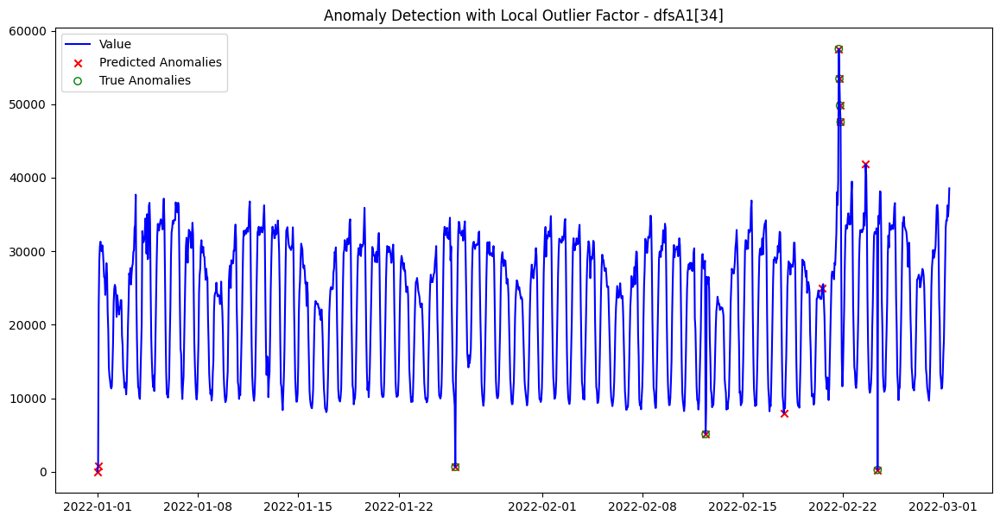

Processing dataset dfsA1[41]...
Best F1 Score for dfsA1[41]: 0.4000
Best Precision: 0.2500
Best Recall: 1.0000
Best Parameters: {'contamination': 0.01, 'n_neighbors': 30}


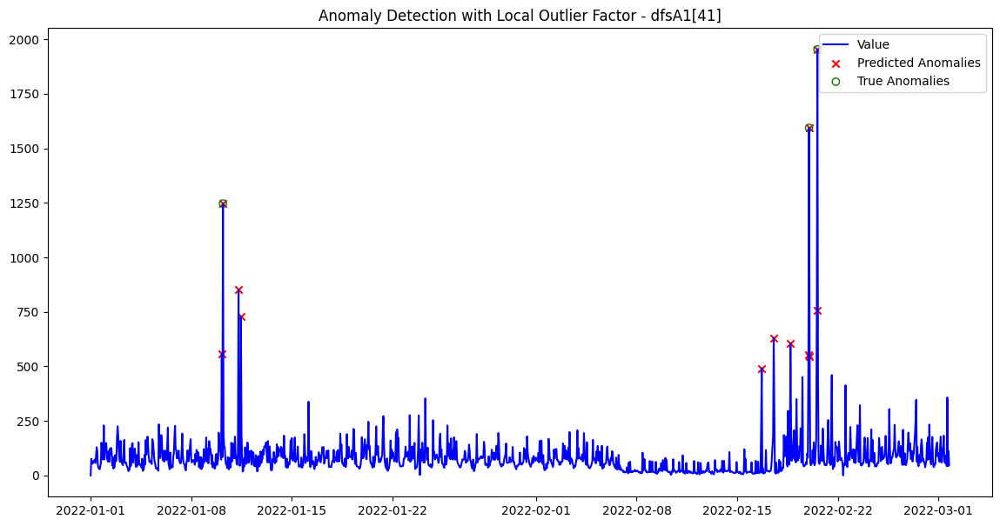

Processing dataset dfsA1[66]...


/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Best F1 Score for dfsA1[66]: 0.3089
Best Precision: 0.1863
Best Recall: 0.9048
Best Parameters: {'contamination': 0.1, 'n_neighbors': 40}


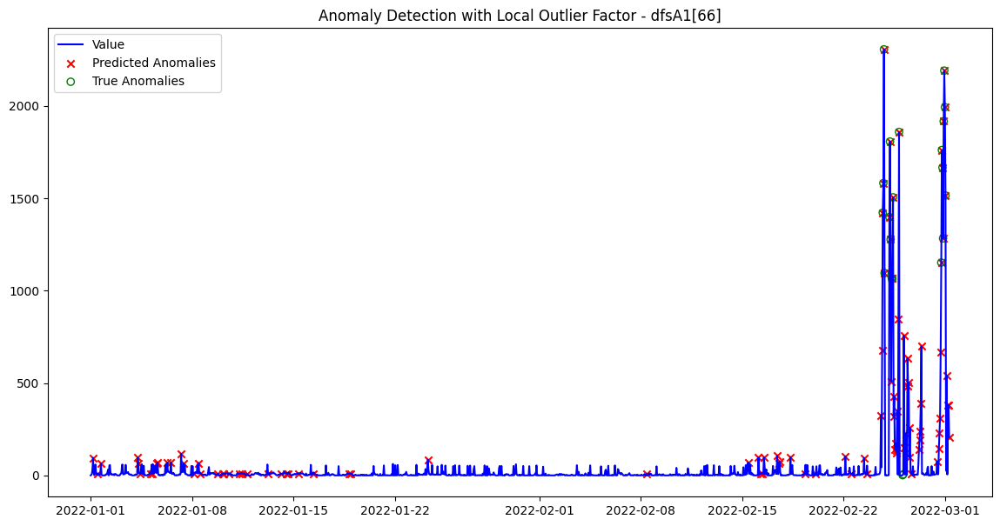

Average F1 Score across all datasets: 0.7173
Average Precision across all datasets: 0.6471
Average Recall across all datasets: 0.9513
All F1 Scores for each dataset: 0.5714, 0.9677, 1.0000, 0.9474, 0.7273, 0.9630, 0.7826, 0.6230, 0.9333, 0.3636, 0.7368, 0.4000, 0.3089


In [ ]:
from sklearn.neighbors import LocalOutlierFactor
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import f1_score, precision_score, recall_score
from sklearn.model_selection import ParameterGrid
import matplotlib.pyplot as plt
import pandas as pd

# Define A1A and ParameterGrid for hyperparameter tuning
A1A = [1,2,3,8,9,10,13,23,24,27,34,41,66]
param_grid = {
    'n_neighbors': [5, 10, 20, 30, 40],
    'contamination': ['auto', 0.01, 0.02, 0.05, 0.1]
}
grid = ParameterGrid(param_grid)

# To calculate the average F1 score, precision, and recall
f1_scores = []
precision_scores = []
recall_scores = []

# Iterate through datasets
for i in A1A:
    print(f"Processing dataset dfsA1[{i}]...")

    # Feature engineering (you'll need to implement this function)
    data_features = dfsA1[i]

    # Separate features and labels
    X = data_features.drop(columns=['label'])  # Drop the label column
    y = data_features['label']  # Ground truth labels

    # Standardize features
    scaler = StandardScaler()
    X_scaled = scaler.fit_transform(X)

    # Estimate contamination
    #contamination = y.sum() / len(y)

    # Hyperparameter tuning using grid search
    best_f1 = -1
    best_precision = -1
    best_recall = -1
    best_params = None
    best_predictions = None

    for params in grid:
        # Update contamination dynamically if it's 'auto'
       # if params['contamination'] == 'auto':
       #     params['contamination'] = contamination

        # Train Local Outlier Factor with current parameters
        lof = LocalOutlierFactor(
            n_neighbors=params['n_neighbors'],
            contamination=params['contamination'],
            novelty=True
        )
        lof.fit(X_scaled)
        predictions = lof.predict(X_scaled)

        # Map predictions to binary (1 = anomaly, 0 = normal)
        predictions = [1 if pred == -1 else 0 for pred in predictions]

        # Calculate metrics
        f1 = f1_score(y, predictions)
        precision = precision_score(y, predictions)
        recall = recall_score(y, predictions)

        # Update best parameters if current F1 is better
        if f1 > best_f1:
            best_f1 = f1
            best_precision = precision
            best_recall = recall
            best_params = params
            best_predictions = predictions

    # Append best metrics for the dataset
    f1_scores.append(best_f1)
    precision_scores.append(best_precision)
    recall_scores.append(best_recall)

    # Output best parameters and metrics for current dataset
    print(f"Best F1 Score for dfsA1[{i}]: {best_f1:.4f}")
    print(f"Best Precision: {best_precision:.4f}")
    print(f"Best Recall: {best_recall:.4f}")
    print(f"Best Parameters: {best_params}")

    # Add predictions to the original DataFrame for inspection
    data_features['predictions'] = best_predictions

    # Visualize anomalies
    plt.figure(figsize=(14, 7))
    plt.plot(data_features.index, data_features[f"value_{i}"], label='Value', color='blue')
    plt.scatter(data_features[data_features['predictions'] == 1].index,
                data_features[data_features['predictions'] == 1][f"value_{i}"],
                color='red', label='Predicted Anomalies', marker='x')
    plt.scatter(data_features[data_features['label'] == 1].index,
                data_features[data_features['label'] == 1][f"value_{i}"],
                color='green', label='True Anomalies', marker='o', facecolors="none")

    plt.title(f'Anomaly Detection with Local Outlier Factor - dfsA1[{i}]')
    plt.legend()
    plt.show()

# Calculate and output the average metrics
avg_f1_score = sum(f1_scores) / len(f1_scores)
avg_precision = sum(precision_scores) / len(precision_scores)
avg_recall = sum(recall_scores) / len(recall_scores)
print(f"Average F1 Score across all datasets: {avg_f1_score:.4f}")
print(f"Average Precision across all datasets: {avg_precision:.4f}")
print(f"Average Recall across all datasets: {avg_recall:.4f}")
# Print each F1 score formatted individually
formatted_f1_scores = [f"{score:.4f}" for score in f1_scores]
print(f"All F1 Scores for each dataset: {', '.join(formatted_f1_scores)}")



## A1B - Stationarity with change shift

## temp col

Processing dataset dfsA1[7]...
Best F1 Score for dfsA1[7]: 0.5000
Best Precision: 0.4776
Best Recall: 0.5246
Best Parameters: {'contamination': 0.05, 'n_neighbors': 40}


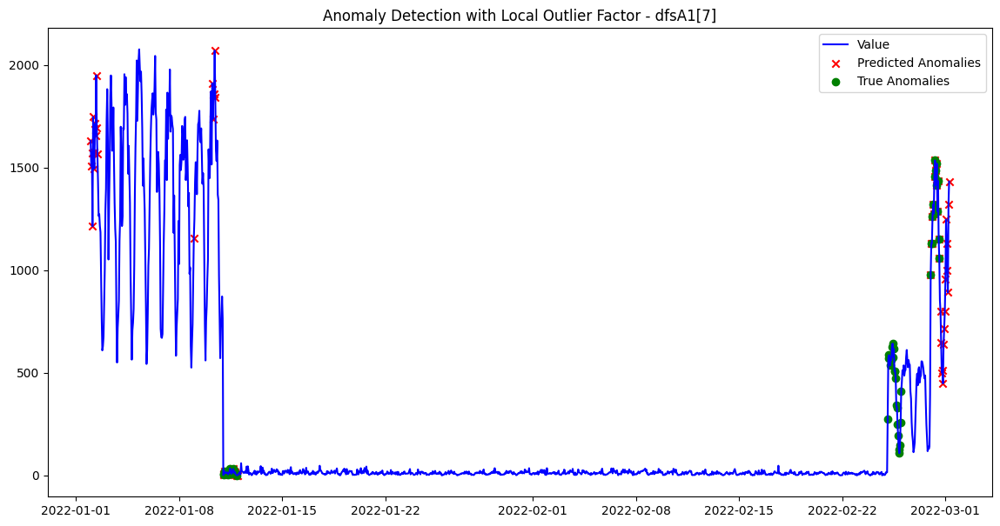

Processing dataset dfsA1[20]...
Best F1 Score for dfsA1[20]: 0.4565
Best Precision: 0.3559
Best Recall: 0.6364
Best Parameters: {'contamination': 0.05, 'n_neighbors': 20}


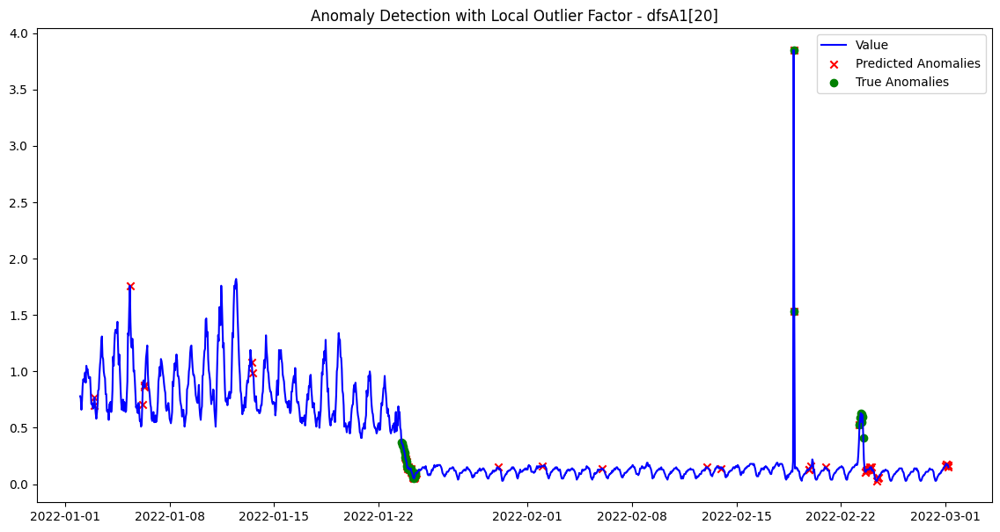

Processing dataset dfsA1[31]...
Best F1 Score for dfsA1[31]: 0.4444
Best Precision: 0.6667
Best Recall: 0.3333
Best Parameters: {'contamination': 0.01, 'n_neighbors': 10}


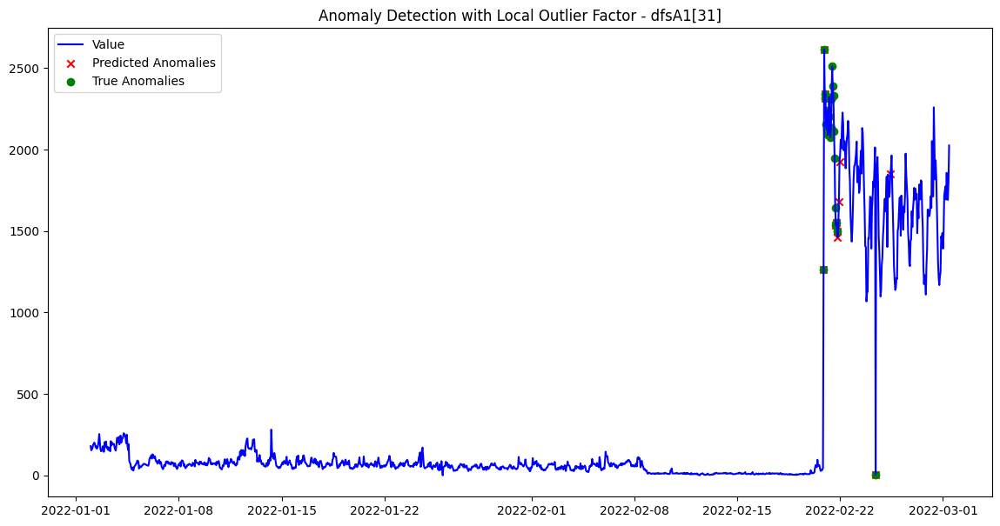

Processing dataset dfsA1[32]...
Best F1 Score for dfsA1[32]: 0.6479
Best Precision: 0.9583
Best Recall: 0.4894
Best Parameters: {'contamination': 'auto', 'n_neighbors': 30}


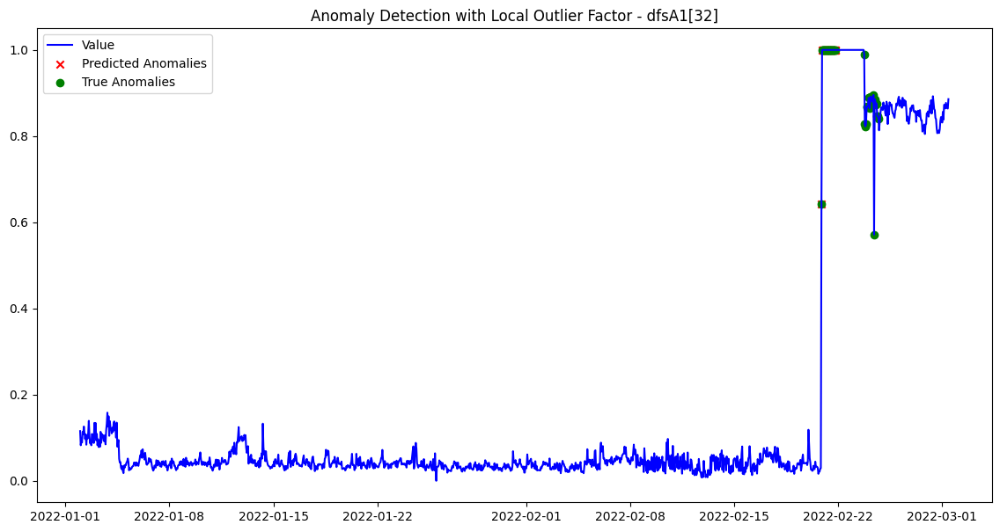

Processing dataset dfsA1[48]...
Best F1 Score for dfsA1[48]: 0.2632
Best Precision: 0.3571
Best Recall: 0.2083
Best Parameters: {'contamination': 0.01, 'n_neighbors': 40}


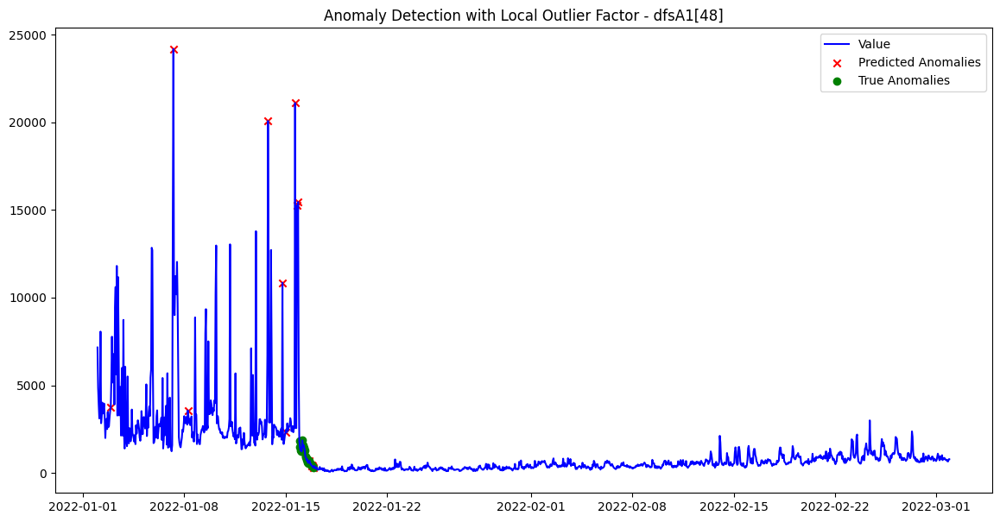

Processing dataset dfsA1[57]...
Best F1 Score for dfsA1[57]: 0.6000
Best Precision: 0.4286
Best Recall: 1.0000
Best Parameters: {'contamination': 0.01, 'n_neighbors': 10}


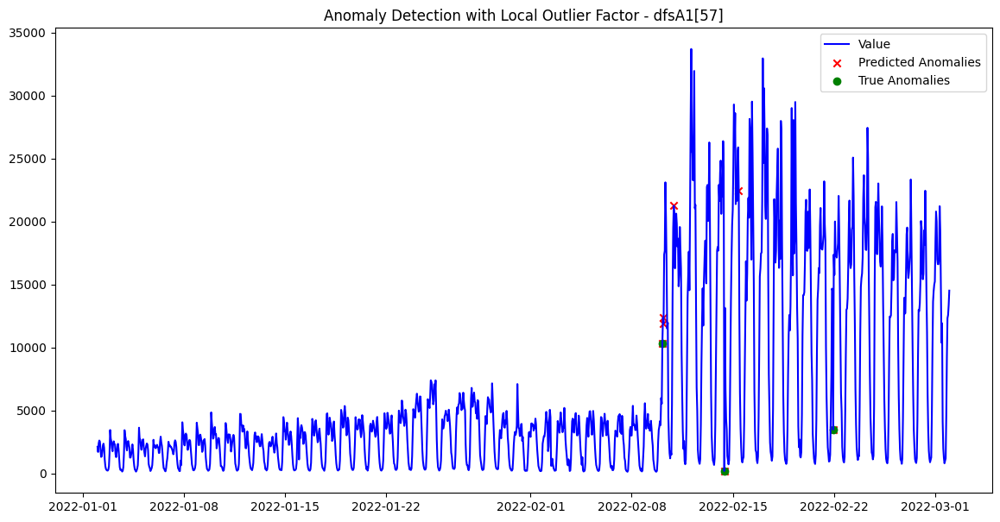

Processing dataset dfsA1[61]...
Best F1 Score for dfsA1[61]: 0.1690
Best Precision: 0.1017
Best Recall: 0.5000
Best Parameters: {'contamination': 0.1, 'n_neighbors': 20}


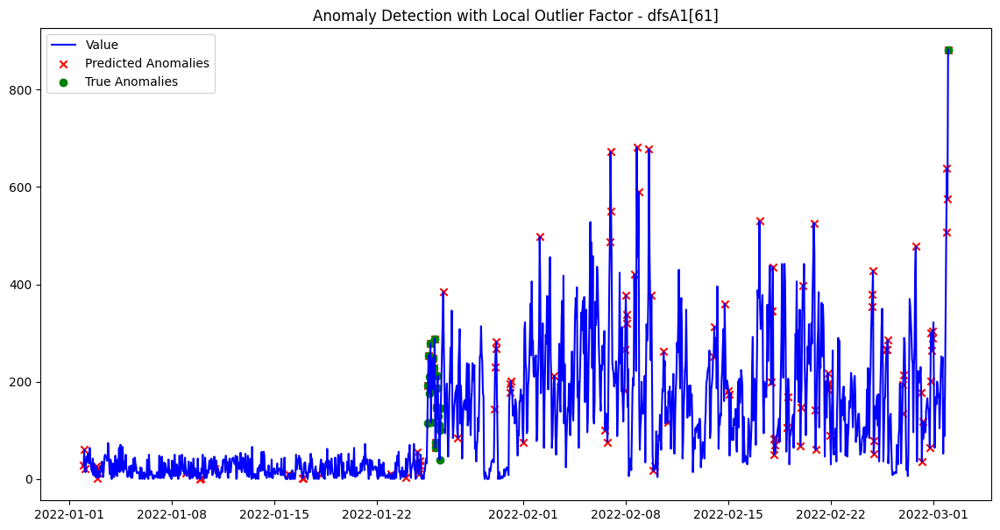

Average F1 Score across all datasets: 0.4401
Average Precision across all datasets: 0.4780
Average Recall across all datasets: 0.5274
All F1 Scores for each dataset: 0.5000, 0.4565, 0.4444, 0.6479, 0.2632, 0.6000, 0.1690


In [ ]:
from sklearn.neighbors import LocalOutlierFactor
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import f1_score, precision_score, recall_score
from sklearn.model_selection import ParameterGrid
import matplotlib.pyplot as plt
import pandas as pd

# Define A1A and ParameterGrid for hyperparameter tuning
A1B = [7,20,31,32,48,57,61]
param_grid = {
    'n_neighbors': [5, 10, 20, 30, 40],
    'contamination': ['auto', 0.01, 0.02, 0.05, 0.1]
}
grid = ParameterGrid(param_grid)

# To calculate the average F1 score, precision, and recall
f1_scores = []
precision_scores = []
recall_scores = []

# Iterate through datasets
for i in A1B:
    print(f"Processing dataset dfsA1[{i}]...")

    # Feature engineering (you'll need to implement this function)
    data_features = feature_engineering(dfsA1[i], value_col=f"value_{i}", window_size=24)

    # Separate features and labels
    X = data_features.drop(columns=['label'])  # Drop the label column
    y = data_features['label']  # Ground truth labels

    # Standardize features
    scaler = StandardScaler()
    X_scaled = scaler.fit_transform(X)

    # Estimate contamination
   # contamination = y.sum() / len(y)

    # Hyperparameter tuning using grid search
    best_f1 = -1
    best_precision = -1
    best_recall = -1
    best_params = None
    best_predictions = None

    for params in grid:
        # Update contamination dynamically if it's 'auto'
       # if params['contamination'] == 'auto':
       #     params['contamination'] = contamination

        # Train Local Outlier Factor with current parameters
        lof = LocalOutlierFactor(
            n_neighbors=params['n_neighbors'],
            contamination=params['contamination'],
            novelty=True
        )
        lof.fit(X_scaled)
        predictions = lof.predict(X_scaled)

        # Map predictions to binary (1 = anomaly, 0 = normal)
        predictions = [1 if pred == -1 else 0 for pred in predictions]

        # Calculate metrics
        f1 = f1_score(y, predictions)
        precision = precision_score(y, predictions)
        recall = recall_score(y, predictions)

        # Update best parameters if current F1 is better
        if f1 > best_f1:
            best_f1 = f1
            best_precision = precision
            best_recall = recall
            best_params = params
            best_predictions = predictions

    # Append best metrics for the dataset
    f1_scores.append(best_f1)
    precision_scores.append(best_precision)
    recall_scores.append(best_recall)

    # Output best parameters and metrics for current dataset
    print(f"Best F1 Score for dfsA1[{i}]: {best_f1:.4f}")
    print(f"Best Precision: {best_precision:.4f}")
    print(f"Best Recall: {best_recall:.4f}")
    print(f"Best Parameters: {best_params}")

    # Add predictions to the original DataFrame for inspection
    data_features['predictions'] = best_predictions

    # Visualize anomalies
    plt.figure(figsize=(14, 7))
    plt.plot(data_features.index, data_features[f"value_{i}"], label='Value', color='blue')
    plt.scatter(data_features[data_features['predictions'] == 1].index,
                data_features[data_features['predictions'] == 1][f"value_{i}"],
                color='red', label='Predicted Anomalies', marker='x')
    plt.scatter(data_features[data_features['label'] == 1].index,
                data_features[data_features['label'] == 1][f"value_{i}"],
                color='green', label='True Anomalies', marker='o')

    plt.title(f'Anomaly Detection with Local Outlier Factor - dfsA1[{i}]')
    plt.legend()
    plt.show()

# Calculate and output the average metrics
avg_f1_score = sum(f1_scores) / len(f1_scores)
avg_precision = sum(precision_scores) / len(precision_scores)
avg_recall = sum(recall_scores) / len(recall_scores)
print(f"Average F1 Score across all datasets: {avg_f1_score:.4f}")
print(f"Average Precision across all datasets: {avg_precision:.4f}")
print(f"Average Recall across all datasets: {avg_recall:.4f}")
# Print each F1 score formatted individually
formatted_f1_scores = [f"{score:.4f}" for score in f1_scores]
print(f"All F1 Scores for each dataset: {', '.join(formatted_f1_scores)}")



## not temp col

Processing dataset dfsA1[7]...


/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.p

Best F1 Score for dfsA1[7]: 0.1436
Best Precision: 0.1045
Best Recall: 0.2295
Best Parameters: {'contamination': 0.1, 'n_neighbors': 20}


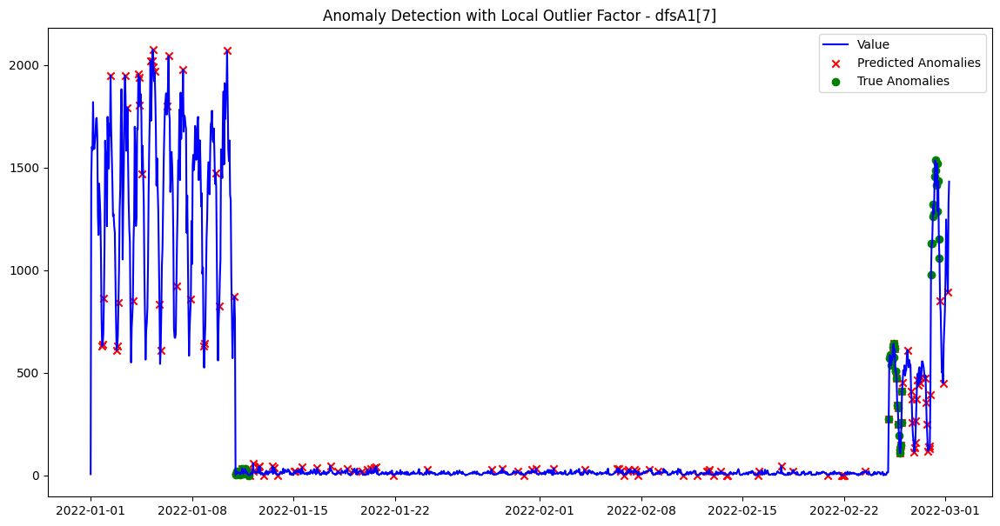

Processing dataset dfsA1[20]...


/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Best F1 Score for dfsA1[20]: 0.3692
Best Precision: 0.3750
Best Recall: 0.3636
Best Parameters: {'contamination': 'auto', 'n_neighbors': 30}


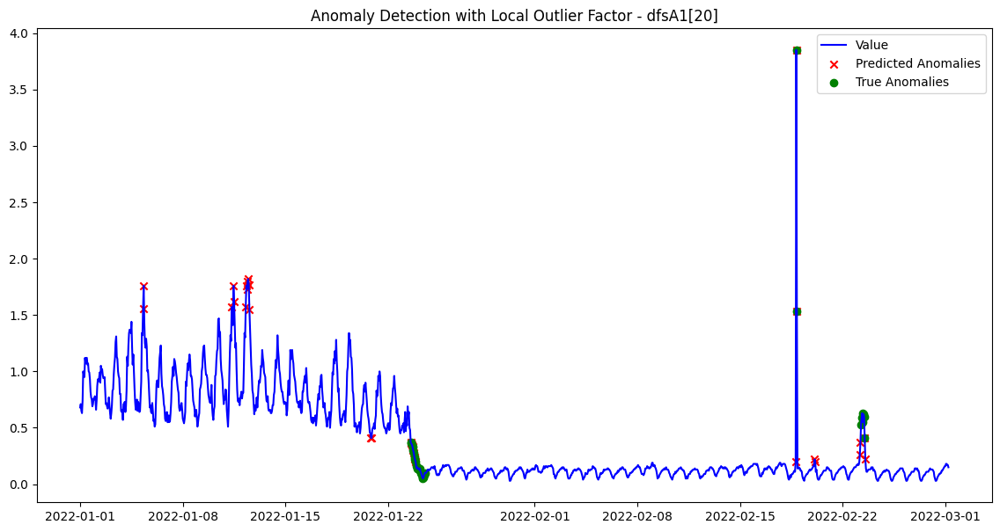

Processing dataset dfsA1[31]...


/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Best F1 Score for dfsA1[31]: 0.1481
Best Precision: 0.0952
Best Recall: 0.3333
Best Parameters: {'contamination': 'auto', 'n_neighbors': 40}


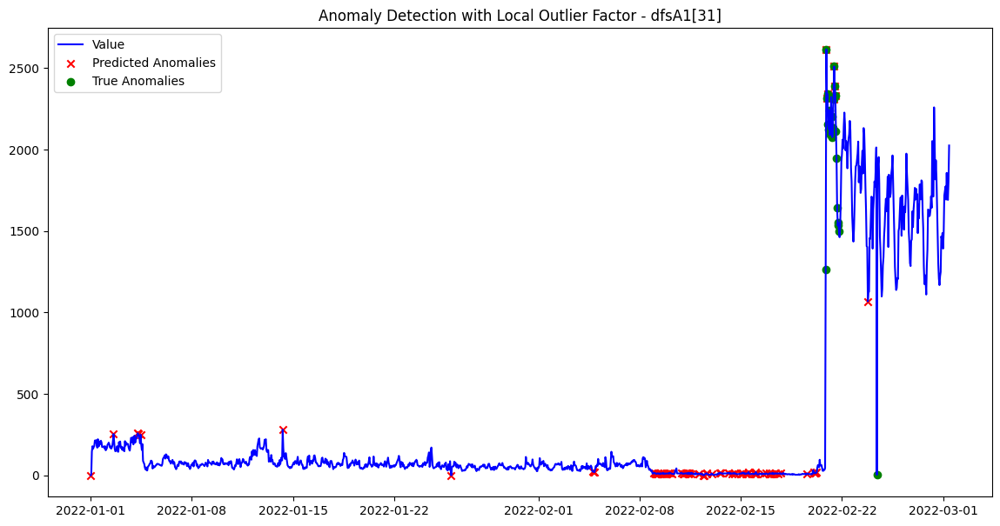

Processing dataset dfsA1[32]...
Best F1 Score for dfsA1[32]: 0.1765
Best Precision: 0.2857
Best Recall: 0.1277
Best Parameters: {'contamination': 0.02, 'n_neighbors': 10}


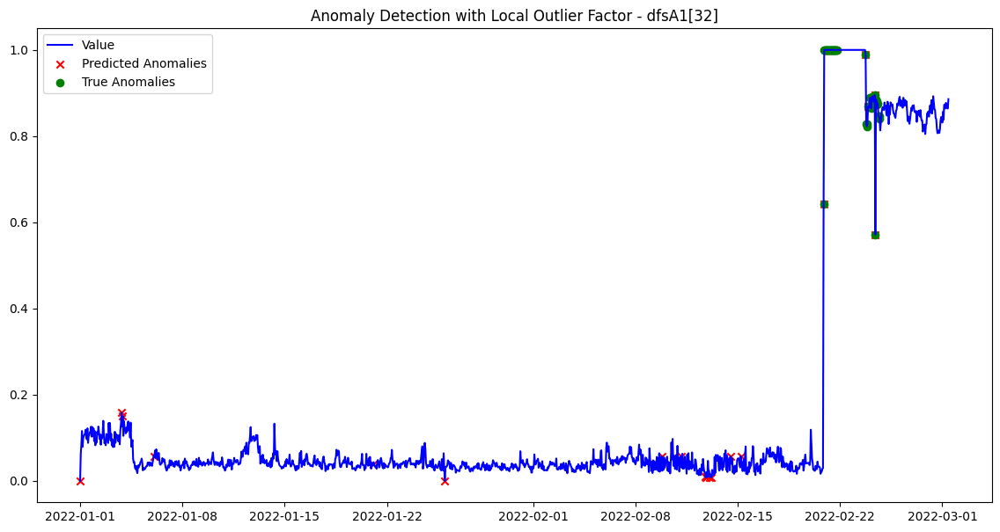

Processing dataset dfsA1[48]...
Best F1 Score for dfsA1[48]: 0.0775
Best Precision: 0.0476
Best Recall: 0.2083
Best Parameters: {'contamination': 0.1, 'n_neighbors': 10}


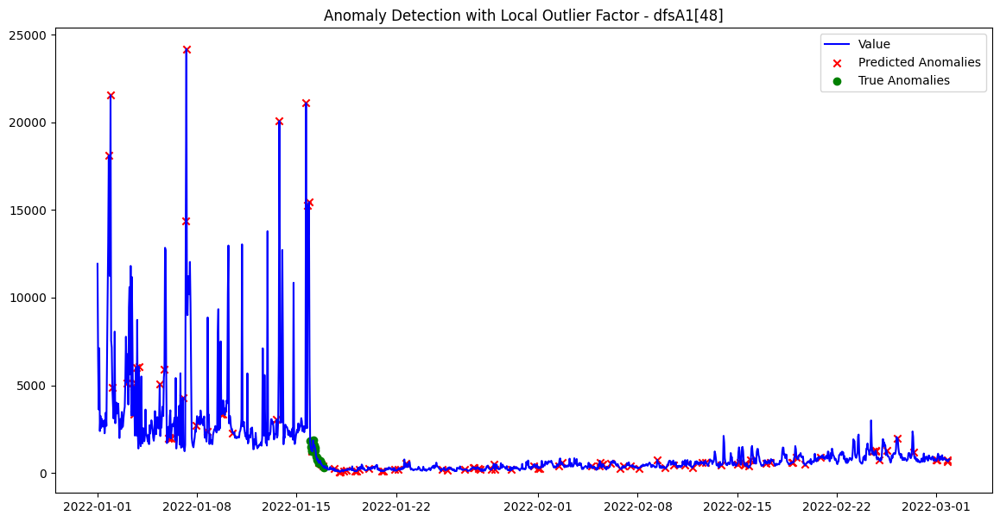

Processing dataset dfsA1[57]...
Best F1 Score for dfsA1[57]: 0.0317
Best Precision: 0.0167
Best Recall: 0.3333
Best Parameters: {'contamination': 0.05, 'n_neighbors': 20}


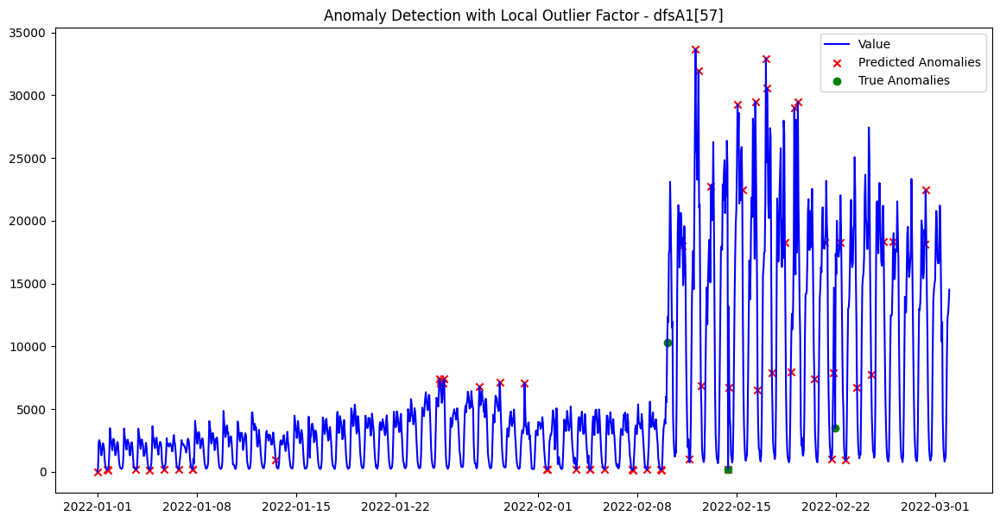

Processing dataset dfsA1[61]...


/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.p

Best F1 Score for dfsA1[61]: 0.0667
Best Precision: 0.0455
Best Recall: 0.1250
Best Parameters: {'contamination': 'auto', 'n_neighbors': 5}


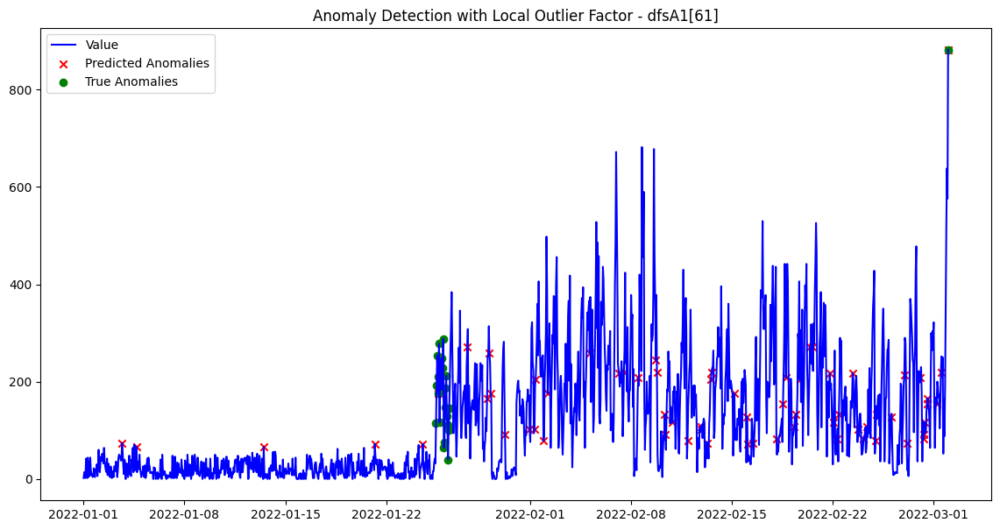

Average F1 Score across all datasets: 0.1448
Average Precision across all datasets: 0.1386
Average Recall across all datasets: 0.2458
All F1 Scores for each dataset: 0.1436, 0.3692, 0.1481, 0.1765, 0.0775, 0.0317, 0.0667


In [ ]:
from sklearn.neighbors import LocalOutlierFactor
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import f1_score, precision_score, recall_score
from sklearn.model_selection import ParameterGrid
import matplotlib.pyplot as plt
import pandas as pd

# Define A1A and ParameterGrid for hyperparameter tuning
A1B = [7,20,31,32,48,57,61]
param_grid = {
    'n_neighbors': [5, 10, 20, 30, 40],
    'contamination': ['auto', 0.01, 0.02, 0.05, 0.1]
}
grid = ParameterGrid(param_grid)

# To calculate the average F1 score, precision, and recall
f1_scores = []
precision_scores = []
recall_scores = []

# Iterate through datasets
for i in A1B:
    print(f"Processing dataset dfsA1[{i}]...")

    # Feature engineering (you'll need to implement this function)
    data_features = dfsA1[i]

    # Separate features and labels
    X = data_features.drop(columns=['label'])  # Drop the label column
    y = data_features['label']  # Ground truth labels

    # Standardize features
    scaler = StandardScaler()
    X_scaled = scaler.fit_transform(X)

    # Estimate contamination
   # contamination = y.sum() / len(y)

    # Hyperparameter tuning using grid search
    best_f1 = -1
    best_precision = -1
    best_recall = -1
    best_params = None
    best_predictions = None

    for params in grid:
        # Update contamination dynamically if it's 'auto'
       # if params['contamination'] == 'auto':
        #    params['contamination'] = contamination

        # Train Local Outlier Factor with current parameters
        lof = LocalOutlierFactor(
            n_neighbors=params['n_neighbors'],
            contamination=params['contamination'],
            novelty=True
        )
        lof.fit(X_scaled)
        predictions = lof.predict(X_scaled)

        # Map predictions to binary (1 = anomaly, 0 = normal)
        predictions = [1 if pred == -1 else 0 for pred in predictions]

        # Calculate metrics
        f1 = f1_score(y, predictions)
        precision = precision_score(y, predictions)
        recall = recall_score(y, predictions)

        # Update best parameters if current F1 is better
        if f1 > best_f1:
            best_f1 = f1
            best_precision = precision
            best_recall = recall
            best_params = params
            best_predictions = predictions

    # Append best metrics for the dataset
    f1_scores.append(best_f1)
    precision_scores.append(best_precision)
    recall_scores.append(best_recall)

    # Output best parameters and metrics for current dataset
    print(f"Best F1 Score for dfsA1[{i}]: {best_f1:.4f}")
    print(f"Best Precision: {best_precision:.4f}")
    print(f"Best Recall: {best_recall:.4f}")
    print(f"Best Parameters: {best_params}")

    # Add predictions to the original DataFrame for inspection
    data_features['predictions'] = best_predictions

    # Visualize anomalies
    plt.figure(figsize=(14, 7))
    plt.plot(data_features.index, data_features[f"value_{i}"], label='Value', color='blue')
    plt.scatter(data_features[data_features['predictions'] == 1].index,
                data_features[data_features['predictions'] == 1][f"value_{i}"],
                color='red', label='Predicted Anomalies', marker='x')
    plt.scatter(data_features[data_features['label'] == 1].index,
                data_features[data_features['label'] == 1][f"value_{i}"],
                color='green', label='True Anomalies', marker='o')

    plt.title(f'Anomaly Detection with Local Outlier Factor - dfsA1[{i}]')
    plt.legend()
    plt.show()

# Calculate and output the average metrics
avg_f1_score = sum(f1_scores) / len(f1_scores)
avg_precision = sum(precision_scores) / len(precision_scores)
avg_recall = sum(recall_scores) / len(recall_scores)
print(f"Average F1 Score across all datasets: {avg_f1_score:.4f}")
print(f"Average Precision across all datasets: {avg_precision:.4f}")
print(f"Average Recall across all datasets: {avg_recall:.4f}")
# Print each F1 score formatted individually
formatted_f1_scores = [f"{score:.4f}" for score in f1_scores]
print(f"All F1 Scores for each dataset: {', '.join(formatted_f1_scores)}")



### Yahoo A1C - contextual and collective anomalies

## TEMP

Processing dataset dfsA1[17]...
Best F1 Score for dfsA1[17]: 0.4095
Best Precision: 0.6273
Best Recall: 0.3040
Best Parameters: {'contamination': 0.1, 'n_neighbors': 10}


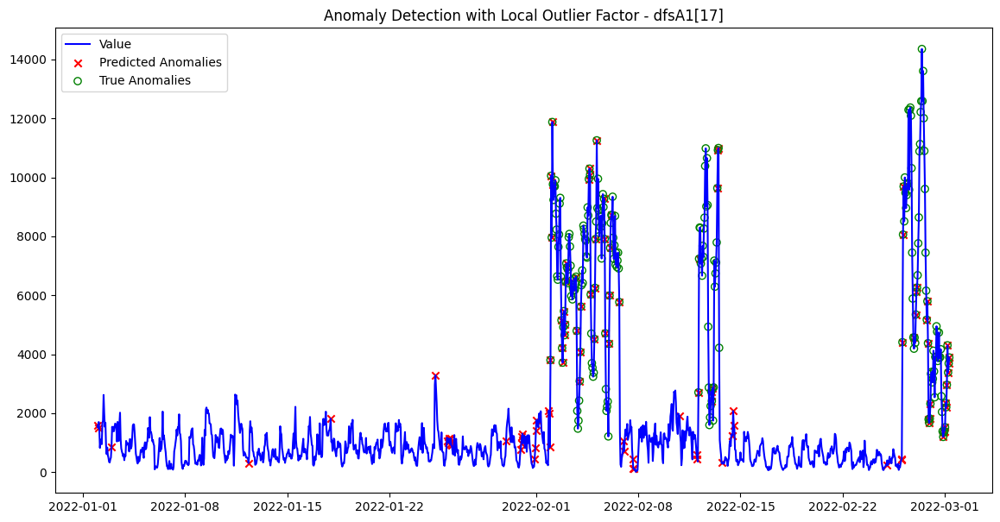

Processing dataset dfsA1[19]...
Best F1 Score for dfsA1[19]: 0.3775
Best Precision: 0.5234
Best Recall: 0.2952
Best Parameters: {'contamination': 0.1, 'n_neighbors': 40}


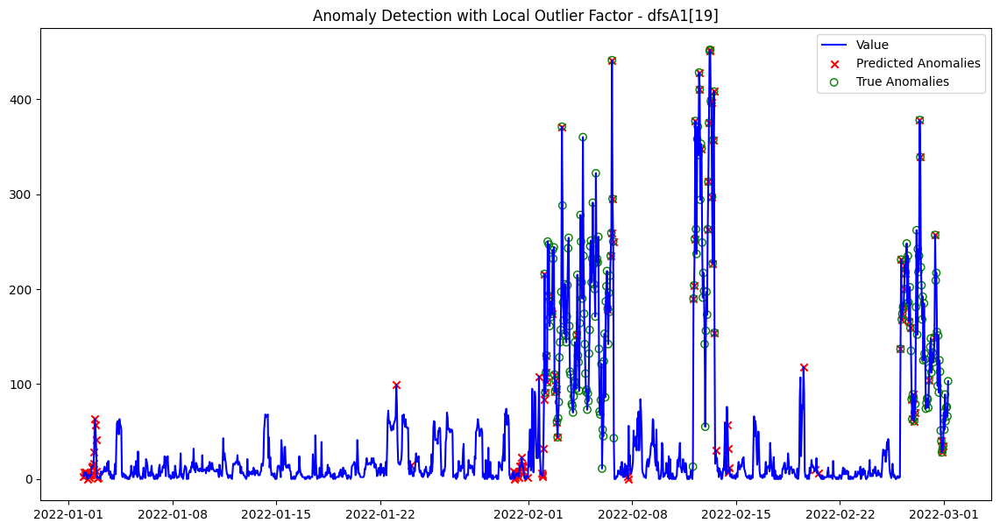

Processing dataset dfsA1[26]...
Best F1 Score for dfsA1[26]: 0.0889
Best Precision: 0.2667
Best Recall: 0.0533
Best Parameters: {'contamination': 0.02, 'n_neighbors': 10}


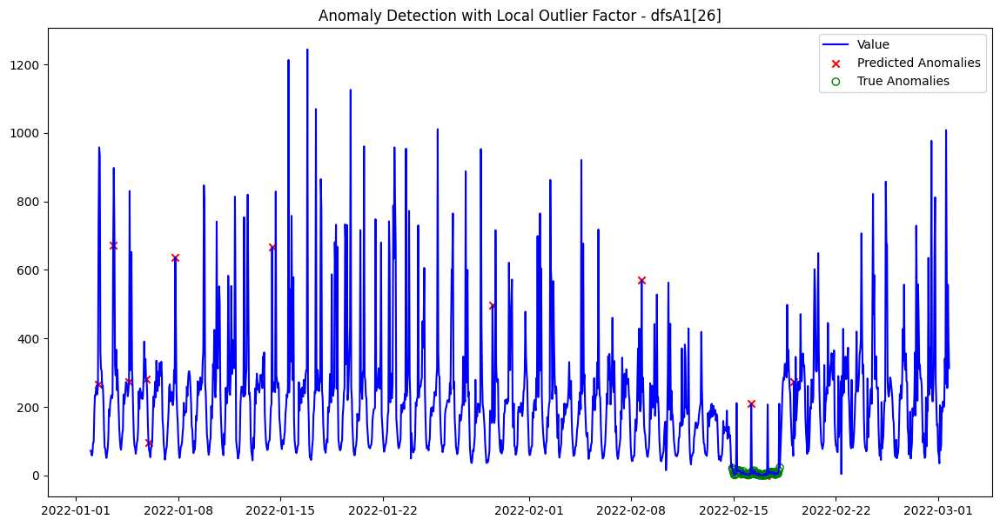

Processing dataset dfsA1[37]...
Best F1 Score for dfsA1[37]: 0.4068
Best Precision: 0.4800
Best Recall: 0.3529
Best Parameters: {'contamination': 0.02, 'n_neighbors': 40}


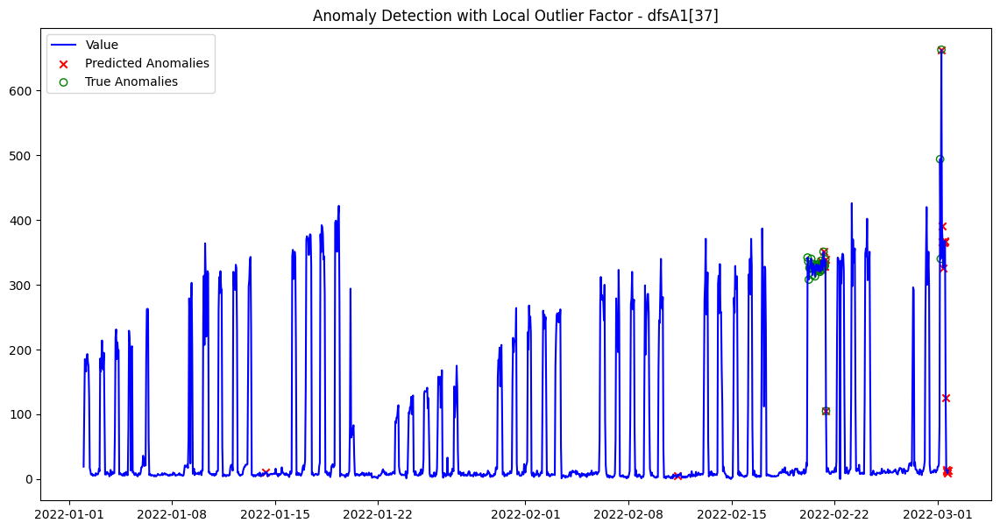

Processing dataset dfsA1[40]...


/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Best F1 Score for dfsA1[40]: 0.0769
Best Precision: 0.1000
Best Recall: 0.0625
Best Parameters: {'contamination': 0.05, 'n_neighbors': 10}


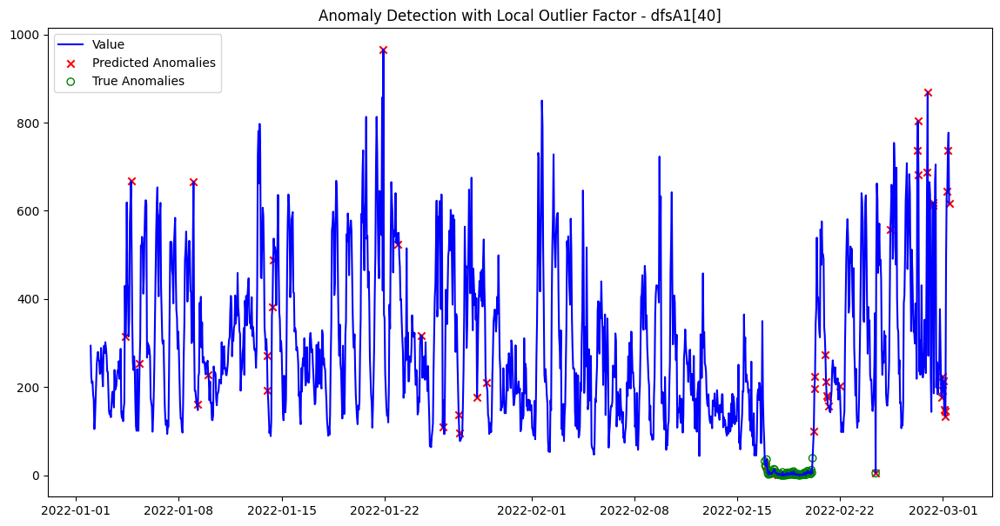

Processing dataset dfsA1[47]...
Best F1 Score for dfsA1[47]: 0.5263
Best Precision: 0.5556
Best Recall: 0.5000
Best Parameters: {'contamination': 0.01, 'n_neighbors': 10}


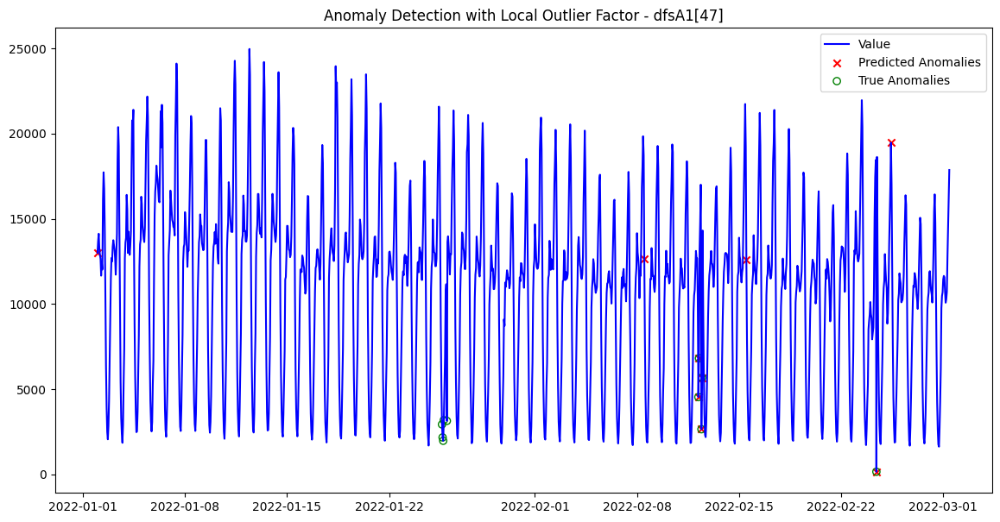

Average F1 Score across all datasets: 0.3143
Average Precision across all datasets: 0.4255
Average Recall across all datasets: 0.2613
All F1 Scores for each dataset: 0.4095, 0.3775, 0.0889, 0.4068, 0.0769, 0.5263


In [ ]:
from sklearn.neighbors import LocalOutlierFactor
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import f1_score, precision_score, recall_score
from sklearn.model_selection import ParameterGrid
import matplotlib.pyplot as plt
import pandas as pd

# Define A1A and ParameterGrid for hyperparameter tuning
A1C = [17, 19, 26, 37, 40, 47]
param_grid = {
    'n_neighbors': [5, 10, 20, 30, 40],
    'contamination': ['auto', 0.01, 0.02, 0.05, 0.1]
}
grid = ParameterGrid(param_grid)

# To calculate the average F1 score, precision, and recall
f1_scores = []
precision_scores = []
recall_scores = []

# Iterate through datasets
for i in A1C:
    print(f"Processing dataset dfsA1[{i}]...")

    # Feature engineering (you'll need to implement this function)
    data_features = feature_engineering(dfsA1[i], value_col=f"value_{i}", window_size=24)

    # Separate features and labels
    X = data_features.drop(columns=['label'])  # Drop the label column
    y = data_features['label']  # Ground truth labels

    # Standardize features
    scaler = StandardScaler()
    X_scaled = scaler.fit_transform(X)

    # Estimate contamination
   # contamination = y.sum() / len(y)

    # Hyperparameter tuning using grid search
    best_f1 = -1
    best_precision = -1
    best_recall = -1
    best_params = None
    best_predictions = None

    for params in grid:
        # Update contamination dynamically if it's 'auto'
        #if params['contamination'] == 'auto':
        #    params['contamination'] = contamination

        # Train Local Outlier Factor with current parameters
        lof = LocalOutlierFactor(
            n_neighbors=params['n_neighbors'],
            contamination=params['contamination'],
            novelty=True
        )
        lof.fit(X_scaled)
        predictions = lof.predict(X_scaled)

        # Map predictions to binary (1 = anomaly, 0 = normal)
        predictions = [1 if pred == -1 else 0 for pred in predictions]

        # Calculate metrics
        f1 = f1_score(y, predictions)
        precision = precision_score(y, predictions)
        recall = recall_score(y, predictions)

        # Update best parameters if current F1 is better
        if f1 > best_f1:
            best_f1 = f1
            best_precision = precision
            best_recall = recall
            best_params = params
            best_predictions = predictions

    # Append best metrics for the dataset
    f1_scores.append(best_f1)
    precision_scores.append(best_precision)
    recall_scores.append(best_recall)

    # Output best parameters and metrics for current dataset
    print(f"Best F1 Score for dfsA1[{i}]: {best_f1:.4f}")
    print(f"Best Precision: {best_precision:.4f}")
    print(f"Best Recall: {best_recall:.4f}")
    print(f"Best Parameters: {best_params}")

    # Add predictions to the original DataFrame for inspection
    data_features['predictions'] = best_predictions

    # Visualize anomalies
    plt.figure(figsize=(14, 7))
    plt.plot(data_features.index, data_features[f"value_{i}"], label='Value', color='blue')
    plt.scatter(data_features[data_features['predictions'] == 1].index,
                data_features[data_features['predictions'] == 1][f"value_{i}"],
                color='red', label='Predicted Anomalies', marker='x')
    plt.scatter(data_features[data_features['label'] == 1].index,
                data_features[data_features['label'] == 1][f"value_{i}"],
                color='green', label='True Anomalies', marker='o', facecolors="none")

    plt.title(f'Anomaly Detection with Local Outlier Factor - dfsA1[{i}]')
    plt.legend()
    plt.show()

# Calculate and output the average metrics
avg_f1_score = sum(f1_scores) / len(f1_scores)
avg_precision = sum(precision_scores) / len(precision_scores)
avg_recall = sum(recall_scores) / len(recall_scores)
print(f"Average F1 Score across all datasets: {avg_f1_score:.4f}")
print(f"Average Precision across all datasets: {avg_precision:.4f}")
print(f"Average Recall across all datasets: {avg_recall:.4f}")
# Print each F1 score formatted individually
formatted_f1_scores = [f"{score:.4f}" for score in f1_scores]
print(f"All F1 Scores for each dataset: {', '.join(formatted_f1_scores)}")


## NO TEMP

Processing dataset dfsA1[17]...
Best F1 Score for dfsA1[17]: 0.3173
Best Precision: 0.4444
Best Recall: 0.2467
Best Parameters: {'contamination': 0.1, 'n_neighbors': 30}


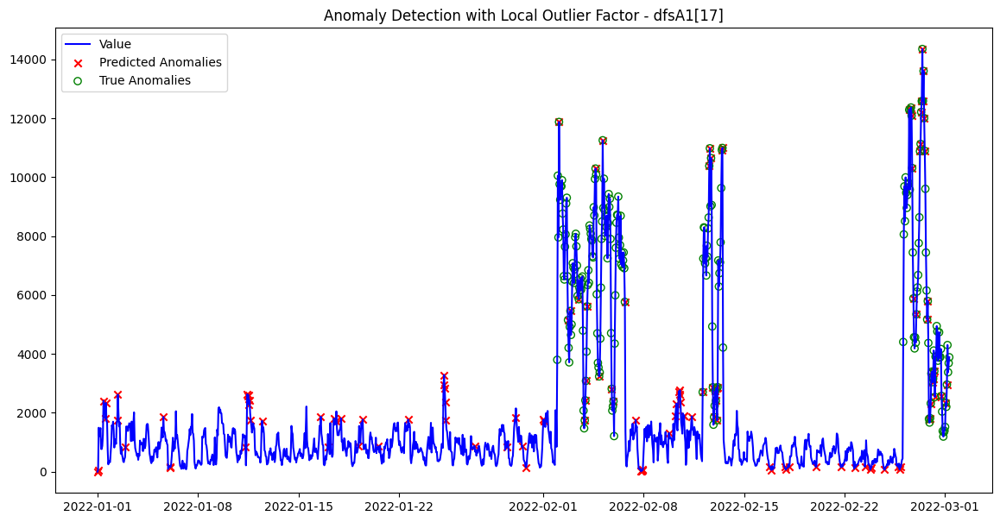

Processing dataset dfsA1[19]...


/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.p

Best F1 Score for dfsA1[19]: 0.4451
Best Precision: 0.6471
Best Recall: 0.3392
Best Parameters: {'contamination': 0.1, 'n_neighbors': 10}


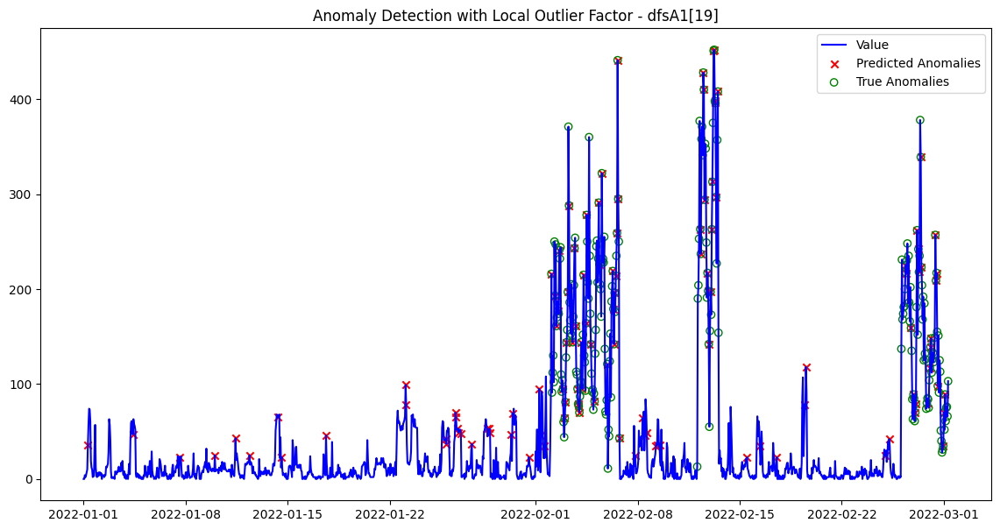

Processing dataset dfsA1[26]...
Best F1 Score for dfsA1[26]: 0.3768
Best Precision: 0.4127
Best Recall: 0.3467
Best Parameters: {'contamination': 0.05, 'n_neighbors': 30}


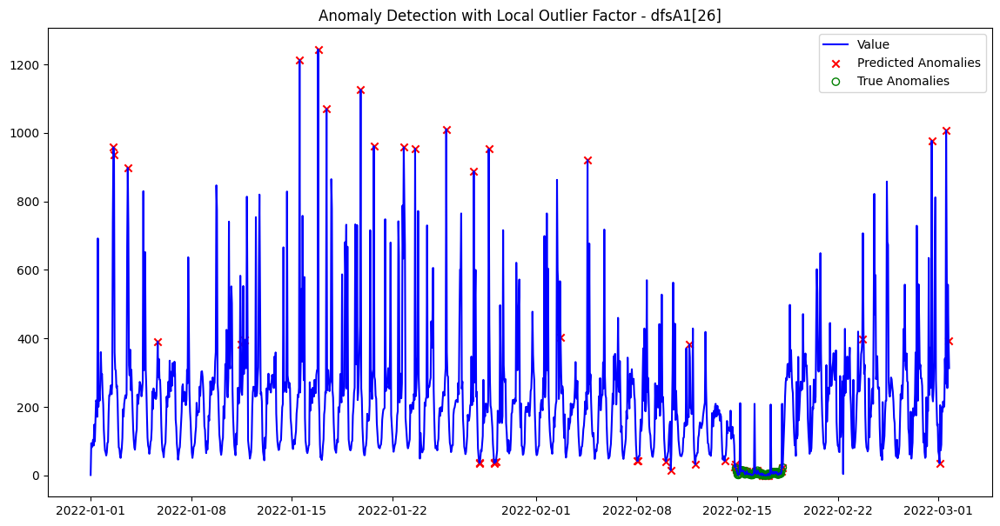

Processing dataset dfsA1[37]...


/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Best F1 Score for dfsA1[37]: 0.1161
Best Precision: 0.0744
Best Recall: 0.2647
Best Parameters: {'contamination': 0.1, 'n_neighbors': 20}


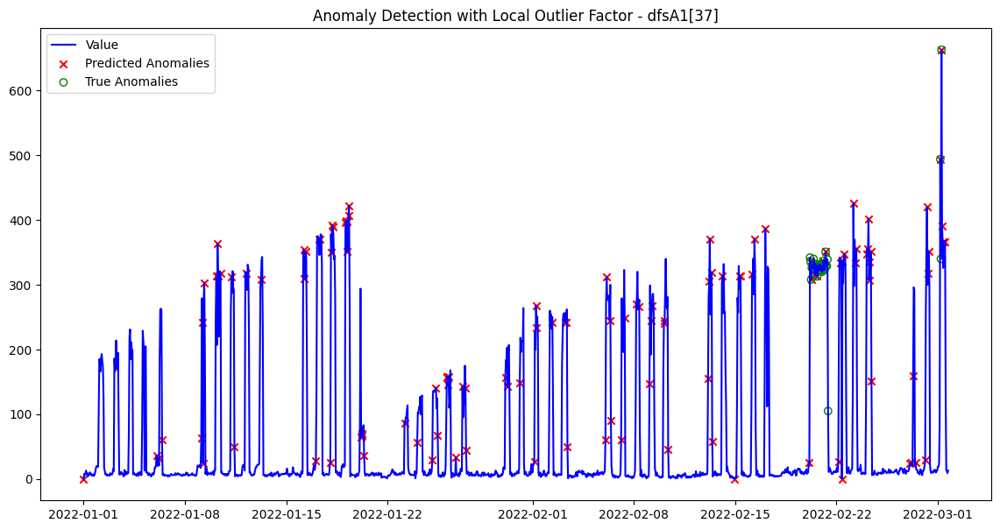

Processing dataset dfsA1[40]...


/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Best F1 Score for dfsA1[40]: 0.4065
Best Precision: 0.5814
Best Recall: 0.3125
Best Parameters: {'contamination': 'auto', 'n_neighbors': 10}


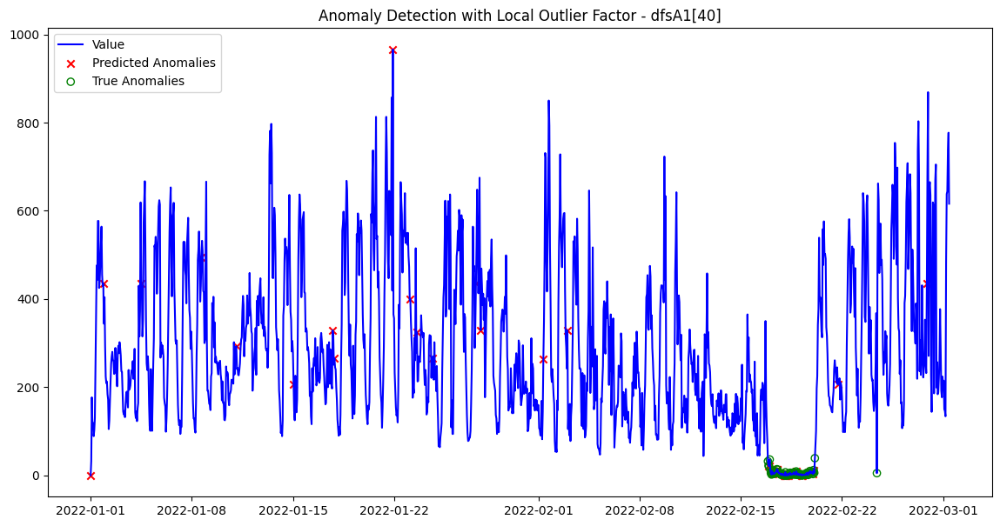

Processing dataset dfsA1[47]...
Best F1 Score for dfsA1[47]: 0.1176
Best Precision: 0.1429
Best Recall: 0.1000
Best Parameters: {'contamination': 'auto', 'n_neighbors': 10}


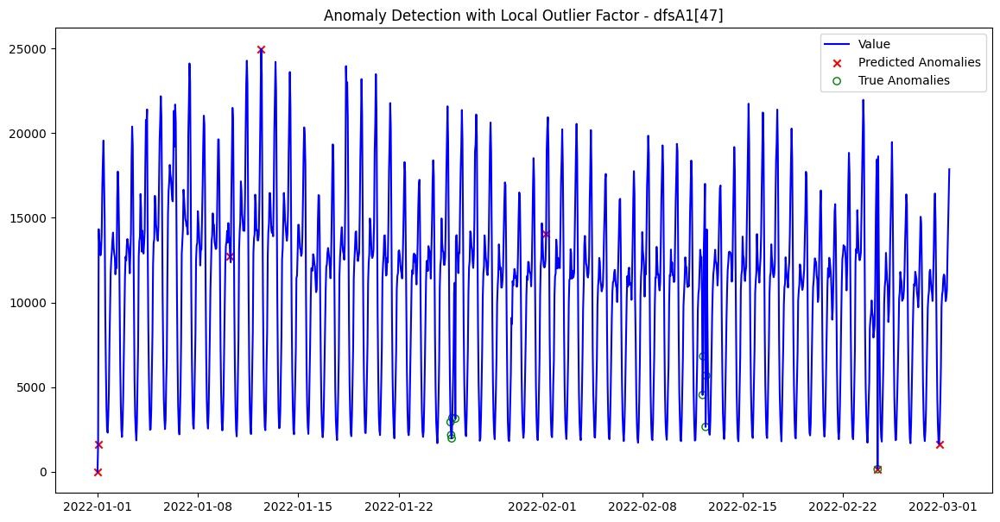

Average F1 Score across all datasets: 0.2966
Average Precision across all datasets: 0.3838
Average Recall across all datasets: 0.2683
All F1 Scores for each dataset: 0.3173, 0.4451, 0.3768, 0.1161, 0.4065, 0.1176


In [ ]:
from sklearn.neighbors import LocalOutlierFactor
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import f1_score, precision_score, recall_score
from sklearn.model_selection import ParameterGrid
import matplotlib.pyplot as plt
import pandas as pd

# Define A1A and ParameterGrid for hyperparameter tuning
A1C = [17, 19, 26, 37, 40, 47]
param_grid = {
    'n_neighbors': [5, 10, 20, 30, 40],
    'contamination': ['auto', 0.01, 0.02, 0.05, 0.1]
}
grid = ParameterGrid(param_grid)

# To calculate the average F1 score, precision, and recall
f1_scores = []
precision_scores = []
recall_scores = []

# Iterate through datasets
for i in A1C:
    print(f"Processing dataset dfsA1[{i}]...")

    # Feature engineering (you'll need to implement this function)
    data_features = dfsA1[i]

    # Separate features and labels
    X = data_features.drop(columns=['label'])  # Drop the label column
    y = data_features['label']  # Ground truth labels

    # Standardize features
    scaler = StandardScaler()
    X_scaled = scaler.fit_transform(X)

    # Estimate contamination
   # contamination = y.sum() / len(y)

    # Hyperparameter tuning using grid search
    best_f1 = -1
    best_precision = -1
    best_recall = -1
    best_params = None
    best_predictions = None

    for params in grid:
        # Update contamination dynamically if it's 'auto'
        #if params['contamination'] == 'auto':
        #    params['contamination'] = contamination

        # Train Local Outlier Factor with current parameters
        lof = LocalOutlierFactor(
            n_neighbors=params['n_neighbors'],
            contamination=params['contamination'],
            novelty=True
        )
        lof.fit(X_scaled)
        predictions = lof.predict(X_scaled)

        # Map predictions to binary (1 = anomaly, 0 = normal)
        predictions = [1 if pred == -1 else 0 for pred in predictions]

        # Calculate metrics
        f1 = f1_score(y, predictions)
        precision = precision_score(y, predictions)
        recall = recall_score(y, predictions)

        # Update best parameters if current F1 is better
        if f1 > best_f1:
            best_f1 = f1
            best_precision = precision
            best_recall = recall
            best_params = params
            best_predictions = predictions

    # Append best metrics for the dataset
    f1_scores.append(best_f1)
    precision_scores.append(best_precision)
    recall_scores.append(best_recall)

    # Output best parameters and metrics for current dataset
    print(f"Best F1 Score for dfsA1[{i}]: {best_f1:.4f}")
    print(f"Best Precision: {best_precision:.4f}")
    print(f"Best Recall: {best_recall:.4f}")
    print(f"Best Parameters: {best_params}")

    # Add predictions to the original DataFrame for inspection
    data_features['predictions'] = best_predictions

    # Visualize anomalies
    plt.figure(figsize=(14, 7))
    plt.plot(data_features.index, data_features[f"value_{i}"], label='Value', color='blue')
    plt.scatter(data_features[data_features['predictions'] == 1].index,
                data_features[data_features['predictions'] == 1][f"value_{i}"],
                color='red', label='Predicted Anomalies', marker='x')
    plt.scatter(data_features[data_features['label'] == 1].index,
                data_features[data_features['label'] == 1][f"value_{i}"],
                color='green', label='True Anomalies', marker='o',facecolors="none")

    plt.title(f'Anomaly Detection with Local Outlier Factor - dfsA1[{i}]')
    plt.legend()
    plt.show()

# Calculate and output the average metrics
avg_f1_score = sum(f1_scores) / len(f1_scores)
avg_precision = sum(precision_scores) / len(precision_scores)
avg_recall = sum(recall_scores) / len(recall_scores)
print(f"Average F1 Score across all datasets: {avg_f1_score:.4f}")
print(f"Average Precision across all datasets: {avg_precision:.4f}")
print(f"Average Recall across all datasets: {avg_recall:.4f}")
# Print each F1 score formatted individually
formatted_f1_scores = [f"{score:.4f}" for score in f1_scores]
print(f"All F1 Scores for each dataset: {', '.join(formatted_f1_scores)}")


### Yahoo A1D - Seasonality, trend and shift



## TEMP

Processing dataset dfsA1[28]...
Best F1 Score for dfsA1[28]: 0.1818
Best Precision: 0.1496
Best Recall: 0.2317
Best Parameters: {'contamination': 0.1, 'n_neighbors': 20}


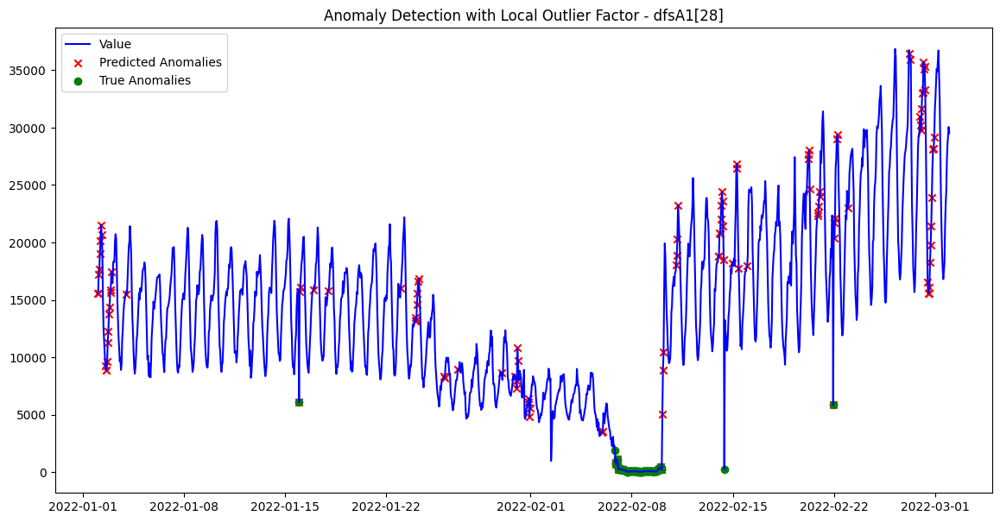

Processing dataset dfsA1[43]...
Best F1 Score for dfsA1[43]: 0.6186
Best Precision: 0.4615
Best Recall: 0.9375
Best Parameters: {'contamination': 0.05, 'n_neighbors': 40}


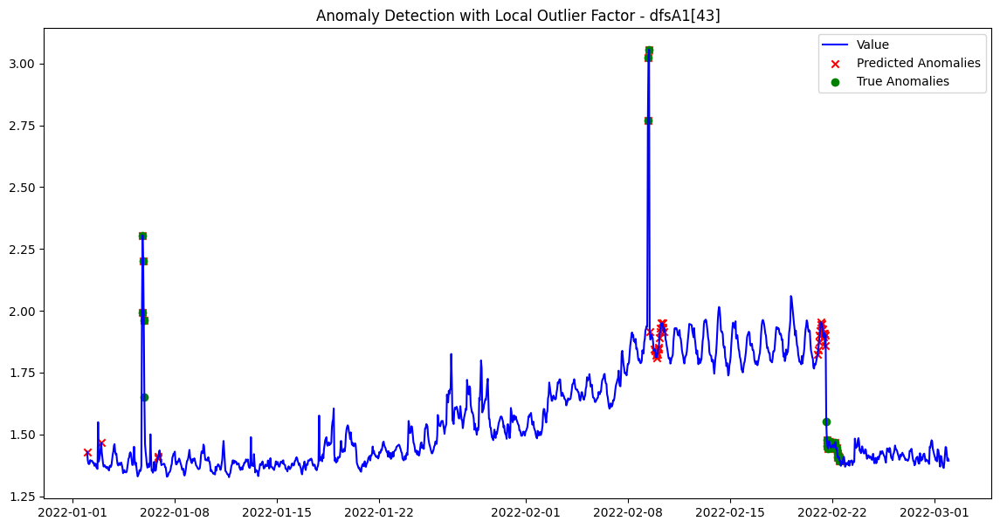

Processing dataset dfsA1[46]...
Best F1 Score for dfsA1[46]: 0.1368
Best Precision: 0.1280
Best Recall: 0.1468
Best Parameters: {'contamination': 0.1, 'n_neighbors': 30}


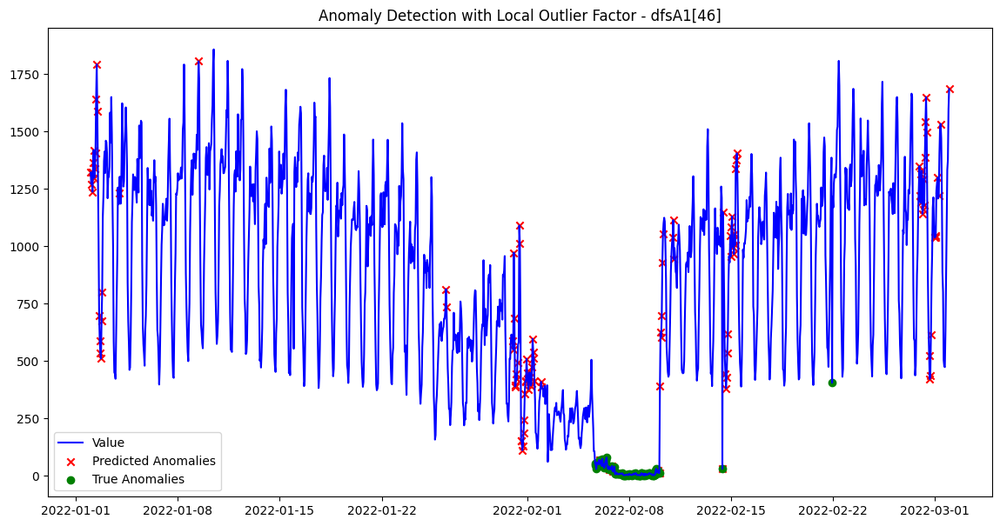

Processing dataset dfsA1[55]...
Best F1 Score for dfsA1[55]: 0.5000
Best Precision: 0.3636
Best Recall: 0.8000
Best Parameters: {'contamination': 'auto', 'n_neighbors': 5}


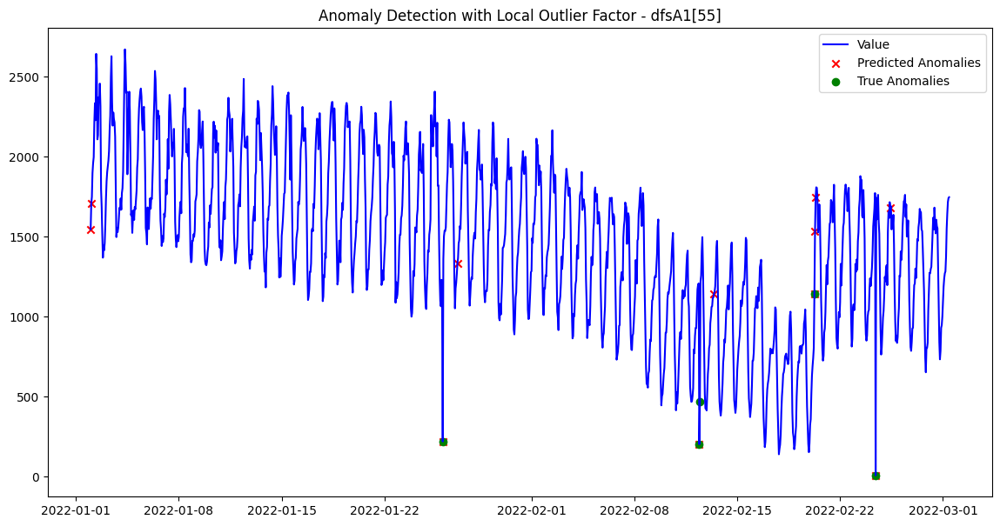

Processing dataset dfsA1[56]...
Best F1 Score for dfsA1[56]: 0.4545
Best Precision: 0.2941
Best Recall: 1.0000
Best Parameters: {'contamination': 0.02, 'n_neighbors': 5}


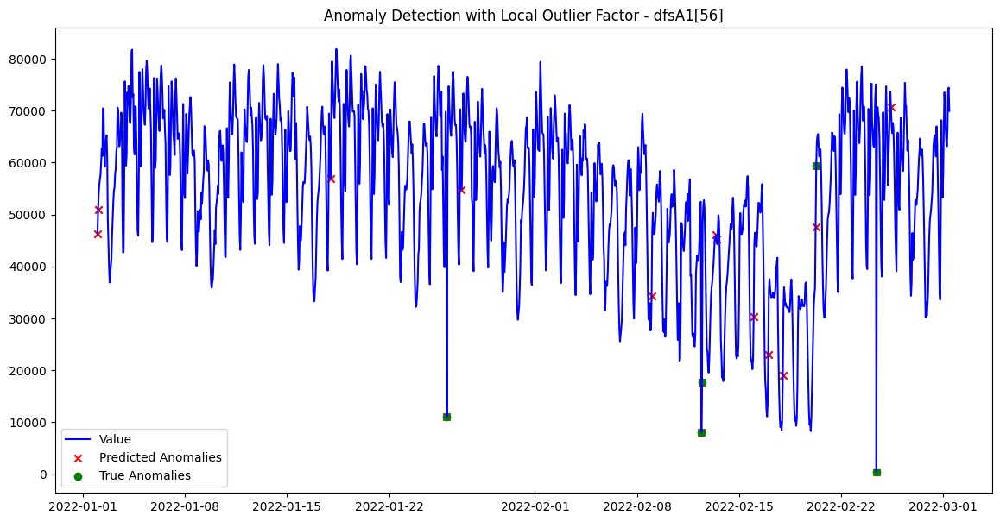

Processing dataset dfsA1[65]...
Best F1 Score for dfsA1[65]: 0.3226
Best Precision: 0.3571
Best Recall: 0.2941
Best Parameters: {'contamination': 0.01, 'n_neighbors': 40}


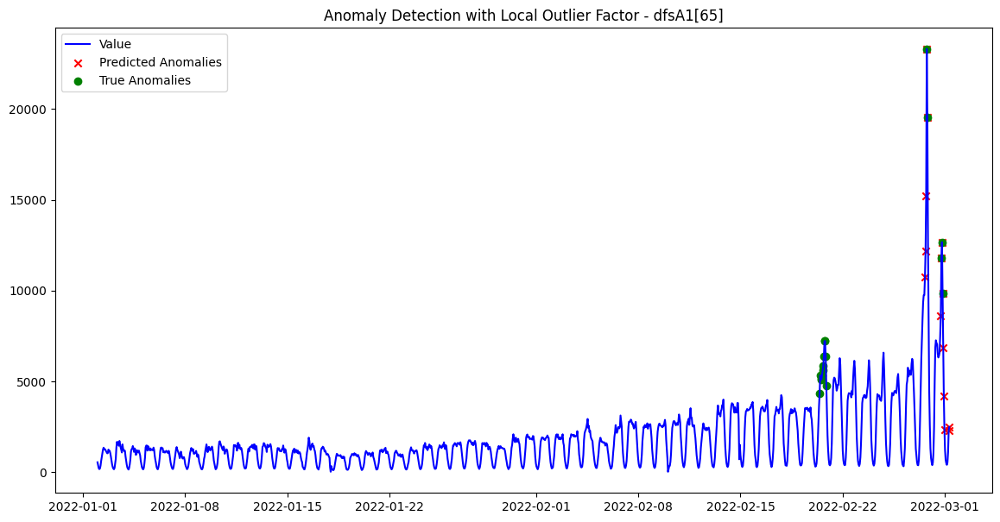

Average F1 Score across all datasets: 0.3690
Average Precision across all datasets: 0.2923
Average Recall across all datasets: 0.5684
All F1 Scores for each dataset: 0.1818, 0.6186, 0.1368, 0.5000, 0.4545, 0.3226


In [ ]:
from sklearn.neighbors import LocalOutlierFactor
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import f1_score, precision_score, recall_score
from sklearn.model_selection import ParameterGrid
import matplotlib.pyplot as plt
import pandas as pd

# Define A1A and ParameterGrid for hyperparameter tuning
A1D = [28,43,46,55,56,65]
param_grid = {
    'n_neighbors': [5, 10, 20, 30, 40],
    'contamination': ['auto', 0.01, 0.02, 0.05, 0.1]
}
grid = ParameterGrid(param_grid)

# To calculate the average F1 score, precision, and recall
f1_scores = []
precision_scores = []
recall_scores = []

# Iterate through datasets
for i in A1D:
    print(f"Processing dataset dfsA1[{i}]...")

    # Feature engineering (you'll need to implement this function)
    data_features = feature_engineering(dfsA1[i], value_col=f"value_{i}", window_size=24)

    # Separate features and labels
    X = data_features.drop(columns=['label'])  # Drop the label column
    y = data_features['label']  # Ground truth labels

    # Standardize features
    scaler = StandardScaler()
    X_scaled = scaler.fit_transform(X)

    # Estimate contamination
   # contamination = y.sum() / len(y)

    # Hyperparameter tuning using grid search
    best_f1 = -1
    best_precision = -1
    best_recall = -1
    best_params = None
    best_predictions = None

    for params in grid:
        # Update contamination dynamically if it's 'auto'
       # if params['contamination'] == 'auto':
        #    params['contamination'] = contamination

        # Train Local Outlier Factor with current parameters
        lof = LocalOutlierFactor(
            n_neighbors=params['n_neighbors'],
            contamination=params['contamination'],
            novelty=True
        )
        lof.fit(X_scaled)
        predictions = lof.predict(X_scaled)

        # Map predictions to binary (1 = anomaly, 0 = normal)
        predictions = [1 if pred == -1 else 0 for pred in predictions]

        # Calculate metrics
        f1 = f1_score(y, predictions)
        precision = precision_score(y, predictions)
        recall = recall_score(y, predictions)

        # Update best parameters if current F1 is better
        if f1 > best_f1:
            best_f1 = f1
            best_precision = precision
            best_recall = recall
            best_params = params
            best_predictions = predictions

    # Append best metrics for the dataset
    f1_scores.append(best_f1)
    precision_scores.append(best_precision)
    recall_scores.append(best_recall)

    # Output best parameters and metrics for current dataset
    print(f"Best F1 Score for dfsA1[{i}]: {best_f1:.4f}")
    print(f"Best Precision: {best_precision:.4f}")
    print(f"Best Recall: {best_recall:.4f}")
    print(f"Best Parameters: {best_params}")

    # Add predictions to the original DataFrame for inspection
    data_features['predictions'] = best_predictions

    # Visualize anomalies
    plt.figure(figsize=(14, 7))
    plt.plot(data_features.index, data_features[f"value_{i}"], label='Value', color='blue')
    plt.scatter(data_features[data_features['predictions'] == 1].index,
                data_features[data_features['predictions'] == 1][f"value_{i}"],
                color='red', label='Predicted Anomalies', marker='x')
    plt.scatter(data_features[data_features['label'] == 1].index,
                data_features[data_features['label'] == 1][f"value_{i}"],
                color='green', label='True Anomalies', marker='o')

    plt.title(f'Anomaly Detection with Local Outlier Factor - dfsA1[{i}]')
    plt.legend()
    plt.show()

# Calculate and output the average metrics
avg_f1_score = sum(f1_scores) / len(f1_scores)
avg_precision = sum(precision_scores) / len(precision_scores)
avg_recall = sum(recall_scores) / len(recall_scores)
print(f"Average F1 Score across all datasets: {avg_f1_score:.4f}")
print(f"Average Precision across all datasets: {avg_precision:.4f}")
print(f"Average Recall across all datasets: {avg_recall:.4f}")
# Print each F1 score formatted individually
formatted_f1_scores = [f"{score:.4f}" for score in f1_scores]
print(f"All F1 Scores for each dataset: {', '.join(formatted_f1_scores)}")



## NO TEMP

Processing dataset dfsA1[28]...
Best F1 Score for dfsA1[28]: 0.4909
Best Precision: 0.9643
Best Recall: 0.3293
Best Parameters: {'contamination': 0.02, 'n_neighbors': 30}


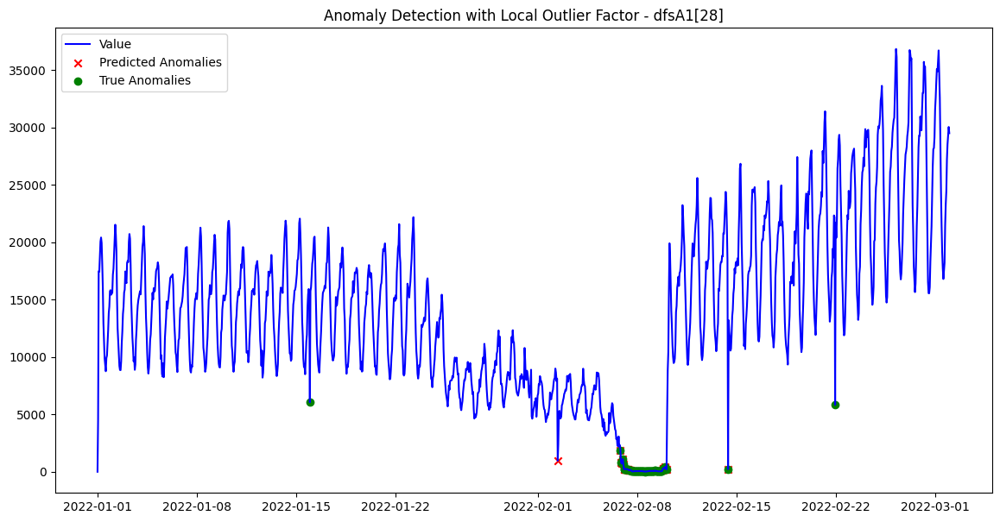

Processing dataset dfsA1[43]...
Best F1 Score for dfsA1[43]: 0.2667
Best Precision: 0.4615
Best Recall: 0.1875
Best Parameters: {'contamination': 0.01, 'n_neighbors': 10}


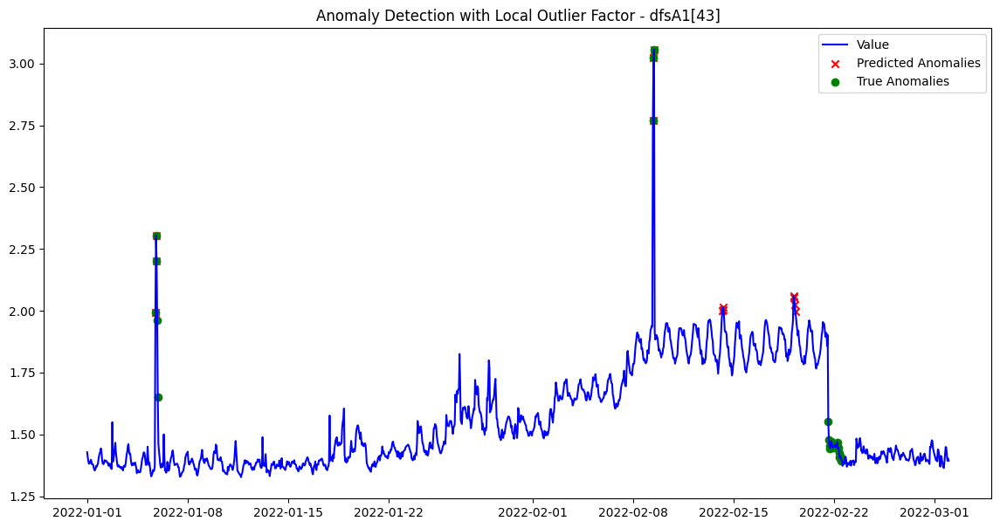

Processing dataset dfsA1[46]...
Best F1 Score for dfsA1[46]: 0.4889
Best Precision: 0.6197
Best Recall: 0.4037
Best Parameters: {'contamination': 0.05, 'n_neighbors': 40}


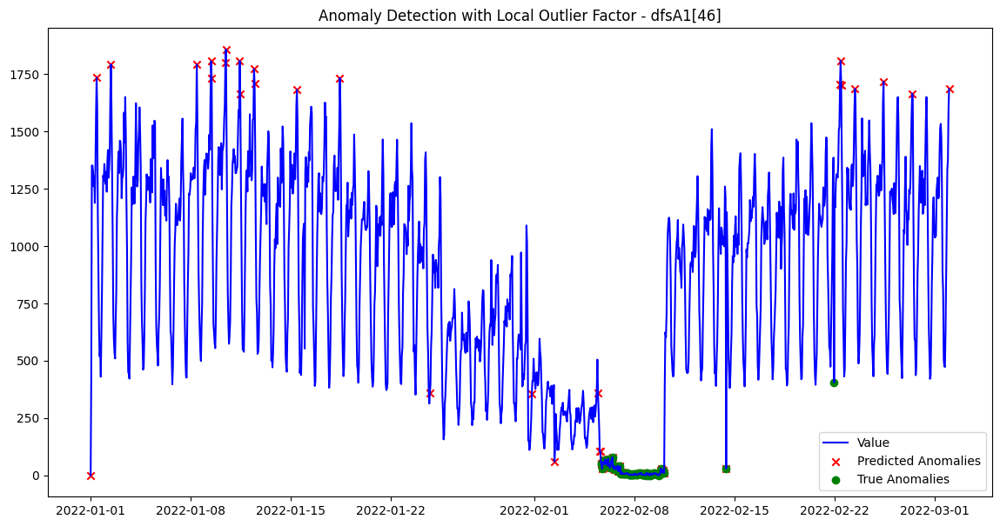

Processing dataset dfsA1[55]...
Best F1 Score for dfsA1[55]: 0.2500
Best Precision: 0.3333
Best Recall: 0.2000
Best Parameters: {'contamination': 0.00350385423966363, 'n_neighbors': 10}


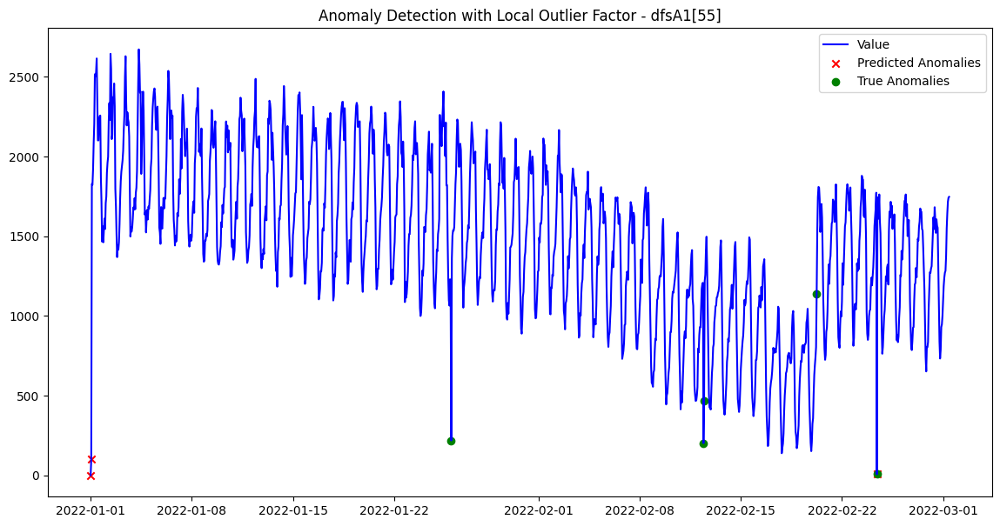

Processing dataset dfsA1[56]...
Best F1 Score for dfsA1[56]: 0.2500
Best Precision: 0.3333
Best Recall: 0.2000
Best Parameters: {'contamination': 0.00350385423966363, 'n_neighbors': 5}


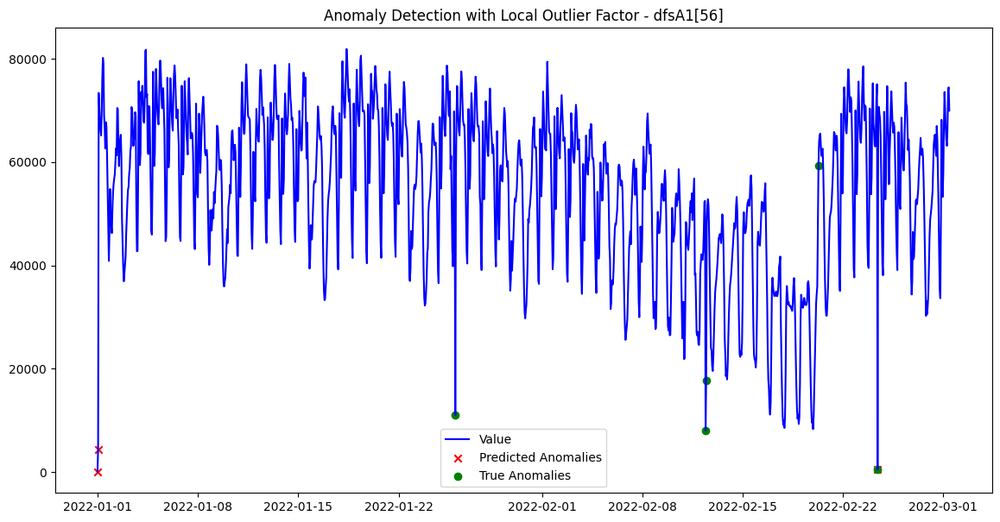

Processing dataset dfsA1[65]...
Best F1 Score for dfsA1[65]: 0.3226
Best Precision: 0.3571
Best Recall: 0.2941
Best Parameters: {'contamination': 0.01, 'n_neighbors': 30}


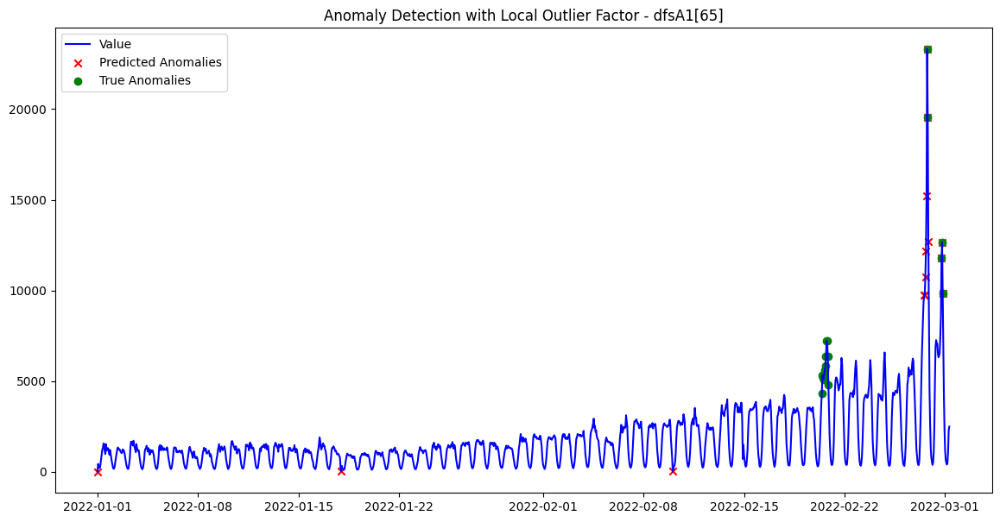

Average F1 Score across all datasets: 0.3448
Average Precision across all datasets: 0.5116
Average Recall across all datasets: 0.2691
All F1 Scores for each dataset: 0.4909, 0.2667, 0.4889, 0.2500, 0.2500, 0.3226


In [ ]:
from sklearn.neighbors import LocalOutlierFactor
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import f1_score, precision_score, recall_score
from sklearn.model_selection import ParameterGrid
import matplotlib.pyplot as plt
import pandas as pd

# Define A1A and ParameterGrid for hyperparameter tuning
A1D = [28,43,46,55,56,65]
param_grid = {
    'n_neighbors': [5, 10, 20, 30, 40],
    'contamination': ['auto', 0.01, 0.02, 0.05, 0.1]
}
grid = ParameterGrid(param_grid)

# To calculate the average F1 score, precision, and recall
f1_scores = []
precision_scores = []
recall_scores = []

# Iterate through datasets
for i in A1D:
    print(f"Processing dataset dfsA1[{i}]...")

    # Feature engineering (you'll need to implement this function)
    data_features = dfsA1[i]

    # Separate features and labels
    X = data_features.drop(columns=['label'])  # Drop the label column
    y = data_features['label']  # Ground truth labels

    # Standardize features
    scaler = StandardScaler()
    X_scaled = scaler.fit_transform(X)

    # Estimate contamination
    contamination = y.sum() / len(y)

    # Hyperparameter tuning using grid search
    best_f1 = -1
    best_precision = -1
    best_recall = -1
    best_params = None
    best_predictions = None

    for params in grid:
        # Update contamination dynamically if it's 'auto'
        if params['contamination'] == 'auto':
            params['contamination'] = contamination

        # Train Local Outlier Factor with current parameters
        lof = LocalOutlierFactor(
            n_neighbors=params['n_neighbors'],
            contamination=params['contamination'],
            novelty=True
        )
        lof.fit(X_scaled)
        predictions = lof.predict(X_scaled)

        # Map predictions to binary (1 = anomaly, 0 = normal)
        predictions = [1 if pred == -1 else 0 for pred in predictions]

        # Calculate metrics
        f1 = f1_score(y, predictions)
        precision = precision_score(y, predictions)
        recall = recall_score(y, predictions)

        # Update best parameters if current F1 is better
        if f1 > best_f1:
            best_f1 = f1
            best_precision = precision
            best_recall = recall
            best_params = params
            best_predictions = predictions

    # Append best metrics for the dataset
    f1_scores.append(best_f1)
    precision_scores.append(best_precision)
    recall_scores.append(best_recall)

    # Output best parameters and metrics for current dataset
    print(f"Best F1 Score for dfsA1[{i}]: {best_f1:.4f}")
    print(f"Best Precision: {best_precision:.4f}")
    print(f"Best Recall: {best_recall:.4f}")
    print(f"Best Parameters: {best_params}")

    # Add predictions to the original DataFrame for inspection
    data_features['predictions'] = best_predictions

    # Visualize anomalies
    plt.figure(figsize=(14, 7))
    plt.plot(data_features.index, data_features[f"value_{i}"], label='Value', color='blue')
    plt.scatter(data_features[data_features['predictions'] == 1].index,
                data_features[data_features['predictions'] == 1][f"value_{i}"],
                color='red', label='Predicted Anomalies', marker='x')
    plt.scatter(data_features[data_features['label'] == 1].index,
                data_features[data_features['label'] == 1][f"value_{i}"],
                color='green', label='True Anomalies', marker='o')

    plt.title(f'Anomaly Detection with Local Outlier Factor - dfsA1[{i}]')
    plt.legend()
    plt.show()

# Calculate and output the average metrics
avg_f1_score = sum(f1_scores) / len(f1_scores)
avg_precision = sum(precision_scores) / len(precision_scores)
avg_recall = sum(recall_scores) / len(recall_scores)
print(f"Average F1 Score across all datasets: {avg_f1_score:.4f}")
print(f"Average Precision across all datasets: {avg_precision:.4f}")
print(f"Average Recall across all datasets: {avg_recall:.4f}")
# Print each F1 score formatted individually
formatted_f1_scores = [f"{score:.4f}" for score in f1_scores]
print(f"All F1 Scores for each dataset: {', '.join(formatted_f1_scores)}")



## NAB


In [ ]:
import warnings
warnings.filterwarnings("ignore", category=FutureWarning)
warnings.filterwarnings("ignore", category=pd.errors.SettingWithCopyWarning)


data = {}
path = '/content/drive/My Drive/NAB/data'

def addFolderAndReadAll(f_name):
    data[f_name] = {}
    csvs = os.listdir(path + '/' + f_name)
    csvs_num = 0
    for csv in csvs:
        data[f_name][csv] = pd.read_csv(path + '/' + f_name + '/' + csv)
        csvs_num += 1
    return csvs_num

csvs_num = sum([addFolderAndReadAll(f_name) for f_name in os.listdir(path)])

with open('/content/drive//My Drive/NAB/labels/combined_windows.json', 'r') as file:
    labels = json.load(file)

for key1 in data:
    for key2 in data[key1]:
        one_csv_labels = labels[key1+'/'+key2]
        data[key1][key2]['label'] = np.array(0)
        num = 0
        for interval in one_csv_labels:
            #print(key2, interval, num)
            index1 = list(data[key1][key2]['timestamp']).index(interval[0][:19])
            index2 = list(data[key1][key2]['timestamp']).index(interval[1][:19])
            data[key1][key2]['label'][num] = slice(index1, index2)
            #data[key1][key2]['label'] = data[key1][key2]['label'].apply(lambda x: 1 if isinstance(x, slice) else 0)
            num += 1

import os
import pandas as pd
import numpy as np
import json

data = {}
path = '/content/drive/My Drive/NAB/data'

# Load all CSV files into a nested dictionary
def addFolderAndReadAll(f_name):
    data[f_name] = {}
    csvs = os.listdir(path + '/' + f_name)
    csvs_num = 0
    for csv in csvs:
        data[f_name][csv] = pd.read_csv(path + '/' + f_name + '/' + csv)
        csvs_num += 1
    return csvs_num

# Read data from all folders
csvs_num = sum([addFolderAndReadAll(f_name) for f_name in os.listdir(path)])

# Load anomaly intervals from JSON
with open('/content/drive/My Drive/NAB/labels/combined_windows.json', 'r') as file:
    labels = json.load(file)

# Process each CSV and assign binary labels
for key1 in data:
    for key2 in data[key1]:
        one_csv_labels = labels[key1 + '/' + key2]
        df = data[key1][key2]
        df['label'] = 0  # Initialize label column with 0

        # Mark intervals as anomalies
        for interval in one_csv_labels:
            index1 = list(df['timestamp']).index(interval[0][:19])
            index2 = list(df['timestamp']).index(interval[1][:19])
            df.loc[index1:index2, 'label'] = 1  # Set rows within interval to 1

        # Update the DataFrame back into the data dictionary
        data[key1][key2] = df

# All `data` dictionaries now have binary labels.

In [ ]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import StandardScaler

# Perform feature engineering
def feature_engineering_nab(df, value_col, window_size):
    df = df.copy()

    if not isinstance(df.index, pd.DatetimeIndex):
      df['timestamp'] = pd.to_datetime(df['timestamp'])  # Assuming 'timestamp' is the datetime column
      df.set_index('timestamp', inplace=True)

    # Rolling statistics
    df[f'rolling_mean_{window_size}'] = df[value_col].rolling(window=window_size).mean()
    df[f'rolling_std_{window_size}'] = df[value_col].rolling(window=window_size).std()
    df[f'rolling_min_{window_size}'] = df[value_col].rolling(window=window_size).min()
    df[f'rolling_max_{window_size}'] = df[value_col].rolling(window=window_size).max()

    # Time-based features
    df['hour'] = df.index.hour
    df['day_of_week'] = df.index.weekday
    df['day_of_month'] = df.index.day
    df['month'] = df.index.month
    df['Lag'] = df[value_col].shift(window_size)
    df["lag_1"] = df[value_col].shift(1)
    df["lag_2"] = df[value_col].shift(2)

    # Sinusoidal encoding for capturing daily seasonality
    df['sin_day'] = np.sin(2 * np.pi * df.index.hour / window_size)
    df['cos_day'] = np.cos(2 * np.pi * df.index.hour / window_size)
    # Drop rows with NaN due to rolling statistics
    df.dropna(inplace=True)
    return df

In [ ]:
import math

def sigmoid(x):
    """Standard sigmoid function."""
    return 1 / (1 + math.exp(-x))

def sigmoid_score(t, A_tp, A_fp):
    """
    Calculate the scaled sigmoid score for a detection.
    @param t: Relative position of the detection:
              - t = -1 is far left of the window, t = 0 is the right edge.
              - t > 0 considers detections outside the window.
    @param A_tp: Reward for true positives.
    @param A_fp: Penalty for false positives.
    """
    if t > 3.0:
        return -1.0  # Assign -1 for detections too far after the window
    elif 0 < t <= 3.0:
        return  2* (1 / (1 + math.exp(5 * t))) - 1.0  # Sigmoid scaling
    else:
        return  2* (1 / (1 + math.exp(5 * t))) - 1.0  # Normal sigmoid for in-window cases

def compute_raw_score_debug(detections, anomaly_windows, A_tp, A_fp, A_fn):
    """
    Compute the raw NAB score for a dataset with detailed debugging.
    Also computes S_perfect and S_null for comparison.
    @param detections: List of detected anomaly timestamps.
    @param anomaly_windows: List of anomaly windows (start_time, end_time).
    @param A_tp: Reward for true positives.
    @param A_fp: Penalty for false positives.
    @param A_fn: Penalty for missed anomaly windows (false negatives).

    @return: Raw NAB score, S_perfect, S_null.
    """
    score = 0
    missed_windows = 0


    # Sort detections and anomaly windows
    detections = sorted(detections)
    anomaly_windows = sorted(anomaly_windows, key=lambda x: x[0])

    # Compute the actual score
    for i, window in enumerate(anomaly_windows):
        start_time, end_time = window
        window_length = end_time - start_time

        # Find detections within or after the current window
        detections_in_window = [d for d in detections if d >= start_time]

        if detections_in_window and start_time <= detections_in_window[0] <= end_time:
            # Detection within the window
            first_detection = detections_in_window[0]
            t = -3 + 2 * (first_detection - start_time) / window_length
            contribution = sigmoid_score(t, A_tp, A_fp)
            print(f"Window {i}: {window}, Detection t={t:.3f}, Contribution={contribution:.3f}")
            score += contribution
            # Remove the detection
            detections.remove(first_detection)
            detections_in_window = [d for d in detections if start_time <= d <= end_time]
            for d in detections_in_window:
                detections.remove(d)


        elif detections_in_window:
            # Check all detections just outside the current window
            near_miss_detections = [d for d in detections_in_window if 0 < (d - end_time) <= 3.0]

            for near_detection in near_miss_detections:
                t = (near_detection - end_time)  # Relative position after the window
                contribution = sigmoid_score(t, A_tp, A_fp)
                print(f"Window {i}: {window}, Near-miss detection t={t:.3f}, Contribution={contribution:.3f}")
                score += contribution
                # Remove the detection after scoring it
                detections.remove(near_detection)
        else:
            # No detections in this window - count as a false negative
            print(f"Window {i}: {window}, Missed anomaly window. Penalty={A_fn:.3f}")
            score += A_fn
            missed_windows += 1

    # Handle remaining detections as false positives or outside windows
    for detection in detections:
        # Check if detection is close to the end of any window
        near_miss_found = False
        for window in anomaly_windows:
            _, end_time = window
            if 0 < (detection - end_time) <= 3.0:
                t = (detection - end_time)
                contribution = sigmoid_score(t, A_tp, A_fp)
                print(f"Detection {detection} near-miss outside any window. t={t:.3f}, Contribution={contribution:.3f}")
                score += contribution
                near_miss_found = True
                break

        if not near_miss_found:
            # Treat as a false positive
            contribution = sigmoid_score(3.0, A_tp, A_fp)  # Use t=3.0 for far detections
            print(f"False positive detection at {detection}, Contribution={contribution:.3f}")
            score += contribution

    print(f"Raw score for dataset: {score:.3f}")

    return score

In [ ]:
def create_anomaly_windows(binary_labels):
    """
    Generate an array of anomaly windows (start, end) tuples from binary labels.

    @param binary_labels: List or array of binary labels (0s and 1s).
                          1 indicates an anomaly, 0 indicates normal.

    @return: List of tuples where each tuple is (start_index, end_index) for an anomaly window.
    """
    anomaly_windows = []
    in_window = False
    start_index = None

    for i, label in enumerate(binary_labels):
        if label == 1 and not in_window:
            # Start of a new anomaly window
            start_index = i
            in_window = True
        elif label == 0 and in_window:
            # End of the current anomaly window
            end_index = i - 1
            anomaly_windows.append((start_index, end_index))
            in_window = False

    # If the last label is part of an anomaly window, close it
    if in_window:
        anomaly_windows.append((start_index, len(binary_labels) - 1))

    return anomaly_windows


In [ ]:
anomaly_windows = {}
binary_labels = data["realKnownCause"]["nyc_taxi.csv"]["label"]
# Generate the anomaly windows for the current labels
anomaly_windows["nyc_taxi.csv"] = create_anomaly_windows(binary_labels)

## temp

Window 0: (5839, 6045), Detection t=-2.369, Contribution=1.000
Window 3: (8731, 8937), Detection t=-2.485, Contribution=1.000
Window 4: (9977, 10183), Detection t=-2.000, Contribution=1.000
False positive detection at 87, Contribution=-1.000
False positive detection at 135, Contribution=-1.000
False positive detection at 1311, Contribution=-1.000
False positive detection at 8992, Contribution=-1.000
False positive detection at 8995, Contribution=-1.000
False positive detection at 9010, Contribution=-1.000
Raw score for dataset: -3.000
Best F1 Score ]: 0.0265
Best Precision: 0.7000
Best Recall: 0.0135
Best Parameters: {'contamination': 'auto', 'n_neighbors': 5}
Best NAB Score: -3.0001


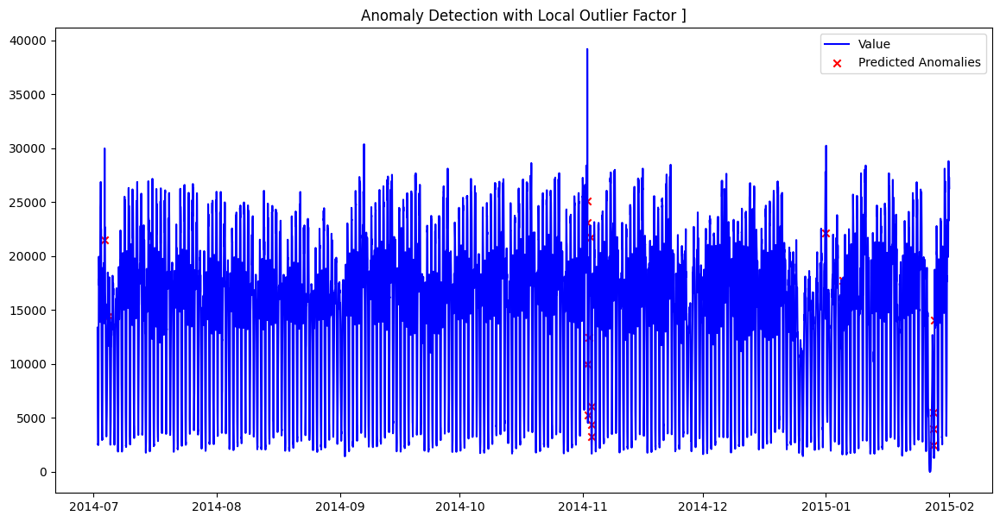

In [ ]:
from sklearn.neighbors import LocalOutlierFactor
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import f1_score, precision_score, recall_score
from sklearn.model_selection import ParameterGrid
import matplotlib.pyplot as plt
import pandas as pd


param_grid = {
   # 'n_neighbors': [5, 10, 20, 30, 40],
  #  'contamination': ['auto', 0.01, 0.02, 0.05, 0.1, 0.3, 0.5]
    'n_neighbors': [5],
    'contamination': ['auto']
}
grid = ParameterGrid(param_grid)


# Feature engineering (you'll need to implement this function)
data_features = feature_engineering_nab(data['realKnownCause']["nyc_taxi.csv"], "value", 48)

# Separate features and labels
X = data_features.drop(columns=['label'])  # Drop the label column
y = data_features['label']  # Ground truth labels

# Standardize features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Estimate contamination
#contamination = y.sum() / len(y)

# Hyperparameter tuning using grid search
best_f1 = -1
best_precision = -1
best_recall = -1
best_nab = float("-inf")
best_params = None
best_predictions = None

for params in grid:
    # Update contamination dynamically if it's 'auto'
    #if params['contamination'] == 'auto':
    #   params['contamination'] = contamination

    # Train Local Outlier Factor with current parameters
    lof = LocalOutlierFactor(
        n_neighbors=params['n_neighbors'],
        contamination=params['contamination'],
        novelty=True
    )
    lof.fit(X_scaled)
    predictions = lof.predict(X_scaled)

    # Map predictions to binary (1 = anomaly, 0 = normal)
    predictions = [1 if pred == -1 else 0 for pred in predictions]

    # Convert binary predictions to detection timestamps
    detections = [i for i, x in enumerate(predictions) if x == 1]

    # Compute the NAB score
    nab_score = compute_raw_score_debug(detections, anomaly_windows["nyc_taxi.csv"], A_tp = 1.0, A_fp = -0.11, A_fn = -1.0)

    # Calculate metrics
    f1 = f1_score(y, predictions)
    precision = precision_score(y, predictions)
    recall = recall_score(y, predictions)

    # Update best parameters if current F1 is better
    if nab_score > best_nab:
        best_f1 = f1
        best_precision = precision
        best_recall = recall
        best_params = params
        best_predictions = predictions
        best_nab = nab_score

# Output best parameters and metrics for current dataset
print(f"Best F1 Score ]: {best_f1:.4f}")
print(f"Best Precision: {best_precision:.4f}")
print(f"Best Recall: {best_recall:.4f}")
print(f"Best Parameters: {best_params}")
print(f"Best NAB Score: {best_nab:.4f}")

# Add predictions to the original DataFrame for inspection
data_features['predictions'] = best_predictions

# Visualize anomalies
plt.figure(figsize=(14, 7))
plt.plot(data_features.index, data_features[f"value"], label='Value', color='blue')
plt.scatter(data_features[data_features['predictions'] == 1].index,
            data_features[data_features['predictions'] == 1][f"value"],
            color='red', label='Predicted Anomalies', marker='x')
#plt.scatter(data_features[data_features['label'] == 1].index,
#            data_features[data_features['label'] == 1][f"value"],
#            color='green', label='True Anomalies', marker='o', facecolors = "none")

plt.title(f'Anomaly Detection with Local Outlier Factor ]')
plt.legend()
plt.show()



## no temp

Best F1 Score ]: 0.1745
Best Precision: 0.1062
Best Recall: 0.4879
Best Parameters: {'contamination': 0.5, 'n_neighbors': 40}
Best NAB Score: -4243.9572


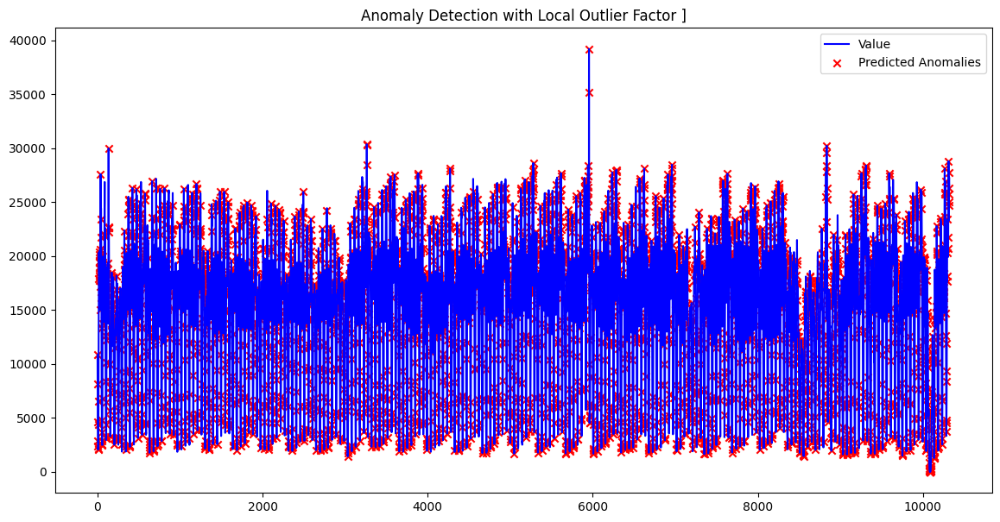

In [ ]:
from sklearn.neighbors import LocalOutlierFactor
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import f1_score, precision_score, recall_score
from sklearn.model_selection import ParameterGrid
import matplotlib.pyplot as plt
import pandas as pd


param_grid = {
    'n_neighbors': [5, 10, 20, 30, 40],
    'contamination': ['auto', 0.01, 0.02, 0.05, 0.1, 0.3, 0.5]
}
grid = ParameterGrid(param_grid)


# Feature engineering (you'll need to implement this function)
data_features = data['realKnownCause']["nyc_taxi.csv"]

# Separate features and labels
X = data_features.drop(columns=['timestamp','label'])  # Drop the label column
y = data_features['label']  # Ground truth labels

# Standardize features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Estimate contamination
#contamination = y.sum() / len(y)

# Hyperparameter tuning using grid search
best_f1 = -1
best_precision = -1
best_recall = -1
best_params = None
best_predictions = None
best_nab = float("-inf")

for params in grid:
    # Update contamination dynamically if it's 'auto'
   # if params['contamination'] == 'auto':
    #    params['contamination'] = contamination

    # Train Local Outlier Factor with current parameters
    lof = LocalOutlierFactor(
        n_neighbors=params['n_neighbors'],
        contamination=params['contamination'],
        novelty=True
    )
    lof.fit(X_scaled)
    predictions = lof.predict(X_scaled)

    # Map predictions to binary (1 = anomaly, 0 = normal)
    predictions = [1 if pred == -1 else 0 for pred in predictions]

    # Convert binary predictions to detection timestamps
    detections = [i for i, x in enumerate(predictions) if x == 1]

    # Compute the NAB score
    nab_score = compute_raw_score_debug(detections, anomaly_windows["nyc_taxi.csv"], A_tp = 1.0, A_fp = -0.11, A_fn = -1.0)

    # Calculate metrics
    f1 = f1_score(y, predictions)
    precision = precision_score(y, predictions)
    recall = recall_score(y, predictions)

    # Update best parameters if current F1 is better
    if f1 > best_f1:
        best_f1 = f1
        best_precision = precision
        best_recall = recall
        best_params = params
        best_predictions = predictions
        best_nab = nab_score

# Output best parameters and metrics for current dataset
print(f"Best F1 Score ]: {best_f1:.4f}")
print(f"Best Precision: {best_precision:.4f}")
print(f"Best Recall: {best_recall:.4f}")
print(f"Best Parameters: {best_params}")
print(f"Best NAB Score: {best_nab:.4f}")

# Add predictions to the original DataFrame for inspection
data_features['predictions'] = best_predictions

# Visualize anomalies
plt.figure(figsize=(14, 7))
plt.plot(data_features.index, data_features[f"value"], label='Value', color='blue')
plt.scatter(data_features[data_features['predictions'] == 1].index,
            data_features[data_features['predictions'] == 1][f"value"],
            color='red', label='Predicted Anomalies', marker='x')
#plt.scatter(data_features[data_features['label'] == 1].index,
#            data_features[data_features['label'] == 1][f"value"],
#            color='green', label='True Anomalies', marker='o')

plt.title(f'Anomaly Detection with Local Outlier Factor ]')
plt.legend()
plt.show()




## art with anomaly

In [ ]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import StandardScaler

# Perform feature engineering
def feature_engineering_nab(df, value_col, window_size):
    df = df.copy()

    if not isinstance(df.index, pd.DatetimeIndex):
      df['timestamp'] = pd.to_datetime(df['timestamp'])  # Assuming 'timestamp' is the datetime column
      df.set_index('timestamp', inplace=True)

    # Rolling statistics
    df[f'rolling_mean_{window_size}'] = df[value_col].rolling(window=window_size).mean()
    df[f'rolling_std_{window_size}'] = df[value_col].rolling(window=window_size).std()
    df[f'rolling_min_{window_size}'] = df[value_col].rolling(window=window_size).min()
    df[f'rolling_max_{window_size}'] = df[value_col].rolling(window=window_size).max()

    # Time-based features
    df['hour'] = df.index.hour
    df['day_of_week'] = df.index.weekday
    df['day_of_month'] = df.index.day
    df['Lag'] = df[value_col].shift(288)
    df["lag_1"] = df[value_col].shift(1)
    df["lag_2"] = df[value_col].shift(2)

    # Sinusoidal encoding for capturing daily seasonality
    df['sin_day'] = np.sin(2 * np.pi * df.index.hour / 288)
    df['cos_day'] = np.cos(2 * np.pi * df.index.hour / 288)
    # Drop rows with NaN due to rolling statistics
    df.dropna(inplace=True)
    return df

Processing file: art_daily_flatmiddle.csv...
Best F1 Score ]: 0.1947
Best Precision: 0.1318
Best Recall: 0.3722
Best Parameters: {'contamination': 0.5, 'n_neighbors': 5}
Best NAB Score: -1142.9993


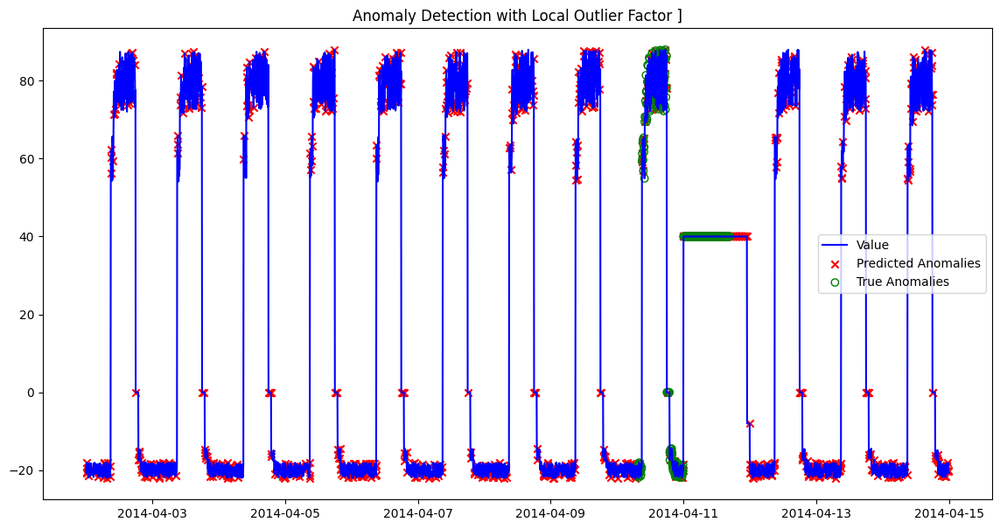

Processing file: art_daily_nojump.csv...
Best F1 Score ]: 0.2217
Best Precision: 0.1373
Best Recall: 0.5757
Best Parameters: {'contamination': 0.5, 'n_neighbors': 20}
Best NAB Score: -1694.9990


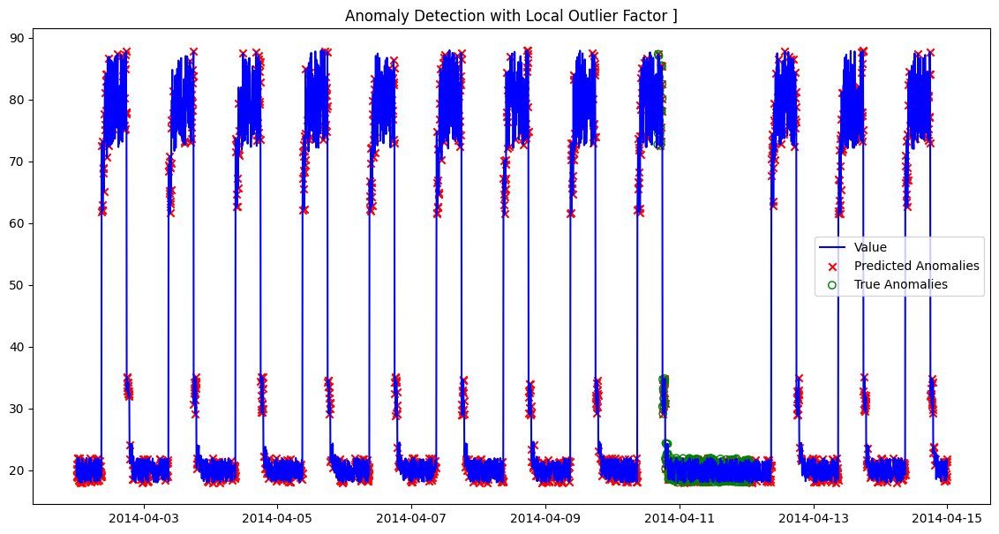

Processing file: art_load_balancer_spikes.csv...
Best F1 Score ]: 0.1965
Best Precision: 0.1198
Best Recall: 0.5459
Best Parameters: {'contamination': 0.5, 'n_neighbors': 40}
Best NAB Score: -1840.9989


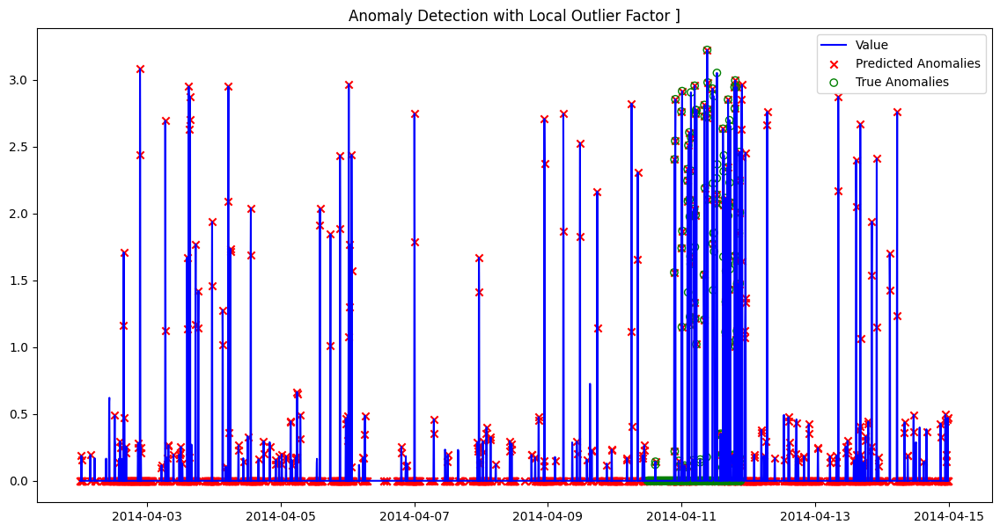

Processing file: art_daily_jumpsup.csv...
Best F1 Score ]: 0.2679
Best Precision: 0.1842
Best Recall: 0.4913
Best Parameters: {'contamination': 0.3, 'n_neighbors': 40}
Best NAB Score: -1079.9993


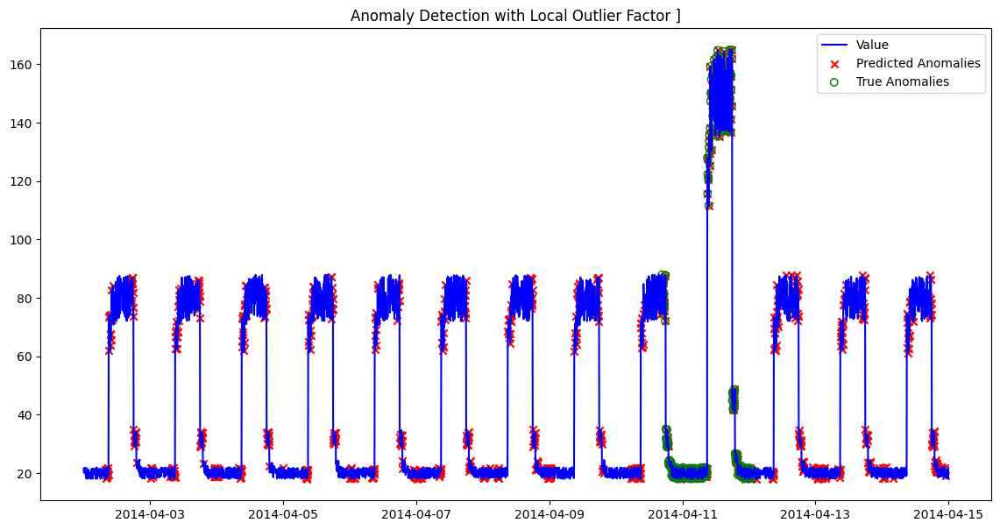

Processing file: art_daily_jumpsdown.csv...
Best F1 Score ]: 0.1934
Best Precision: 0.1206
Best Recall: 0.4888
Best Parameters: {'contamination': 0.5, 'n_neighbors': 20}
Best NAB Score: -1638.9990


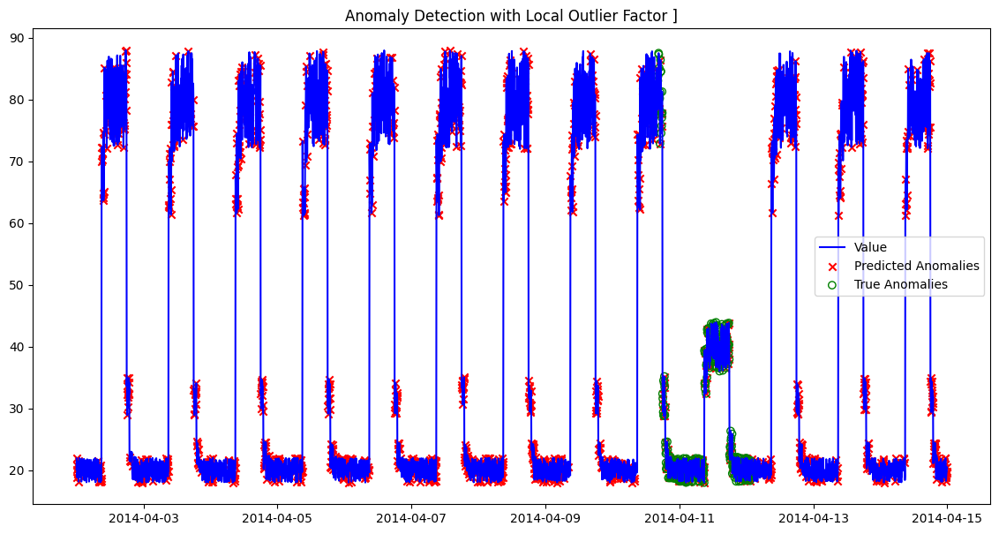

Processing file: art_increase_spike_density.csv...
Best F1 Score ]: 0.2886
Best Precision: 0.1989
Best Recall: 0.5261
Best Parameters: {'contamination': 0.3, 'n_neighbors': 40}
Best NAB Score: -1070.9993


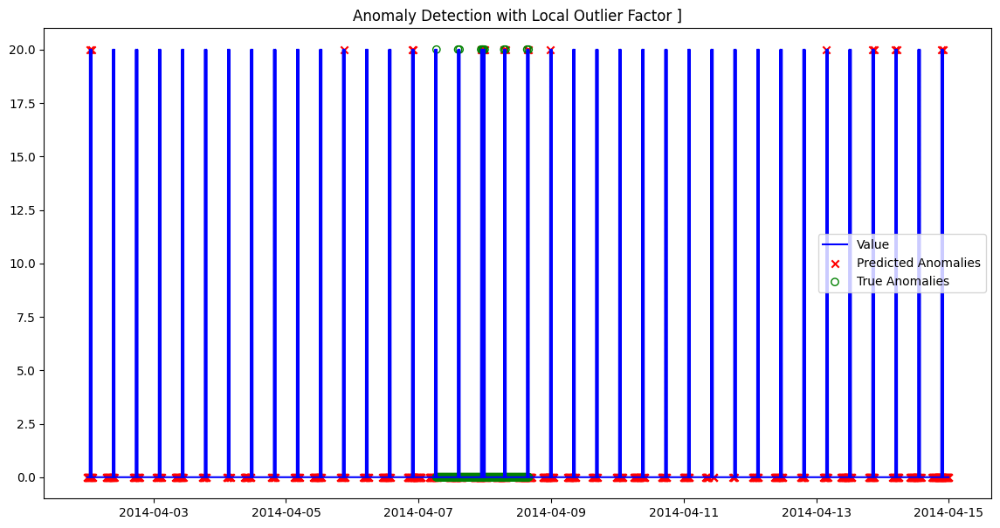

Average F1 Score across all datasets: 0.2271
Average Precision across all datasets: 0.1488
Average Recall across all datasets: 0.5000


In [ ]:
from sklearn.neighbors import LocalOutlierFactor
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import f1_score, precision_score, recall_score
from sklearn.model_selection import ParameterGrid
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns

# Define A1A and ParameterGrid for hyperparameter tuning
A1D = [28,43,46,55,56,65]
param_grid = {
    'n_neighbors': [5, 10, 20, 30, 40],
    'contamination': ['auto', 0.01, 0.02, 0.05, 0.1, 0.3, 0.5]
}
grid = ParameterGrid(param_grid)

# To calculate the average F1 score, precision, and recall
f1_scores = []
precision_scores = []
recall_scores = []
nab_scores = []

# Iterate through each CSV file in data['realKnownCause']
for file_name in data['artificialWithAnomaly']:
    print(f"Processing file: {file_name}...")

    # Load and perform feature engineering
    data_features = feature_engineering_nab(data['artificialWithAnomaly'][file_name], "value", 288)

    # Separate features and labels
    X = data_features.drop(["label"], axis=1)
    y = data_features['label']

    # Standardize features
    scaler = StandardScaler()
    X_scaled = scaler.fit_transform(X)

    # Estimate contamination
    #contamination = y.sum() / len(y)

    # Hyperparameter tuning using grid search
    best_f1 = -1
    best_precision = -1
    best_recall = -1
    best_params = None
    best_predictions = None
    best_nab = -1

    for params in grid:
        # Update contamination dynamically if it's 'auto'
       # if params['contamination'] == 'auto':
        #    params['contamination'] = contamination

        # Train Local Outlier Factor with current parameters
        lof = LocalOutlierFactor(
            n_neighbors=params['n_neighbors'],
            contamination=params['contamination'],
            novelty=True
        )
        lof.fit(X_scaled)
        predictions = lof.predict(X_scaled)

        # Map predictions to binary (1 = anomaly, 0 = normal)
        predictions = [1 if pred == -1 else 0 for pred in predictions]

        # Convert binary predictions to detection timestamps
        detections = [i for i, x in enumerate(predictions) if x == 1]

        # Compute the NAB score
        nab_score = compute_raw_score_debug(detections, anomaly_windows["nyc_taxi.csv"], A_tp = 1.0, A_fp = -0.11, A_fn = -1.0)

        # Calculate metrics
        f1 = f1_score(y, predictions)
        precision = precision_score(y, predictions)
        recall = recall_score(y, predictions)

        # Update best parameters if current F1 is better
        if f1 > best_f1:
            best_f1 = f1
            best_precision = precision
            best_recall = recall
            best_params = params
            best_predictions = predictions
            best_nab = nab_score

    # Append best metrics for the dataset
    f1_scores.append(best_f1)
    precision_scores.append(best_precision)
    recall_scores.append(best_recall)
    nab_scores.append(best_nab)

    # Output best parameters and metrics for current dataset
    print(f"Best F1 Score ]: {best_f1:.4f}")
    print(f"Best Precision: {best_precision:.4f}")
    print(f"Best Recall: {best_recall:.4f}")
    print(f"Best Parameters: {best_params}")
    print(f"Best NAB Score: {best_nab:.4f}")

    # Add predictions to the original DataFrame for inspection
    data_features['predictions'] = best_predictions

    # Visualize anomalies
    plt.figure(figsize=(14, 7))
    plt.plot(data_features.index, data_features[f"value"], label='Value', color='blue')
    plt.scatter(data_features[data_features['predictions'] == 1].index,
                data_features[data_features['predictions'] == 1][f"value"],
                color='red', label='Predicted Anomalies', marker='x')
    plt.scatter(data_features[data_features['label'] == 1].index,
                data_features[data_features['label'] == 1][f"value"],
                color='green', label='True Anomalies', marker='o', facecolors = "none")

    plt.title(f'Anomaly Detection with Local Outlier Factor ]')
    plt.legend()
    plt.show()

# Calculate and output the average metrics
avg_f1_score = sum(f1_scores) / len(f1_scores)
avg_precision = sum(precision_scores) / len(precision_scores)
avg_recall = sum(recall_scores) / len(recall_scores)
print(f"Average F1 Score across all datasets: {avg_f1_score:.4f}")
print(f"Average Precision across all datasets: {avg_precision:.4f}")
print(f"Average Recall across all datasets: {avg_recall:.4f}")


## no temp

Processing file: art_daily_flatmiddle.csv...
Best F1 Score ]: 0.0934
Best Precision: 0.0566
Best Recall: 0.2680
Best Parameters: {'contamination': 0.5, 'n_neighbors': 40}
Best NAB score:  -1913.998832065376


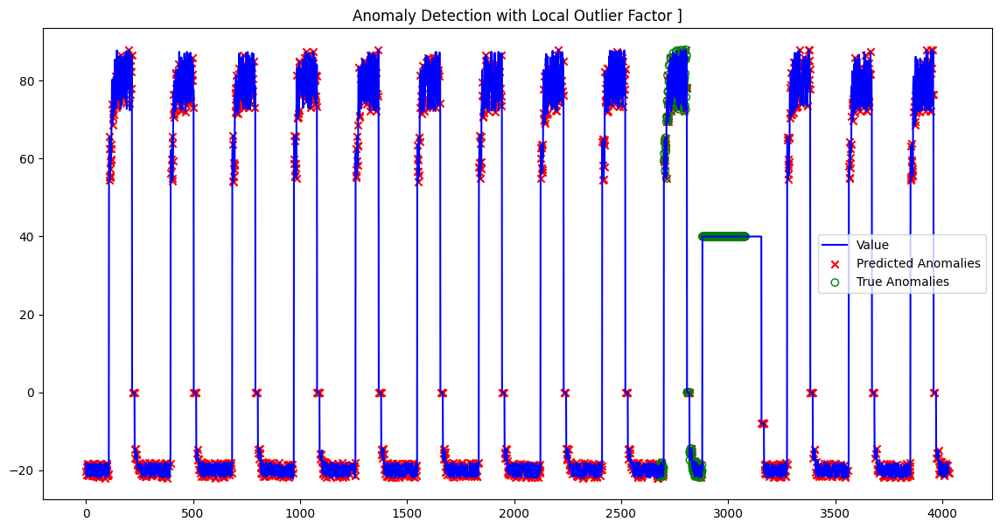

Processing file: art_daily_nojump.csv...
Best F1 Score ]: 0.1766
Best Precision: 0.1068
Best Recall: 0.5087
Best Parameters: {'contamination': 0.5, 'n_neighbors': 30}
Best NAB score:  -1923.9988259473325


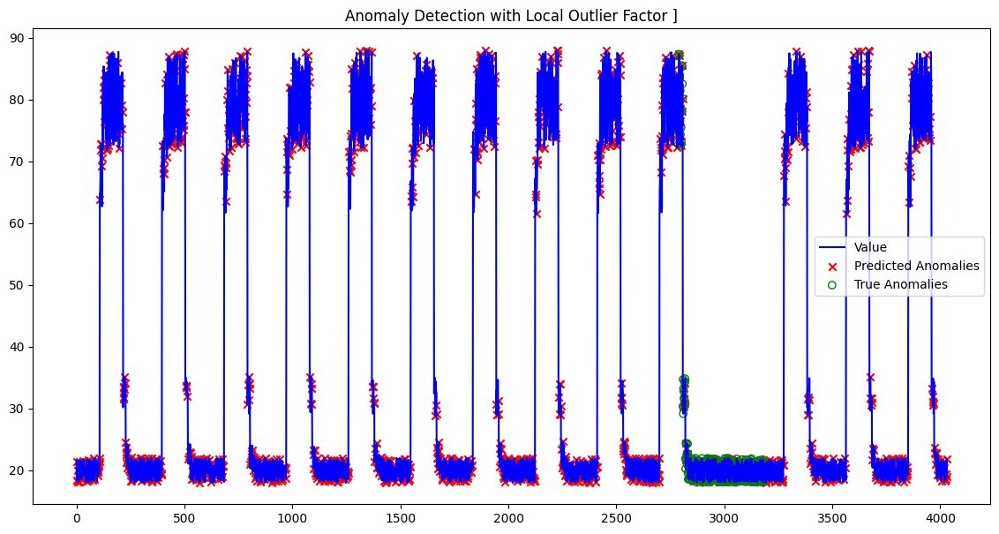

Processing file: art_load_balancer_spikes.csv...
Best F1 Score ]: 0.1962
Best Precision: 0.2707
Best Recall: 0.1538
Best Parameters: {'contamination': 0.1, 'n_neighbors': 20}
Best NAB score:  -233.99985989677887


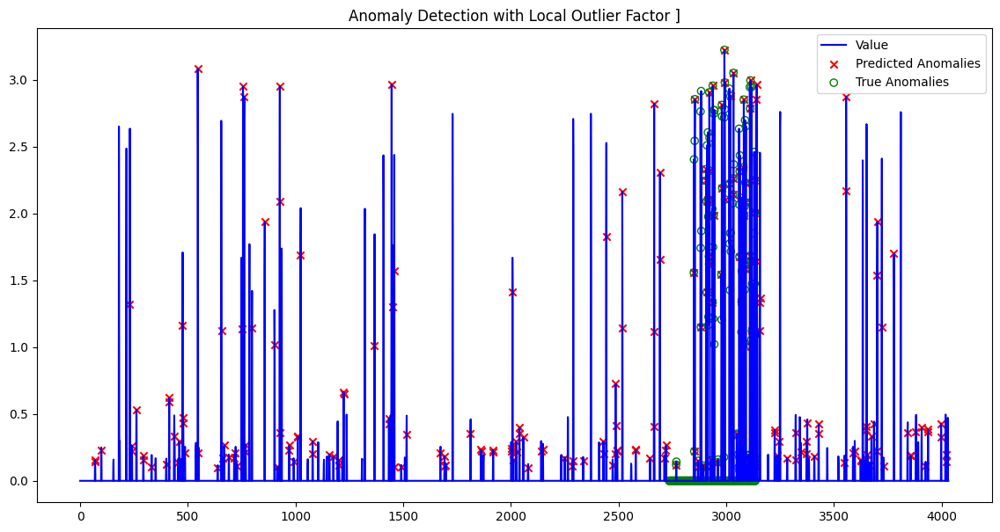

Processing file: art_daily_jumpsup.csv...
Best F1 Score ]: 0.2769
Best Precision: 0.2865
Best Recall: 0.2680
Best Parameters: {'contamination': 0.1, 'n_neighbors': 40}
Best NAB score:  -381.99976934971784


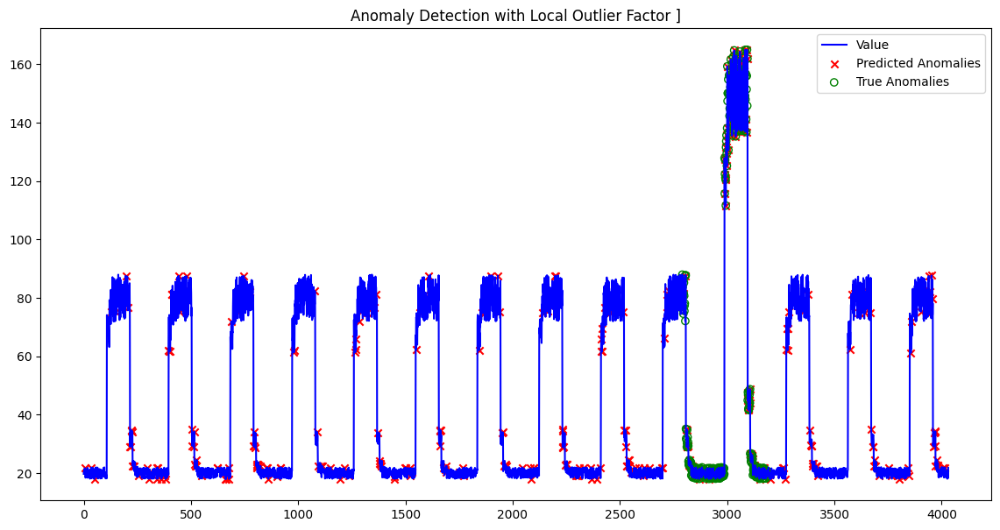

Processing file: art_daily_jumpsdown.csv...
Best F1 Score ]: 0.1615
Best Precision: 0.1138
Best Recall: 0.2779
Best Parameters: {'contamination': 0.3, 'n_neighbors': 10}
Best NAB score:  -988.9993979844066


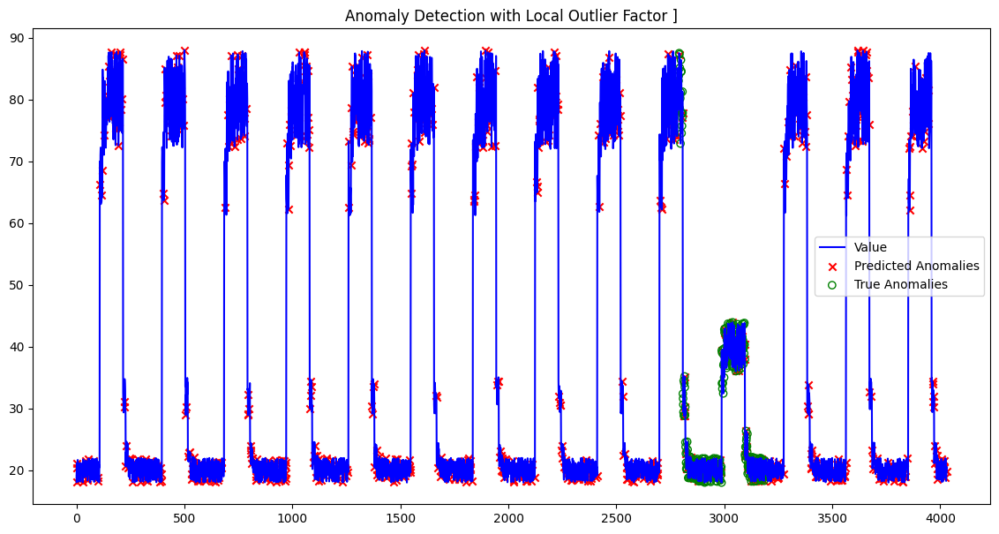

Processing file: art_increase_spike_density.csv...


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.p

Best F1 Score ]: 0.0000
Best Precision: 0.0000
Best Recall: 0.0000
Best Parameters: {'contamination': 'auto', 'n_neighbors': 5}
Best NAB score:  -5.0


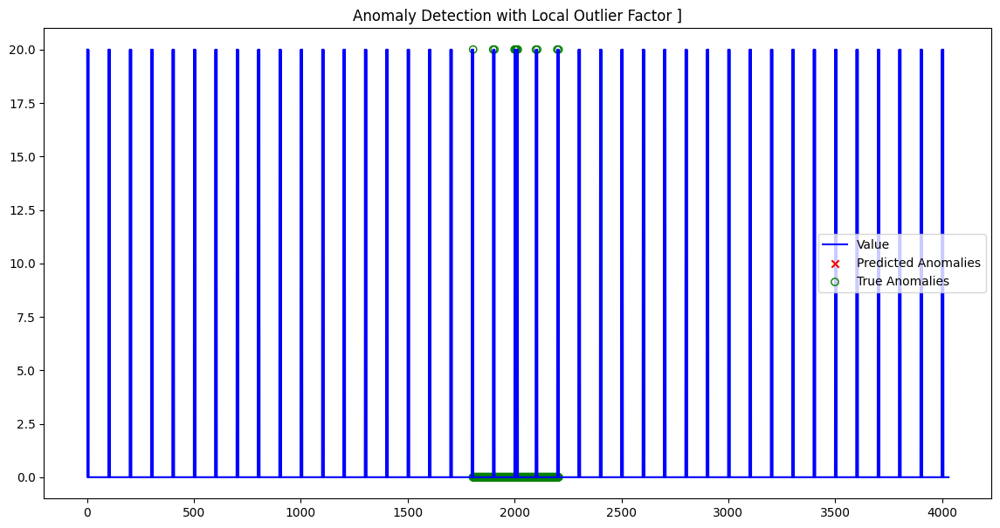

Average F1 Score across all datasets: 0.1508
Average Precision across all datasets: 0.1391
Average Recall across all datasets: 0.2461


In [ ]:
from sklearn.neighbors import LocalOutlierFactor
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import f1_score, precision_score, recall_score
from sklearn.model_selection import ParameterGrid
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns

# Define A1A and ParameterGrid for hyperparameter tuning
A1D = [28,43,46,55,56,65]
param_grid = {
    'n_neighbors': [5, 10, 20, 30, 40],
    'contamination': ['auto', 0.01, 0.02, 0.05, 0.1, 0.3, 0.5]
}
grid = ParameterGrid(param_grid)

# To calculate the average F1 score, precision, and recall
f1_scores = []
precision_scores = []
recall_scores = []


# Iterate through each CSV file in data['realKnownCause']
for file_name in data['artificialWithAnomaly']:
    print(f"Processing file: {file_name}...")

    # Load and perform feature engineering
    data_features = data['artificialWithAnomaly'][file_name]

    # Separate features and labels
    X = data_features.drop(["timestamp","label"], axis=1)
    y = data_features['label']

    # Standardize features
    scaler = StandardScaler()
    X_scaled = scaler.fit_transform(X)

    # Estimate contamination
    #contamination = y.sum() / len(y)

    # Hyperparameter tuning using grid search
    best_f1 = -1
    best_precision = -1
    best_recall = -1
    best_nab = -1
    best_params = None
    best_predictions = None

    for params in grid:
        # Update contamination dynamically if it's 'auto'
      #  if params['contamination'] == 'auto':
       #     params['contamination'] = contamination

        # Train Local Outlier Factor with current parameters
        lof = LocalOutlierFactor(
            n_neighbors=params['n_neighbors'],
            contamination=params['contamination'],
            novelty=True
        )
        lof.fit(X_scaled)
        predictions = lof.predict(X_scaled)

        # Map predictions to binary (1 = anomaly, 0 = normal)
        predictions = [1 if pred == -1 else 0 for pred in predictions]

        # Convert binary predictions to detection timestamps
        detections = [i for i, x in enumerate(predictions) if x == 1]

        # Compute the NAB score
        nab_score = compute_raw_score_debug(detections, anomaly_windows["nyc_taxi.csv"], A_tp = 1.0, A_fp = -0.11, A_fn = -1.0)

        # Calculate metrics
        f1 = f1_score(y, predictions)
        precision = precision_score(y, predictions)
        recall = recall_score(y, predictions)

        # Update best parameters if current F1 is better
        if f1 > best_f1:
            best_f1 = f1
            best_precision = precision
            best_recall = recall
            best_params = params
            best_predictions = predictions
            best_nab = nab_score

    # Append best metrics for the dataset
    f1_scores.append(best_f1)
    precision_scores.append(best_precision)
    recall_scores.append(best_recall)

    # Output best parameters and metrics for current dataset
    print(f"Best F1 Score ]: {best_f1:.4f}")
    print(f"Best Precision: {best_precision:.4f}")
    print(f"Best Recall: {best_recall:.4f}")
    print(f"Best Parameters: {best_params}")
    print(f"Best NAB score:  {best_nab}")

    # Add predictions to the original DataFrame for inspection
    data_features['predictions'] = best_predictions

    # Visualize anomalies
    plt.figure(figsize=(14, 7))
    plt.plot(data_features.index, data_features[f"value"], label='Value', color='blue')
    plt.scatter(data_features[data_features['predictions'] == 1].index,
                data_features[data_features['predictions'] == 1][f"value"],
                color='red', label='Predicted Anomalies', marker='x')
    plt.scatter(data_features[data_features['label'] == 1].index,
                data_features[data_features['label'] == 1][f"value"],
                color='green', label='True Anomalies', marker='o', facecolors="none")

    plt.title(f'Anomaly Detection with Local Outlier Factor ]')
    plt.legend()
    plt.show()

# Calculate and output the average metrics
avg_f1_score = sum(f1_scores) / len(f1_scores)
avg_precision = sum(precision_scores) / len(precision_scores)
avg_recall = sum(recall_scores) / len(recall_scores)
print(f"Average F1 Score across all datasets: {avg_f1_score:.4f}")
print(f"Average Precision across all datasets: {avg_precision:.4f}")
print(f"Average Recall across all datasets: {avg_recall:.4f}")


## small test with dbscan




## ALL YAHOO DATASETS

## temp

Processing dataset dfsA1[1]...
Best F1 Score for dfsA1[1]: 0.1143
Best Precision: 0.0606
Best Recall: 1.0000
Best Parameters: {'eps': 2.0, 'min_samples': 5}


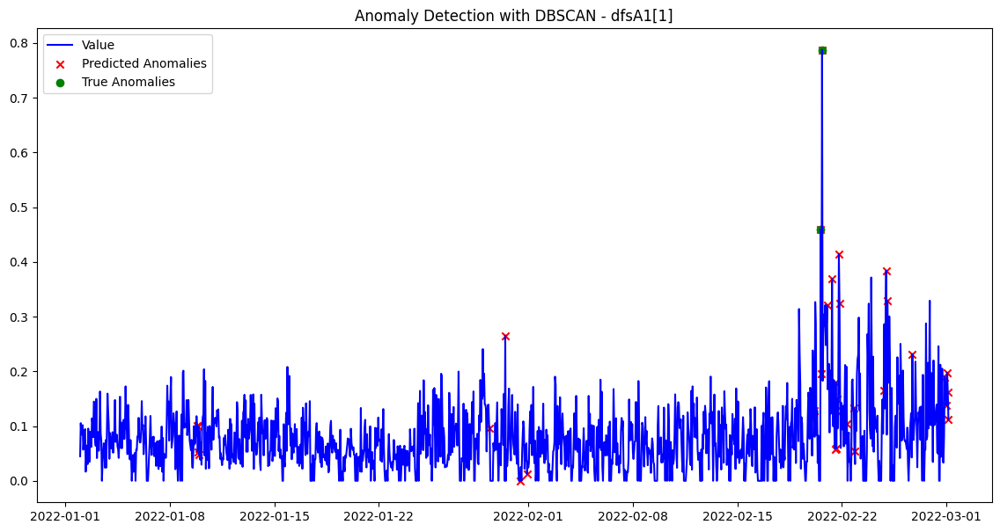

Processing dataset dfsA1[2]...
Best F1 Score for dfsA1[2]: 0.9412
Best Precision: 0.8889
Best Recall: 1.0000
Best Parameters: {'eps': 1.5, 'min_samples': 5}


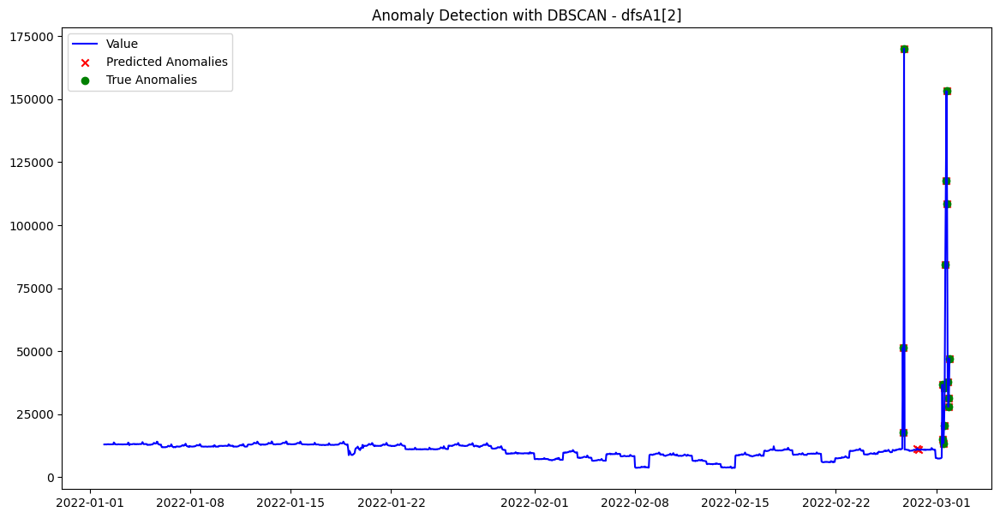

Processing dataset dfsA1[3]...
Best F1 Score for dfsA1[3]: 0.9677
Best Precision: 0.9375
Best Recall: 1.0000
Best Parameters: {'eps': 1.5, 'min_samples': 5}


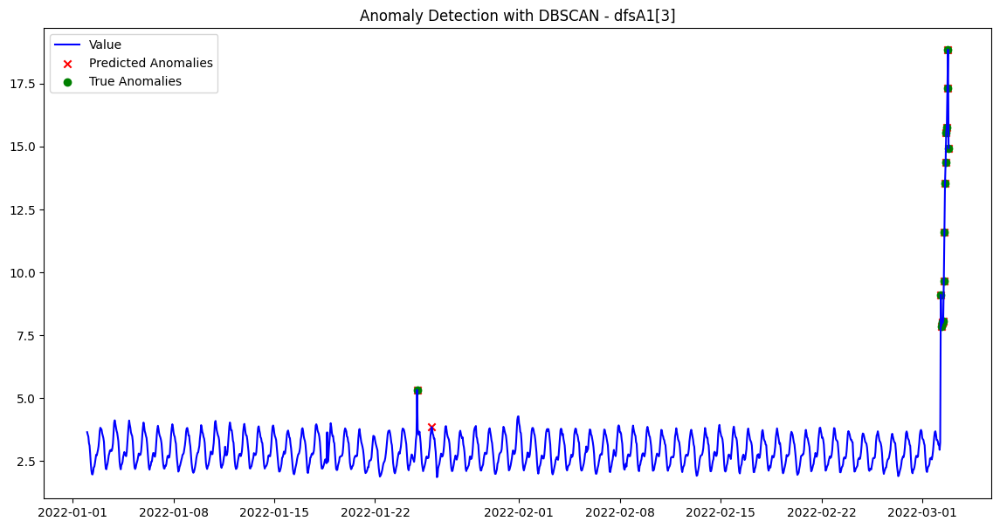

Processing dataset dfsA1[8]...
Best F1 Score for dfsA1[8]: 0.3922
Best Precision: 0.2439
Best Recall: 1.0000
Best Parameters: {'eps': 2.0, 'min_samples': 5}


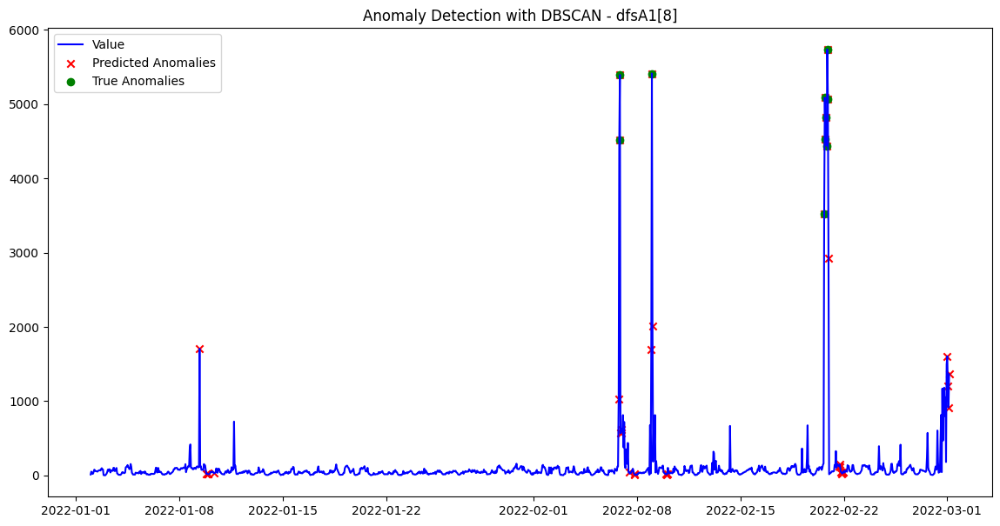

Processing dataset dfsA1[9]...
Best F1 Score for dfsA1[9]: 0.4444
Best Precision: 0.4000
Best Recall: 0.5000
Best Parameters: {'eps': 2.0, 'min_samples': 5}


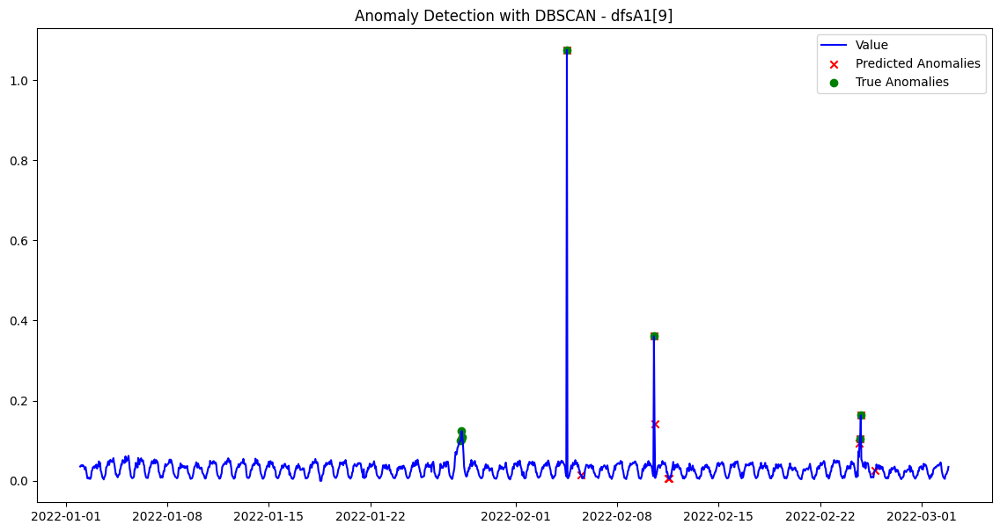

Processing dataset dfsA1[10]...
Best F1 Score for dfsA1[10]: 0.4516
Best Precision: 0.3889
Best Recall: 0.5385
Best Parameters: {'eps': 2.0, 'min_samples': 5}


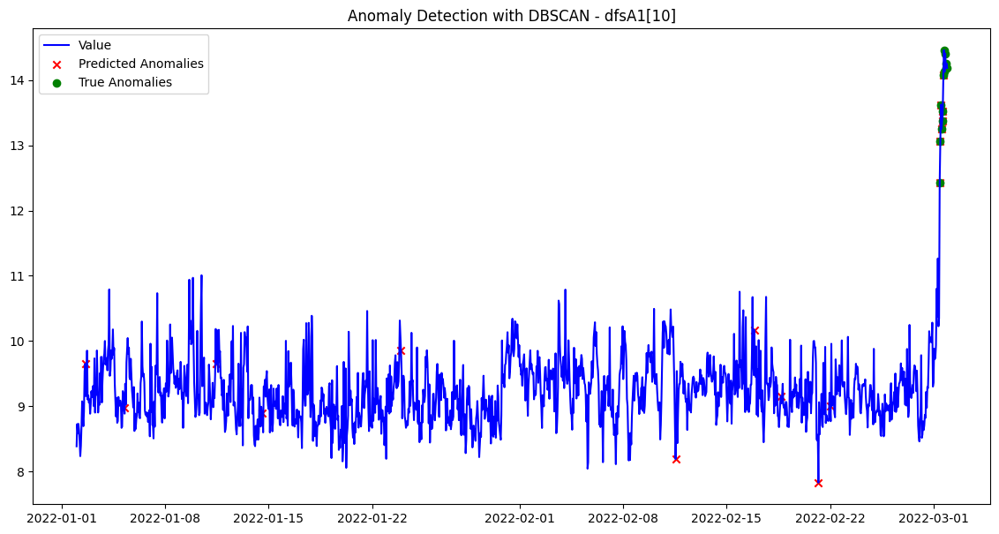

Processing dataset dfsA1[13]...
Best F1 Score for dfsA1[13]: 0.7500
Best Precision: 0.6000
Best Recall: 1.0000
Best Parameters: {'eps': 2.0, 'min_samples': 5}


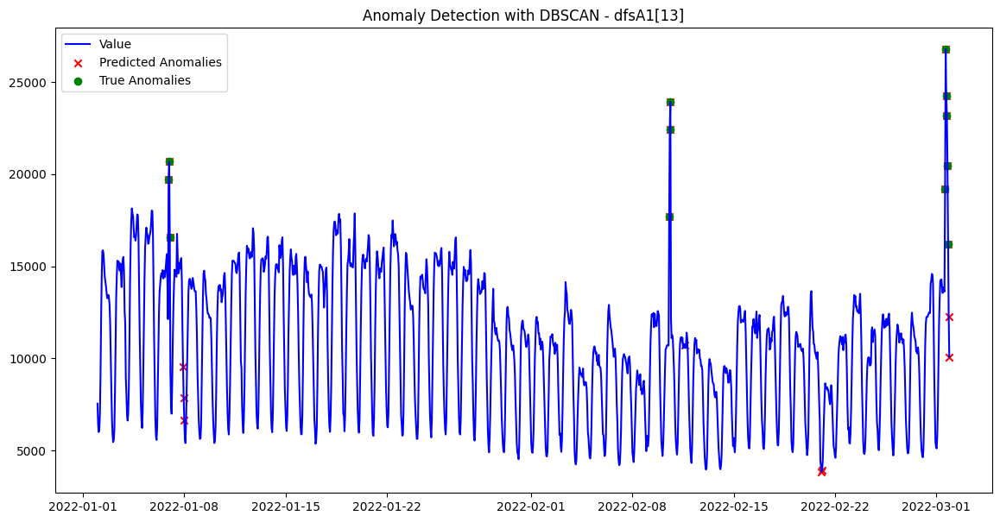

Processing dataset dfsA1[23]...
Best F1 Score for dfsA1[23]: 0.4318
Best Precision: 0.2754
Best Recall: 1.0000
Best Parameters: {'eps': 2.0, 'min_samples': 5}


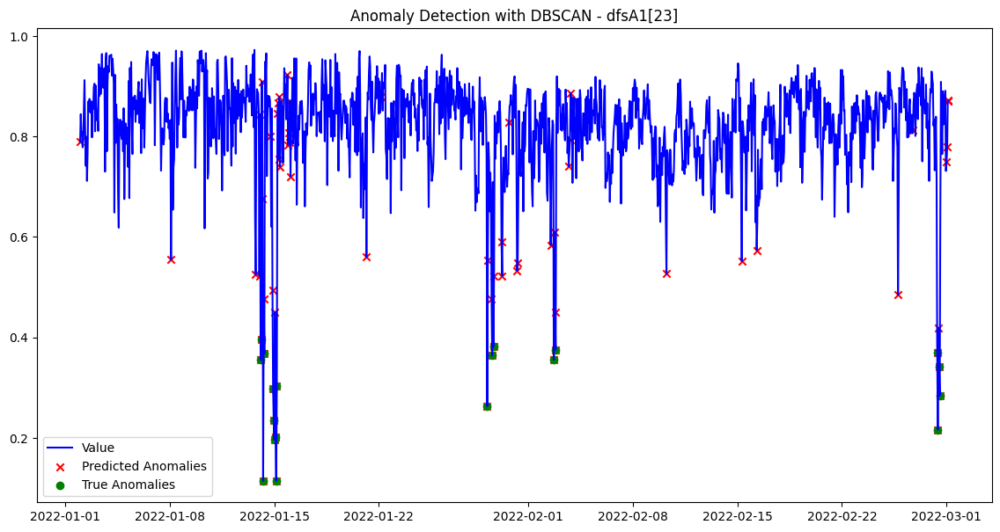

Processing dataset dfsA1[24]...
Best F1 Score for dfsA1[24]: 0.8205
Best Precision: 0.6957
Best Recall: 1.0000
Best Parameters: {'eps': 2.0, 'min_samples': 5}


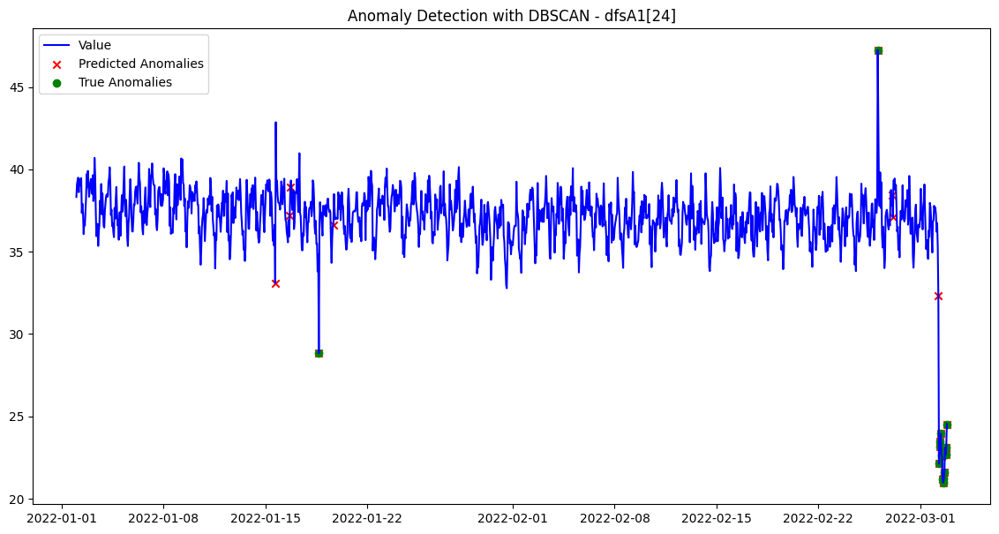

Processing dataset dfsA1[27]...
Best F1 Score for dfsA1[27]: 0.1739
Best Precision: 0.0952
Best Recall: 1.0000
Best Parameters: {'eps': 2.0, 'min_samples': 5}


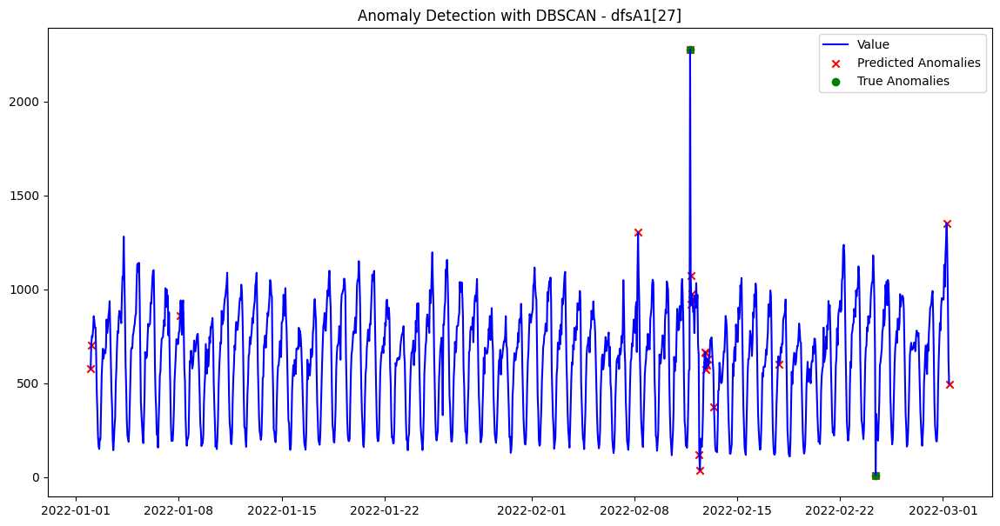

Processing dataset dfsA1[34]...
Best F1 Score for dfsA1[34]: 0.5000
Best Precision: 0.3333
Best Recall: 1.0000
Best Parameters: {'eps': 2.0, 'min_samples': 5}


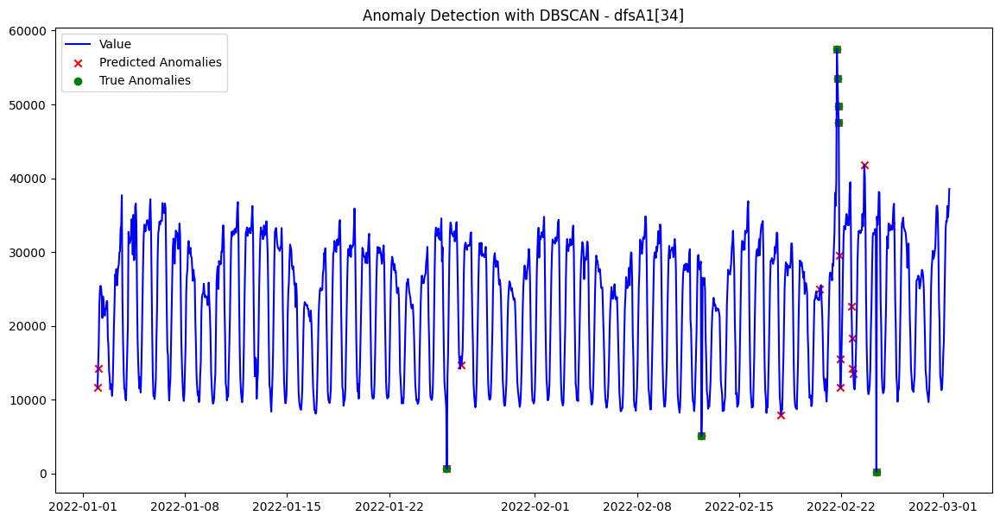

Processing dataset dfsA1[41]...
Best F1 Score for dfsA1[41]: 0.1500
Best Precision: 0.0811
Best Recall: 1.0000
Best Parameters: {'eps': 2.0, 'min_samples': 5}


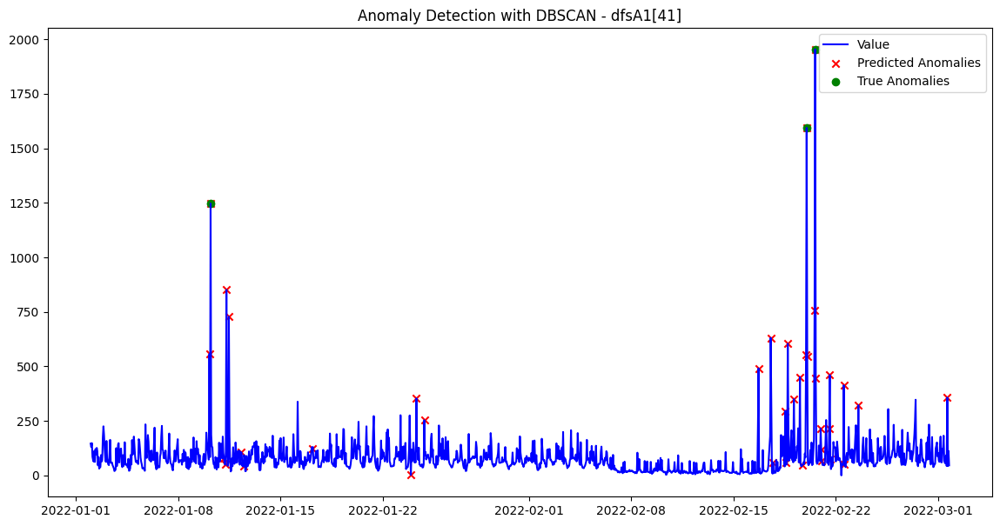

Processing dataset dfsA1[66]...
Best F1 Score for dfsA1[66]: 0.4286
Best Precision: 0.2727
Best Recall: 1.0000
Best Parameters: {'eps': 2.0, 'min_samples': 5}


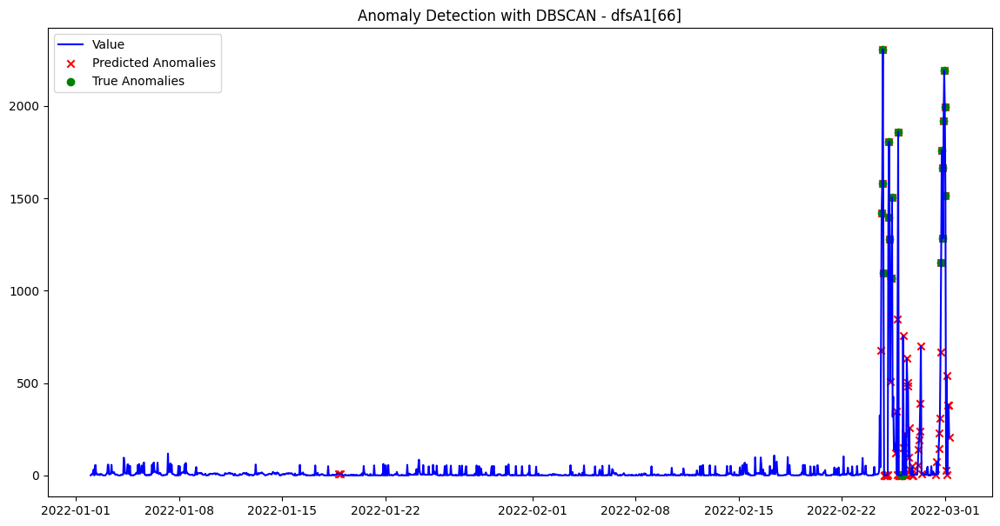

Average F1 Score across all datasets: 0.5051
Average Precision across all datasets: 0.4056
Average Recall across all datasets: 0.9260
All F1 Scores for each dataset: 0.1143, 0.9412, 0.9677, 0.3922, 0.4444, 0.4516, 0.7500, 0.4318, 0.8205, 0.1739, 0.5000, 0.1500, 0.4286


In [ ]:
from sklearn.cluster import DBSCAN
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import f1_score, precision_score, recall_score
from sklearn.model_selection import ParameterGrid
import matplotlib.pyplot as plt
import pandas as pd

# Define A1A and ParameterGrid for hyperparameter tuning
A1A = [1,2,3,8,9,10,13,23,24,27,34,41,66]

param_grid = {
    'eps': [0.5, 1.0, 1.5, 2.0],
    'min_samples': [5, 10, 20]
}
grid = ParameterGrid(param_grid)

# To calculate the average F1 score, precision, and recall
f1_scores = []
precision_scores = []
recall_scores = []

# Iterate through datasets
for i in A1A:
    print(f"Processing dataset dfsA1[{i}]...")

    # Feature engineering (you'll need to implement this function)
    data_features = feature_engineering(dfsA1[i], value_col=f"value_{i}", window_size=24)

    # Separate features and labels
    X = data_features.drop(columns=['label'])  # Drop the label column
    y = data_features['label']  # Ground truth labels

    # Standardize features
    scaler = StandardScaler()
    X_scaled = scaler.fit_transform(X)

    # Hyperparameter tuning using grid search
    best_f1 = -1
    best_precision = -1
    best_recall = -1
    best_params = None
    best_predictions = None

    for params in grid:
        # Train DBSCAN with current parameters
        dbscan = DBSCAN(eps=params['eps'], min_samples=params['min_samples'])
        predictions = dbscan.fit_predict(X_scaled)

        # Map predictions to binary (1 = anomaly, 0 = normal)
        predictions = [1 if pred == -1 else 0 for pred in predictions]

        # Calculate metrics
        f1 = f1_score(y, predictions)
        precision = precision_score(y, predictions)
        recall = recall_score(y, predictions)

        # Update best parameters if current F1 is better
        if f1 > best_f1:
            best_f1 = f1
            best_precision = precision
            best_recall = recall
            best_params = params
            best_predictions = predictions

    # Append best metrics for the dataset
    f1_scores.append(best_f1)
    precision_scores.append(best_precision)
    recall_scores.append(best_recall)

    # Output best parameters and metrics for current dataset
    print(f"Best F1 Score for dfsA1[{i}]: {best_f1:.4f}")
    print(f"Best Precision: {best_precision:.4f}")
    print(f"Best Recall: {best_recall:.4f}")
    print(f"Best Parameters: {best_params}")

    # Add predictions to the original DataFrame for inspection
    data_features['predictions'] = best_predictions

    # Visualize anomalies
    plt.figure(figsize=(14, 7))
    plt.plot(data_features.index, data_features[f"value_{i}"], label='Value', color='blue')
    plt.scatter(data_features[data_features['predictions'] == 1].index,
                data_features[data_features['predictions'] == 1][f"value_{i}"],
                color='red', label='Predicted Anomalies', marker='x')
    plt.scatter(data_features[data_features['label'] == 1].index,
                data_features[data_features['label'] == 1][f"value_{i}"],
                color='green', label='True Anomalies', marker='o')

    plt.title(f'Anomaly Detection with DBSCAN - dfsA1[{i}]')
    plt.legend()
    plt.show()

# Calculate and output the average metrics
avg_f1_score = sum(f1_scores) / len(f1_scores)
avg_precision = sum(precision_scores) / len(precision_scores)
avg_recall = sum(recall_scores) / len(recall_scores)
print(f"Average F1 Score across all datasets: {avg_f1_score:.4f}")
print(f"Average Precision across all datasets: {avg_precision:.4f}")
print(f"Average Recall across all datasets: {avg_recall:.4f}")
# Print each F1 score formatted individually
formatted_f1_scores = [f"{score:.4f}" for score in f1_scores]
print(f"All F1 Scores for each dataset: {', '.join(formatted_f1_scores)}")


## no temp

Processing dataset dfsA1[1]...
Best F1 Score for dfsA1[1]: 0.5714
Best Precision: 0.4000
Best Recall: 1.0000
Best Parameters: {'eps': 1.0, 'min_samples': 5}


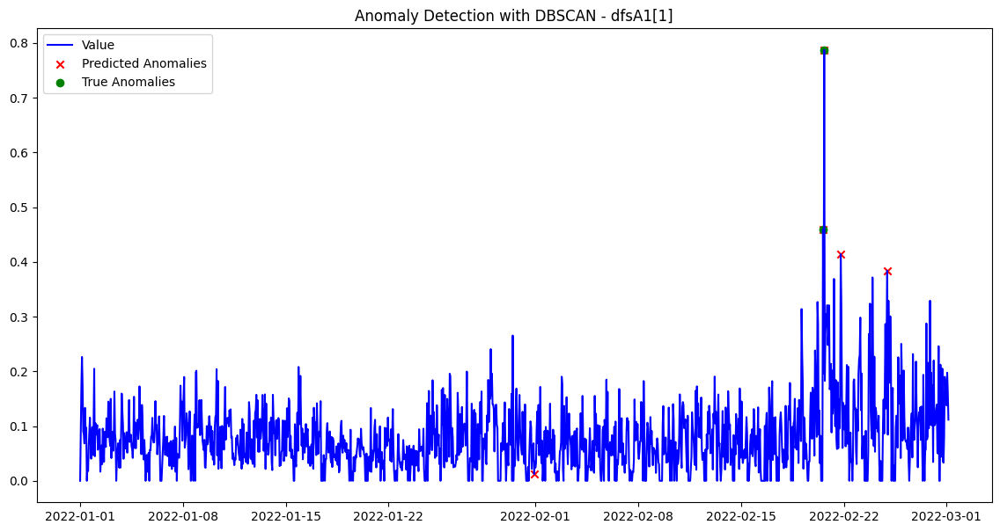

Processing dataset dfsA1[2]...
Best F1 Score for dfsA1[2]: 0.9677
Best Precision: 1.0000
Best Recall: 0.9375
Best Parameters: {'eps': 0.5, 'min_samples': 5}


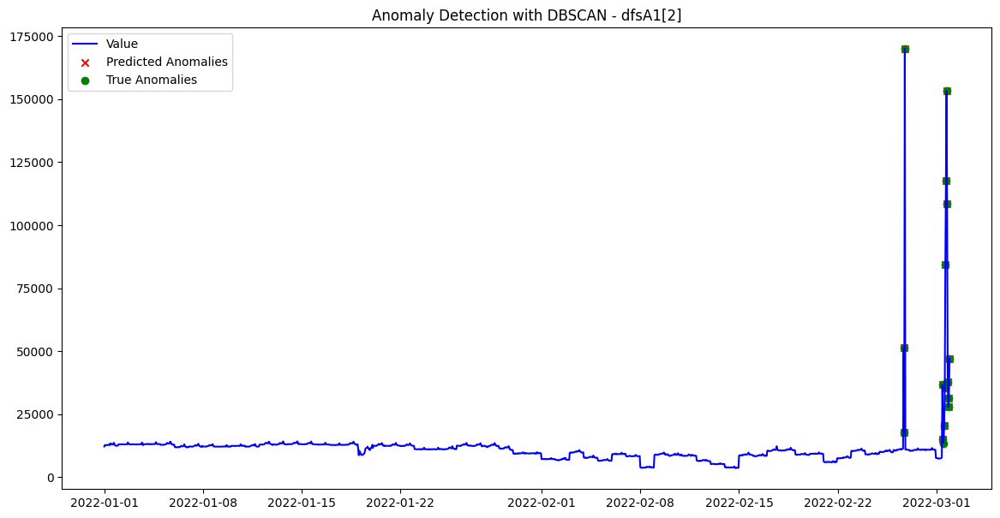

Processing dataset dfsA1[3]...
Best F1 Score for dfsA1[3]: 1.0000
Best Precision: 1.0000
Best Recall: 1.0000
Best Parameters: {'eps': 0.5, 'min_samples': 5}


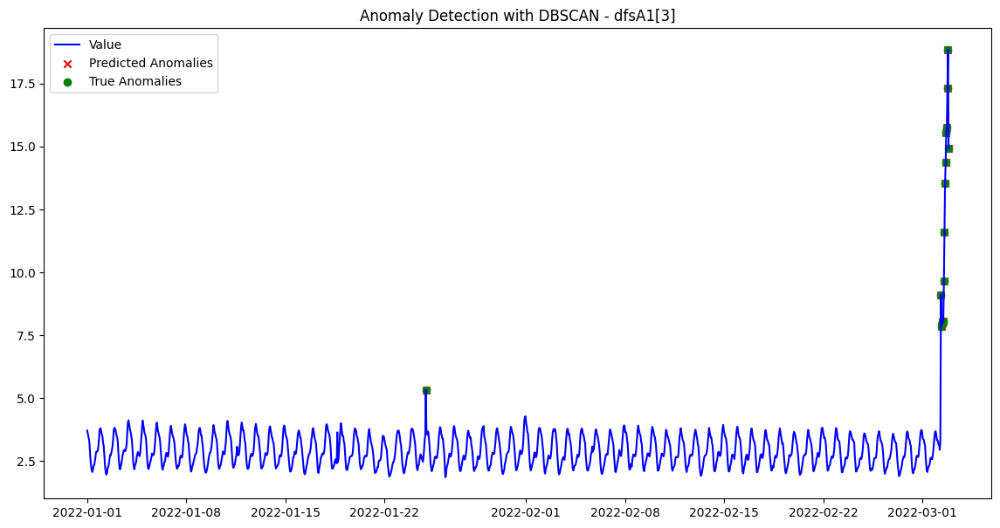

Processing dataset dfsA1[8]...
Best F1 Score for dfsA1[8]: 0.9524
Best Precision: 0.9091
Best Recall: 1.0000
Best Parameters: {'eps': 1.5, 'min_samples': 10}


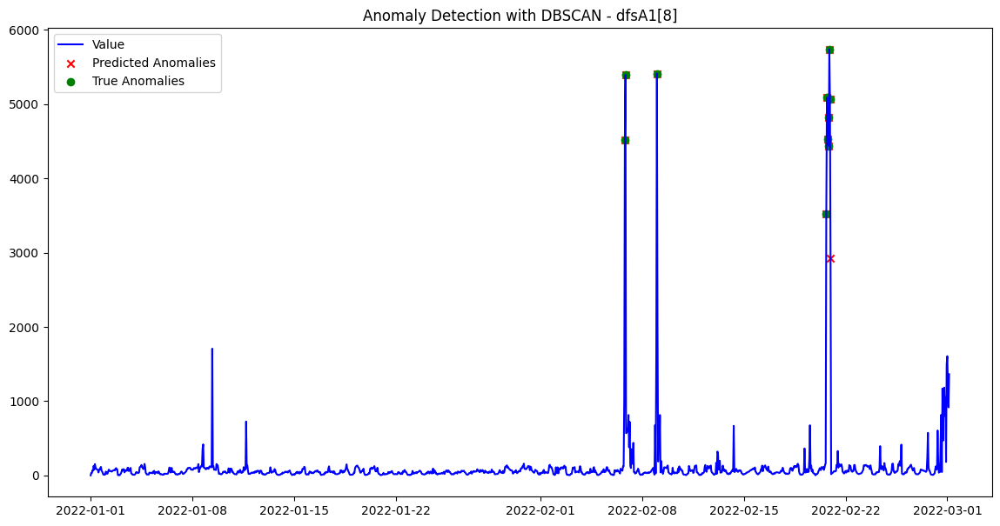

Processing dataset dfsA1[9]...
Best F1 Score for dfsA1[9]: 0.7273
Best Precision: 0.5714
Best Recall: 1.0000
Best Parameters: {'eps': 0.5, 'min_samples': 10}


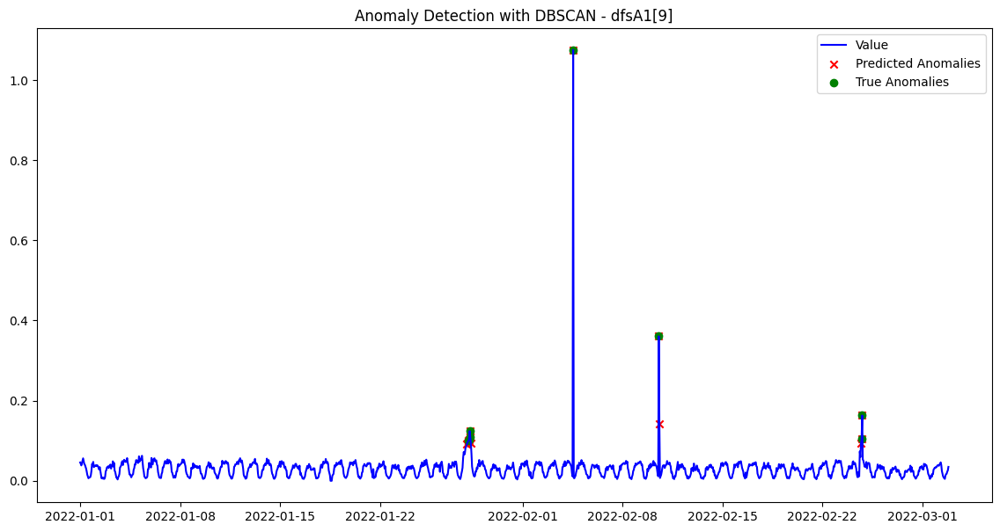

Processing dataset dfsA1[10]...
Best F1 Score for dfsA1[10]: 0.9630
Best Precision: 0.9286
Best Recall: 1.0000
Best Parameters: {'eps': 0.5, 'min_samples': 10}


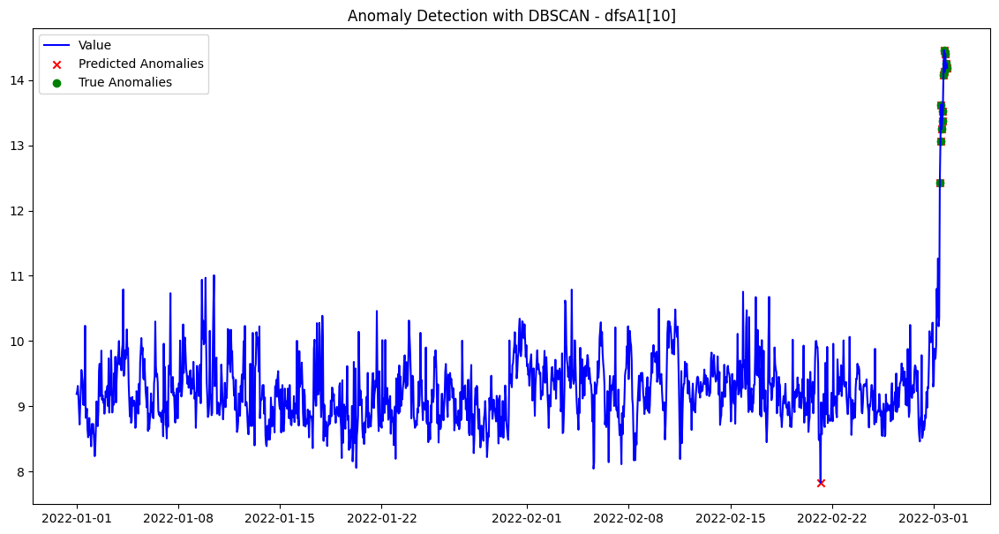

Processing dataset dfsA1[13]...
Best F1 Score for dfsA1[13]: 0.7826
Best Precision: 0.8182
Best Recall: 0.7500
Best Parameters: {'eps': 0.5, 'min_samples': 10}


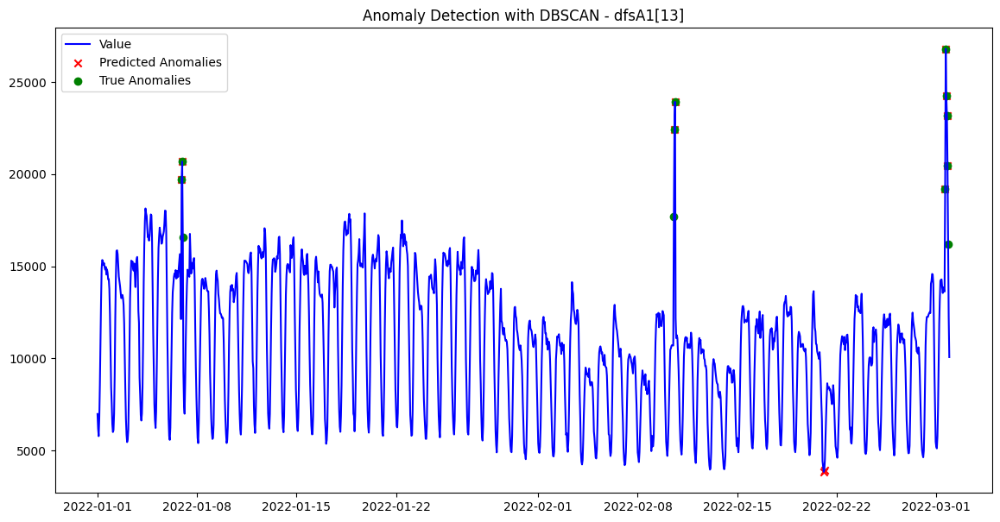

Processing dataset dfsA1[23]...


/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.p

Best F1 Score for dfsA1[23]: 0.7097
Best Precision: 0.9167
Best Recall: 0.5789
Best Parameters: {'eps': 1.0, 'min_samples': 20}


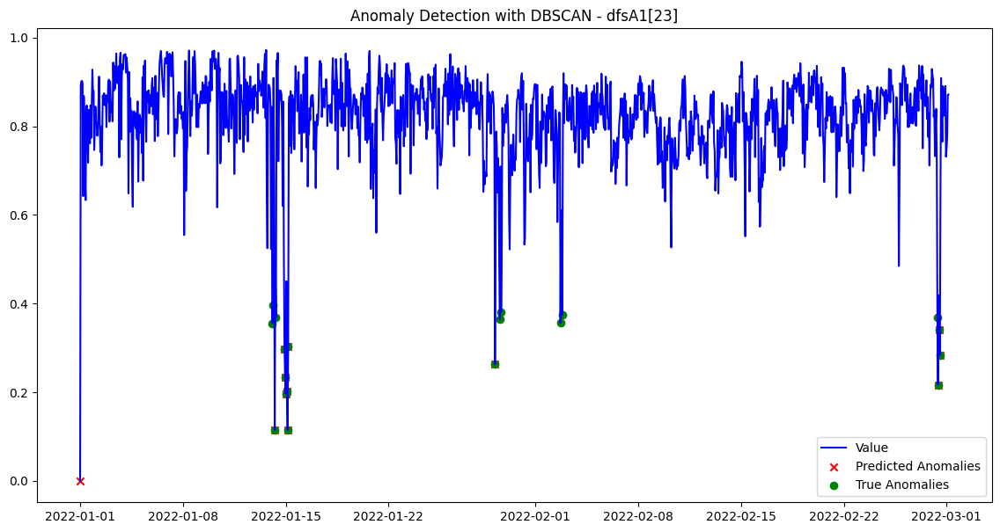

Processing dataset dfsA1[24]...
Best F1 Score for dfsA1[24]: 1.0000
Best Precision: 1.0000
Best Recall: 1.0000
Best Parameters: {'eps': 1.0, 'min_samples': 20}


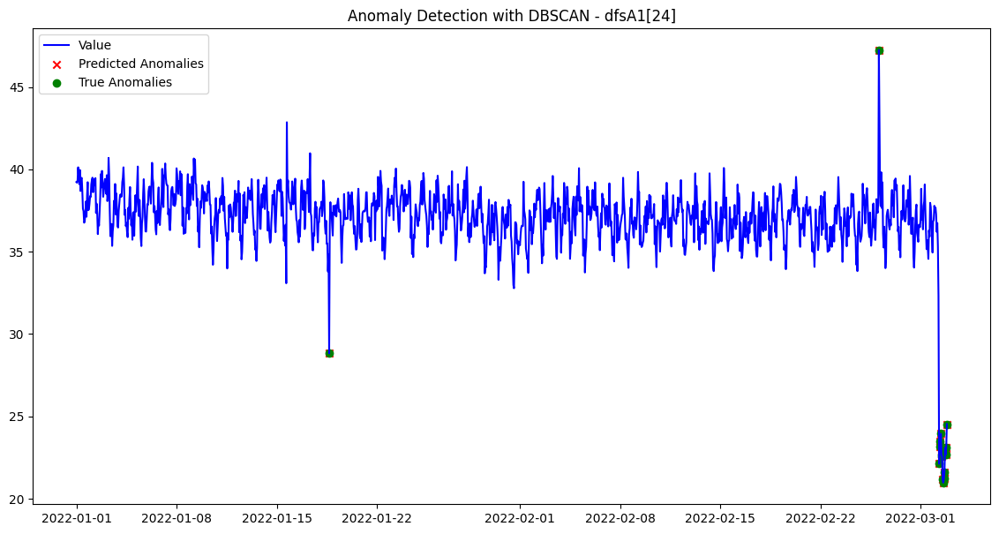

Processing dataset dfsA1[27]...
Best F1 Score for dfsA1[27]: 0.3636
Best Precision: 0.2222
Best Recall: 1.0000
Best Parameters: {'eps': 0.5, 'min_samples': 5}


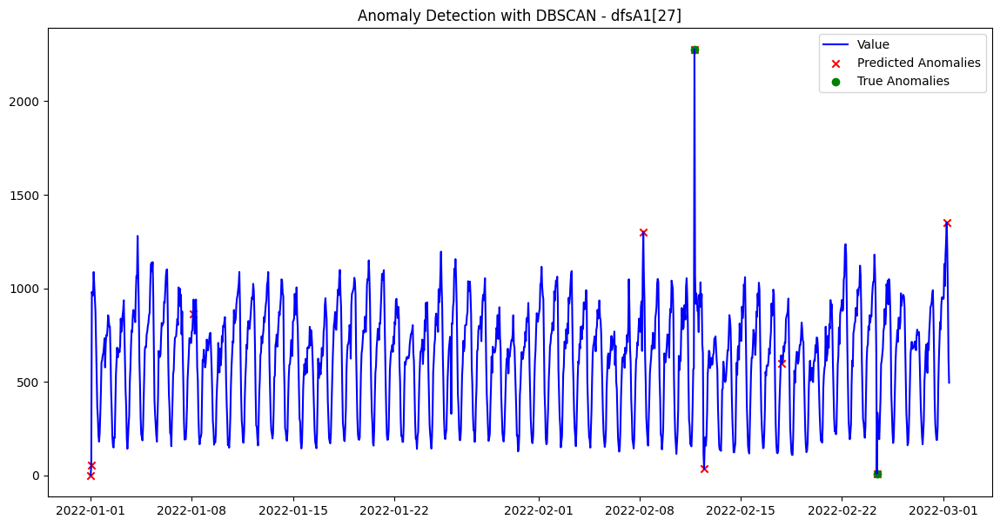

Processing dataset dfsA1[34]...


/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Best F1 Score for dfsA1[34]: 0.7368
Best Precision: 0.5833
Best Recall: 1.0000
Best Parameters: {'eps': 0.5, 'min_samples': 10}


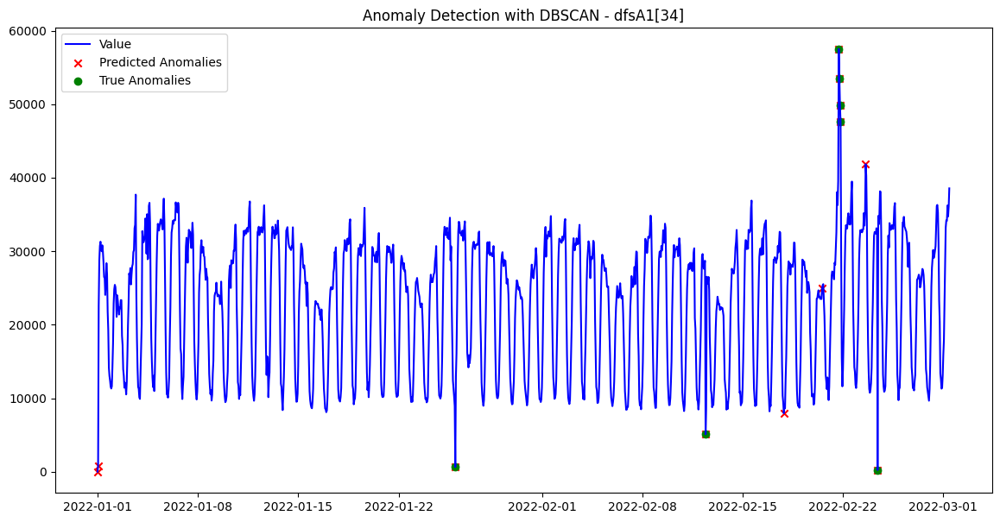

Processing dataset dfsA1[41]...
Best F1 Score for dfsA1[41]: 1.0000
Best Precision: 1.0000
Best Recall: 1.0000
Best Parameters: {'eps': 1.5, 'min_samples': 5}


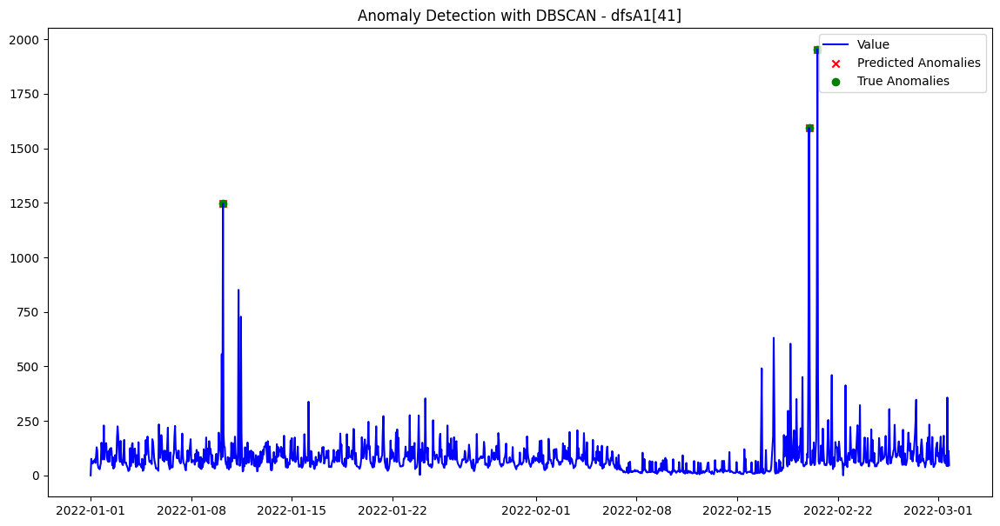

Processing dataset dfsA1[66]...


/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Best F1 Score for dfsA1[66]: 0.9500
Best Precision: 1.0000
Best Recall: 0.9048
Best Parameters: {'eps': 0.5, 'min_samples': 5}


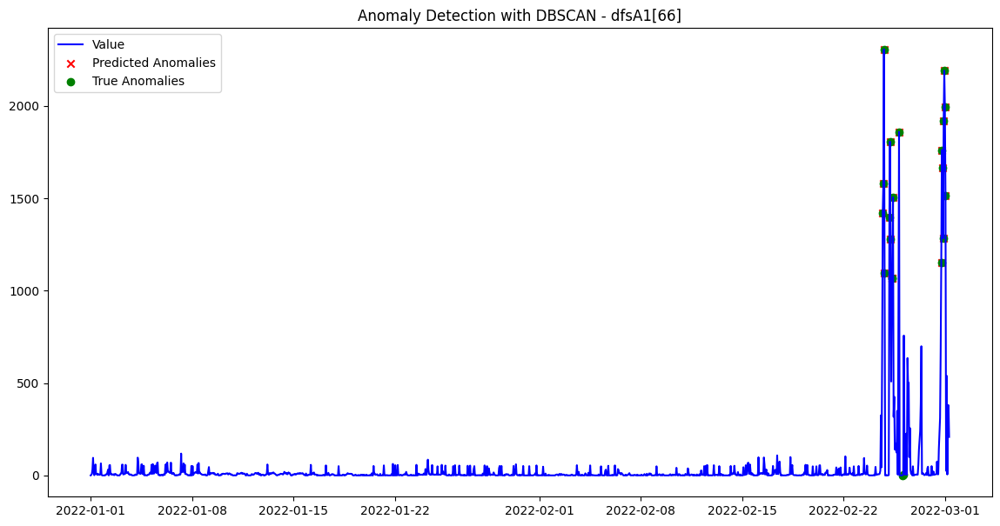

Average F1 Score across all datasets: 0.8250
Average Precision across all datasets: 0.7961
Average Recall across all datasets: 0.9362
All F1 Scores for each dataset: 0.5714, 0.9677, 1.0000, 0.9524, 0.7273, 0.9630, 0.7826, 0.7097, 1.0000, 0.3636, 0.7368, 1.0000, 0.9500


In [ ]:
from sklearn.cluster import DBSCAN
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import f1_score, precision_score, recall_score
from sklearn.model_selection import ParameterGrid
import matplotlib.pyplot as plt
import pandas as pd

# Define A1A and ParameterGrid for hyperparameter tuning
A1A = [1,2,3,8,9,10,13,23,24,27,34,41,66]

param_grid = {
    'eps': [0.5, 1.0, 1.5, 2.0],
    'min_samples': [5, 10, 20]
}
grid = ParameterGrid(param_grid)

# To calculate the average F1 score, precision, and recall
f1_scores = []
precision_scores = []
recall_scores = []

# Iterate through datasets
for i in A1A:
    print(f"Processing dataset dfsA1[{i}]...")

    # Feature engineering (you'll need to implement this function)
    data_features = dfsA1[i]

    # Separate features and labels
    X = data_features.drop(columns=['label'])  # Drop the label column
    y = data_features['label']  # Ground truth labels

    # Standardize features
    scaler = StandardScaler()
    X_scaled = scaler.fit_transform(X)

    # Hyperparameter tuning using grid search
    best_f1 = -1
    best_precision = -1
    best_recall = -1
    best_params = None
    best_predictions = None

    for params in grid:
        # Train DBSCAN with current parameters
        dbscan = DBSCAN(eps=params['eps'], min_samples=params['min_samples'])
        predictions = dbscan.fit_predict(X_scaled)

        # Map predictions to binary (1 = anomaly, 0 = normal)
        predictions = [1 if pred == -1 else 0 for pred in predictions]

        # Calculate metrics
        f1 = f1_score(y, predictions)
        precision = precision_score(y, predictions)
        recall = recall_score(y, predictions)

        # Update best parameters if current F1 is better
        if f1 > best_f1:
            best_f1 = f1
            best_precision = precision
            best_recall = recall
            best_params = params
            best_predictions = predictions

    # Append best metrics for the dataset
    f1_scores.append(best_f1)
    precision_scores.append(best_precision)
    recall_scores.append(best_recall)

    # Output best parameters and metrics for current dataset
    print(f"Best F1 Score for dfsA1[{i}]: {best_f1:.4f}")
    print(f"Best Precision: {best_precision:.4f}")
    print(f"Best Recall: {best_recall:.4f}")
    print(f"Best Parameters: {best_params}")

    # Add predictions to the original DataFrame for inspection
    data_features['predictions'] = best_predictions

    # Visualize anomalies
    plt.figure(figsize=(14, 7))
    plt.plot(data_features.index, data_features[f"value_{i}"], label='Value', color='blue')
    plt.scatter(data_features[data_features['predictions'] == 1].index,
                data_features[data_features['predictions'] == 1][f"value_{i}"],
                color='red', label='Predicted Anomalies', marker='x')
    plt.scatter(data_features[data_features['label'] == 1].index,
                data_features[data_features['label'] == 1][f"value_{i}"],
                color='green', label='True Anomalies', marker='o')

    plt.title(f'Anomaly Detection with DBSCAN - dfsA1[{i}]')
    plt.legend()
    plt.show()

# Calculate and output the average metrics
avg_f1_score = sum(f1_scores) / len(f1_scores)
avg_precision = sum(precision_scores) / len(precision_scores)
avg_recall = sum(recall_scores) / len(recall_scores)
print(f"Average F1 Score across all datasets: {avg_f1_score:.4f}")
print(f"Average Precision across all datasets: {avg_precision:.4f}")
print(f"Average Recall across all datasets: {avg_recall:.4f}")
# Print each F1 score formatted individually
formatted_f1_scores = [f"{score:.4f}" for score in f1_scores]
print(f"All F1 Scores for each dataset: {', '.join(formatted_f1_scores)}")


Processing dataset dfsA1[7]...
Best F1 Score for dfsA1[7]: 0.4015
Best Precision: 0.2596
Best Recall: 0.8852
Best Parameters: {'eps': 1.0, 'min_samples': 10}


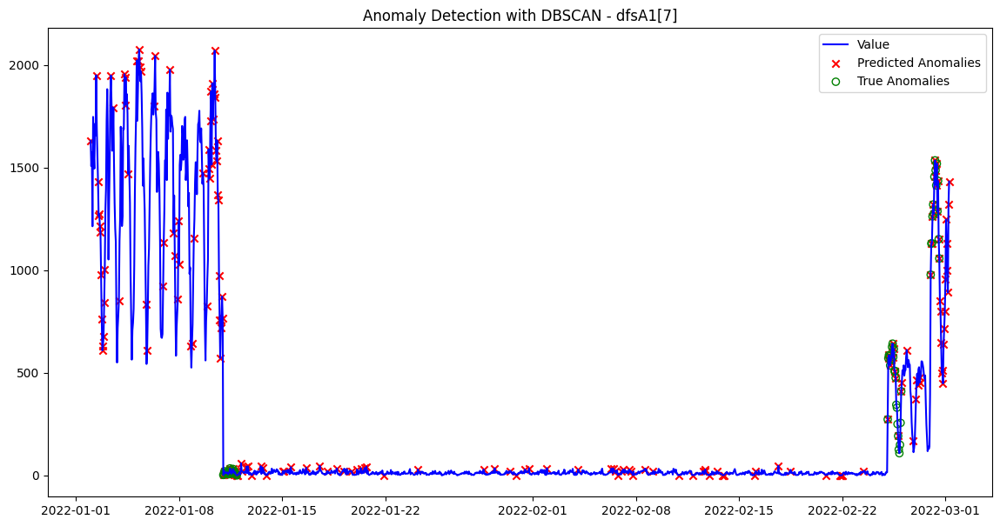

Processing dataset dfsA1[20]...
Best F1 Score for dfsA1[20]: 0.4590
Best Precision: 0.5000
Best Recall: 0.4242
Best Parameters: {'eps': 1.5, 'min_samples': 10}


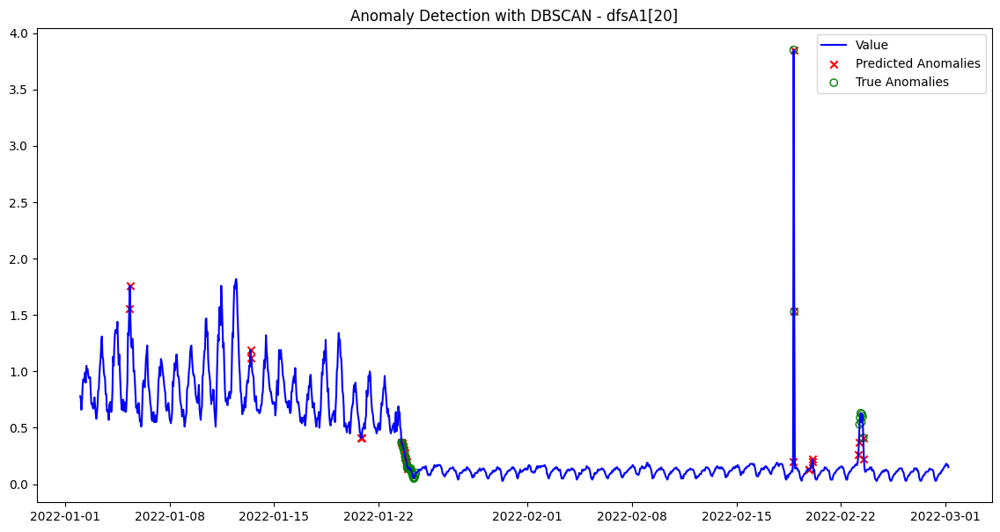

Processing dataset dfsA1[31]...
Best F1 Score for dfsA1[31]: 0.8276
Best Precision: 0.7059
Best Recall: 1.0000
Best Parameters: {'eps': 2.0, 'min_samples': 10}


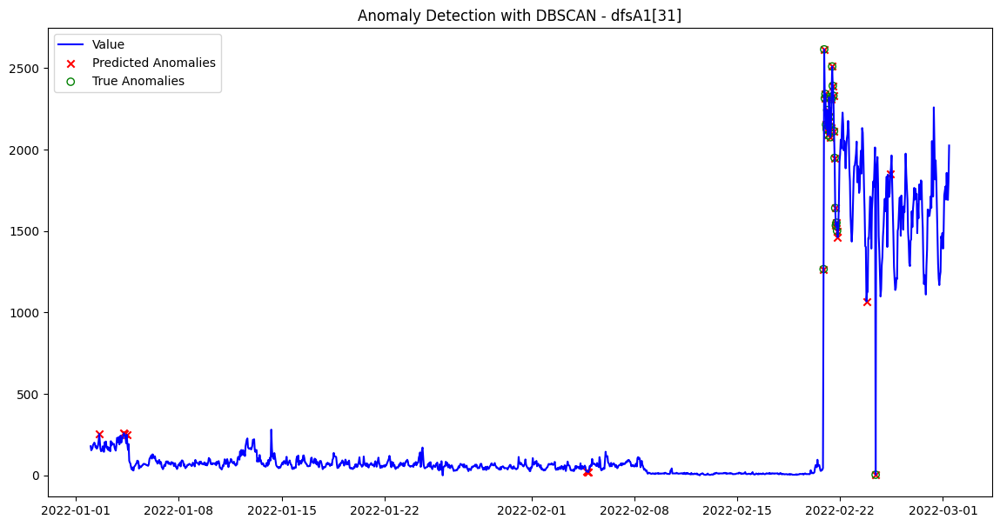

Processing dataset dfsA1[32]...
Best F1 Score for dfsA1[32]: 0.7692
Best Precision: 0.7018
Best Recall: 0.8511
Best Parameters: {'eps': 1.0, 'min_samples': 10}


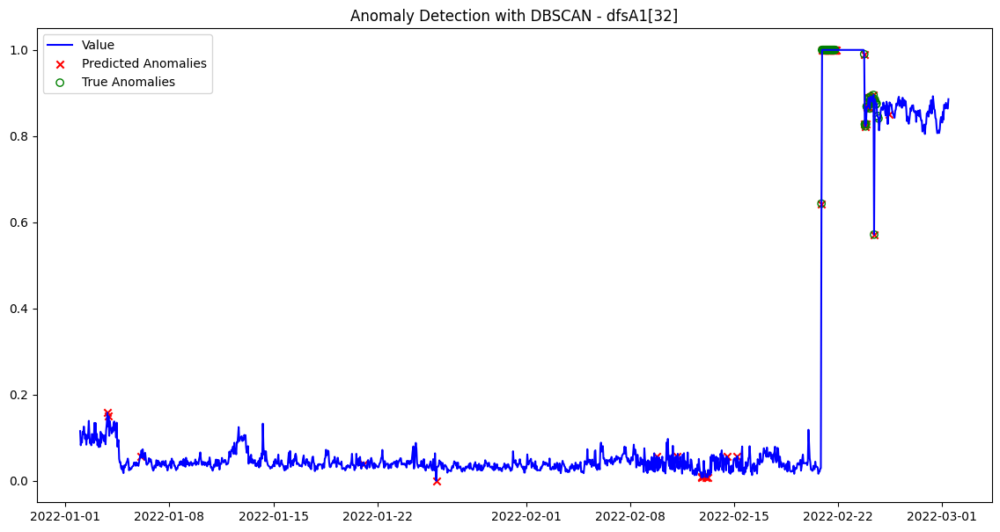

Processing dataset dfsA1[48]...
Best F1 Score for dfsA1[48]: 0.2051
Best Precision: 0.1481
Best Recall: 0.3333
Best Parameters: {'eps': 2.0, 'min_samples': 5}


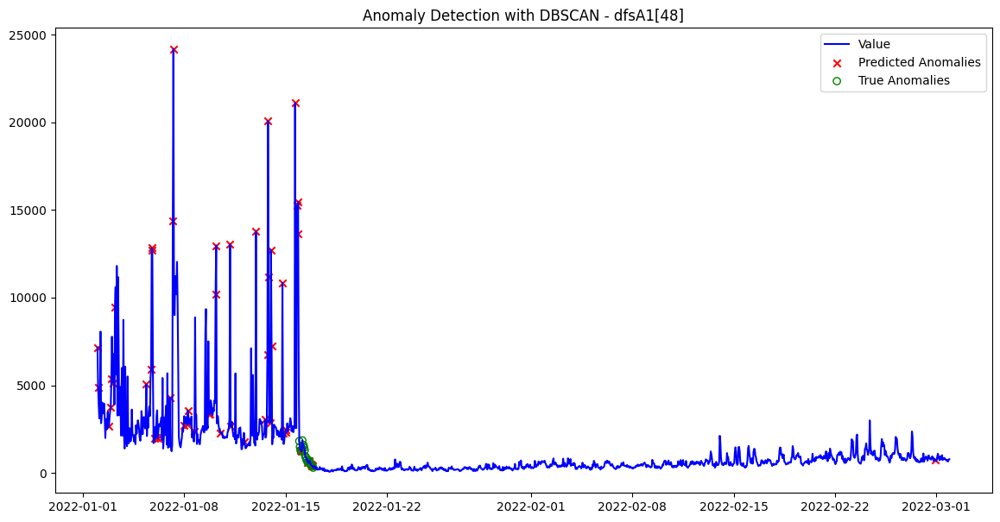

Processing dataset dfsA1[57]...
Best F1 Score for dfsA1[57]: 0.0952
Best Precision: 0.0513
Best Recall: 0.6667
Best Parameters: {'eps': 1.5, 'min_samples': 5}


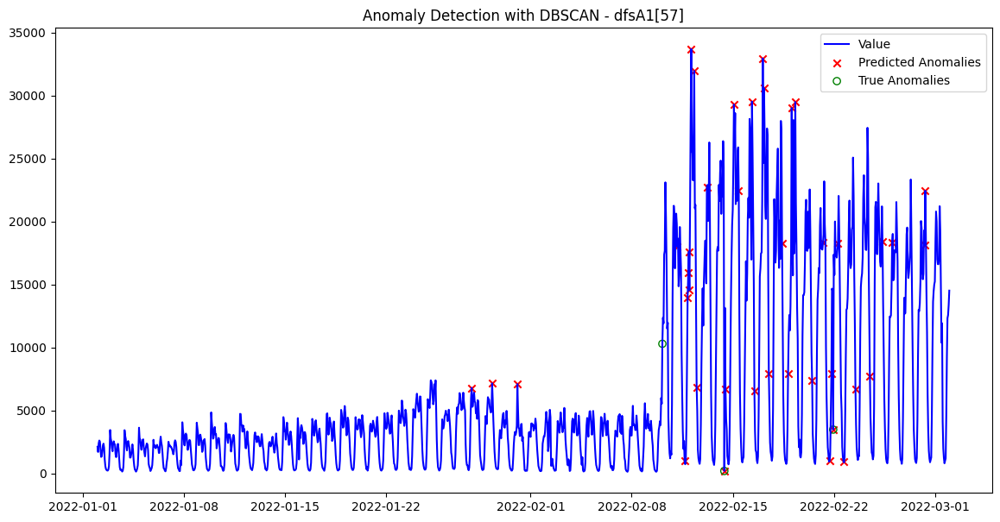

Processing dataset dfsA1[61]...
Best F1 Score for dfsA1[61]: 0.0682
Best Precision: 0.0469
Best Recall: 0.1250
Best Parameters: {'eps': 2.0, 'min_samples': 5}


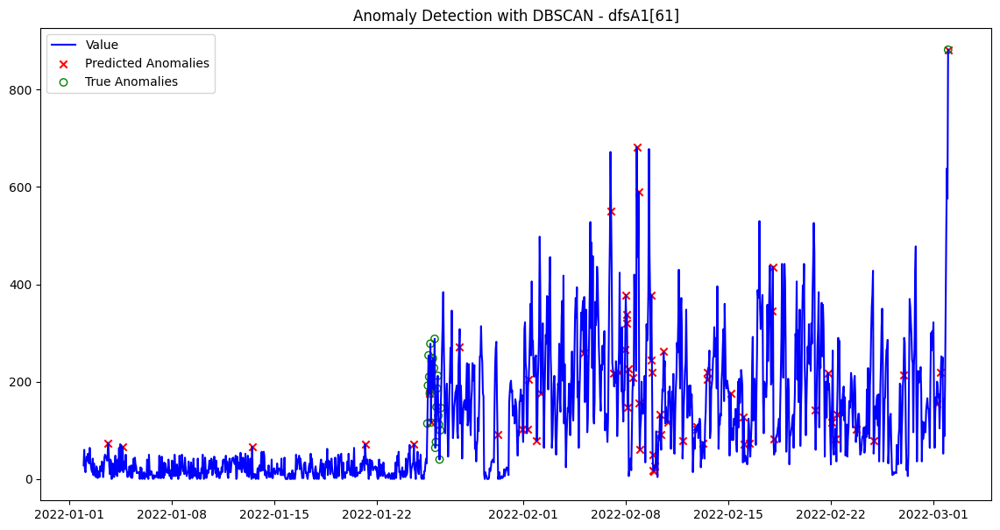

Average F1 Score across all datasets: 0.4037
Average Precision across all datasets: 0.3448
Average Recall across all datasets: 0.6122
All F1 Scores for each dataset: 0.4015, 0.4590, 0.8276, 0.7692, 0.2051, 0.0952, 0.0682


In [ ]:
from sklearn.cluster import DBSCAN
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import f1_score, precision_score, recall_score
from sklearn.model_selection import ParameterGrid
import matplotlib.pyplot as plt
import pandas as pd

# Define A1A and ParameterGrid for hyperparameter tuning
A1B = [7,20,31,32,48,57,61]
param_grid = {
    'eps': [0.5, 1.0, 1.5, 2.0],
    'min_samples': [5, 10, 20]
}
grid = ParameterGrid(param_grid)

# To calculate the average F1 score, precision, and recall
f1_scores = []
precision_scores = []
recall_scores = []

# Iterate through datasets
for i in A1B:
    print(f"Processing dataset dfsA1[{i}]...")

    # Feature engineering (you'll need to implement this function)
    data_features = feature_engineering(dfsA1[i], value_col=f"value_{i}", window_size=24)

    # Separate features and labels
    X = data_features.drop(columns=['label'])  # Drop the label column
    y = data_features['label']  # Ground truth labels

    # Standardize features
    scaler = StandardScaler()
    X_scaled = scaler.fit_transform(X)

    # Hyperparameter tuning using grid search
    best_f1 = -1
    best_precision = -1
    best_recall = -1
    best_params = None
    best_predictions = None

    for params in grid:
        # Train DBSCAN with current parameters
        dbscan = DBSCAN(eps=params['eps'], min_samples=params['min_samples'])
        predictions = dbscan.fit_predict(X_scaled)

        # Map predictions to binary (1 = anomaly, 0 = normal)
        predictions = [1 if pred == -1 else 0 for pred in predictions]

        # Calculate metrics
        f1 = f1_score(y, predictions)
        precision = precision_score(y, predictions)
        recall = recall_score(y, predictions)

        # Update best parameters if current F1 is better
        if f1 > best_f1:
            best_f1 = f1
            best_precision = precision
            best_recall = recall
            best_params = params
            best_predictions = predictions

    # Append best metrics for the dataset
    f1_scores.append(best_f1)
    precision_scores.append(best_precision)
    recall_scores.append(best_recall)

    # Output best parameters and metrics for current dataset
    print(f"Best F1 Score for dfsA1[{i}]: {best_f1:.4f}")
    print(f"Best Precision: {best_precision:.4f}")
    print(f"Best Recall: {best_recall:.4f}")
    print(f"Best Parameters: {best_params}")

    # Add predictions to the original DataFrame for inspection
    data_features['predictions'] = best_predictions

    # Visualize anomalies
    plt.figure(figsize=(14, 7))
    plt.plot(data_features.index, data_features[f"value_{i}"], label='Value', color='blue')
    plt.scatter(data_features[data_features['predictions'] == 1].index,
                data_features[data_features['predictions'] == 1][f"value_{i}"],
                color='red', label='Predicted Anomalies', marker='x')
    plt.scatter(data_features[data_features['label'] == 1].index,
                data_features[data_features['label'] == 1][f"value_{i}"],
                color='green', label='True Anomalies', facecolors="none", marker='o')

    plt.title(f'Anomaly Detection with DBSCAN - dfsA1[{i}]')
    plt.legend()
    plt.show()

# Calculate and output the average metrics
avg_f1_score = sum(f1_scores) / len(f1_scores)
avg_precision = sum(precision_scores) / len(precision_scores)
avg_recall = sum(recall_scores) / len(recall_scores)
print(f"Average F1 Score across all datasets: {avg_f1_score:.4f}")
print(f"Average Precision across all datasets: {avg_precision:.4f}")
print(f"Average Recall across all datasets: {avg_recall:.4f}")
# Print each F1 score formatted individually
formatted_f1_scores = [f"{score:.4f}" for score in f1_scores]
print(f"All F1 Scores for each dataset: {', '.join(formatted_f1_scores)}")


Processing dataset dfsA1[7]...


/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.p

Best F1 Score for dfsA1[7]: 0.0000
Best Precision: 0.0000
Best Recall: 0.0000
Best Parameters: {'eps': 0.5, 'min_samples': 5}


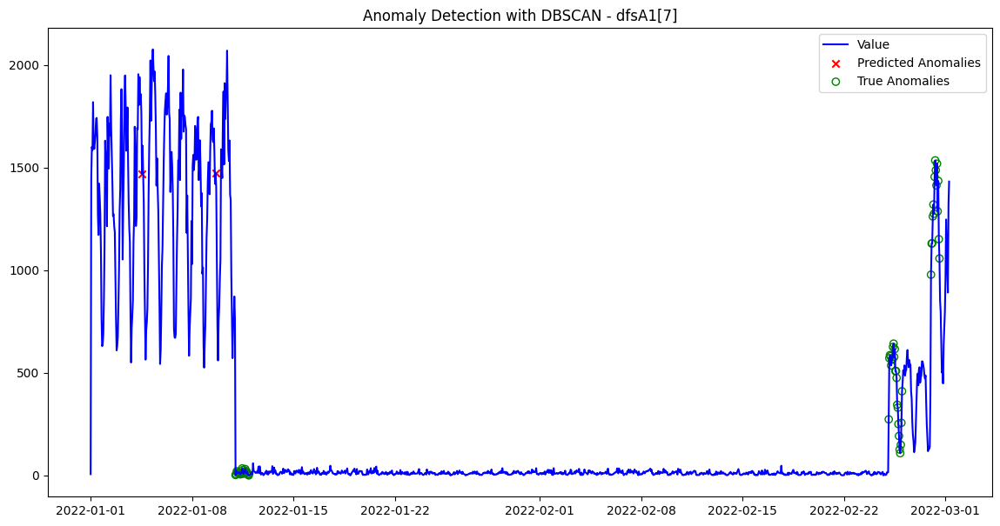

Processing dataset dfsA1[20]...
Best F1 Score for dfsA1[20]: 0.3692
Best Precision: 0.3750
Best Recall: 0.3636
Best Parameters: {'eps': 0.5, 'min_samples': 20}


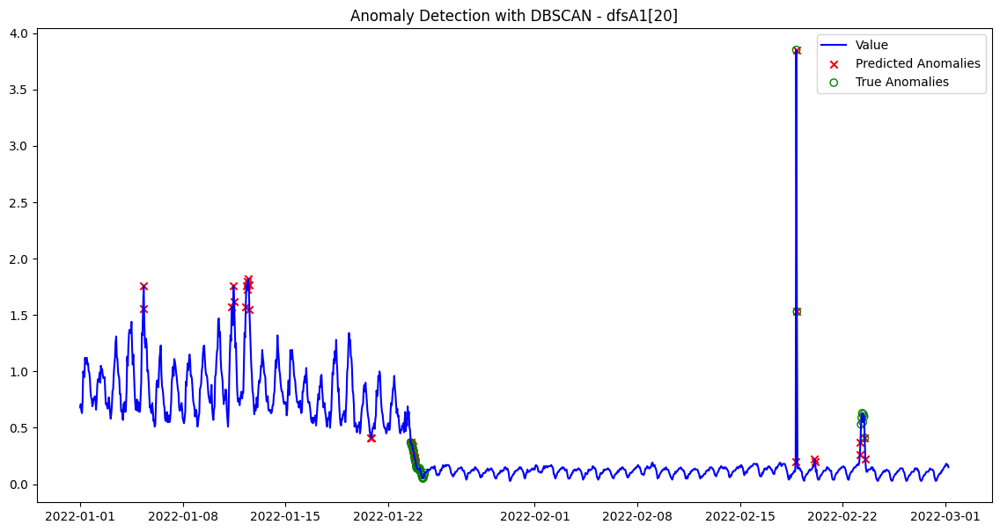

Processing dataset dfsA1[31]...


/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Best F1 Score for dfsA1[31]: 0.5000
Best Precision: 1.0000
Best Recall: 0.3333
Best Parameters: {'eps': 1.5, 'min_samples': 10}


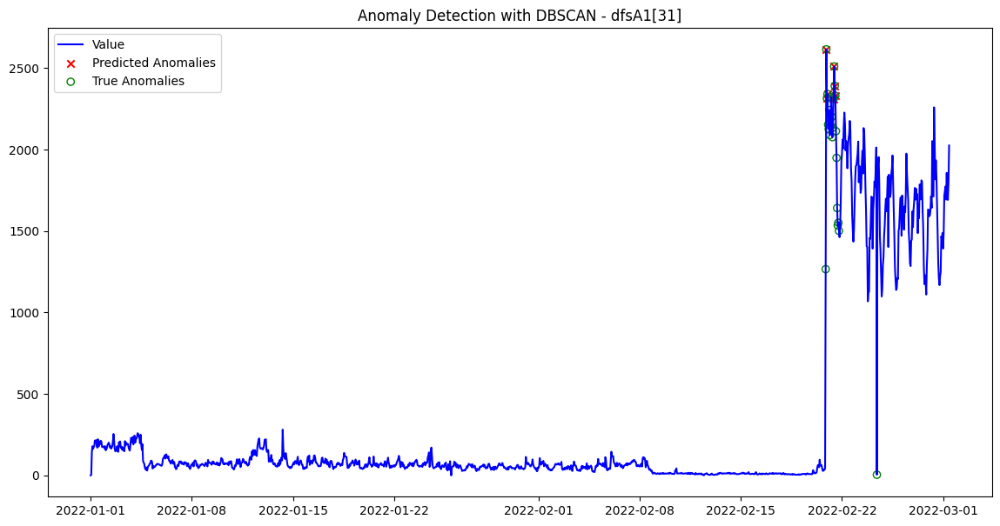

Processing dataset dfsA1[32]...


/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.p

Best F1 Score for dfsA1[32]: 0.2264
Best Precision: 1.0000
Best Recall: 0.1277
Best Parameters: {'eps': 0.5, 'min_samples': 5}


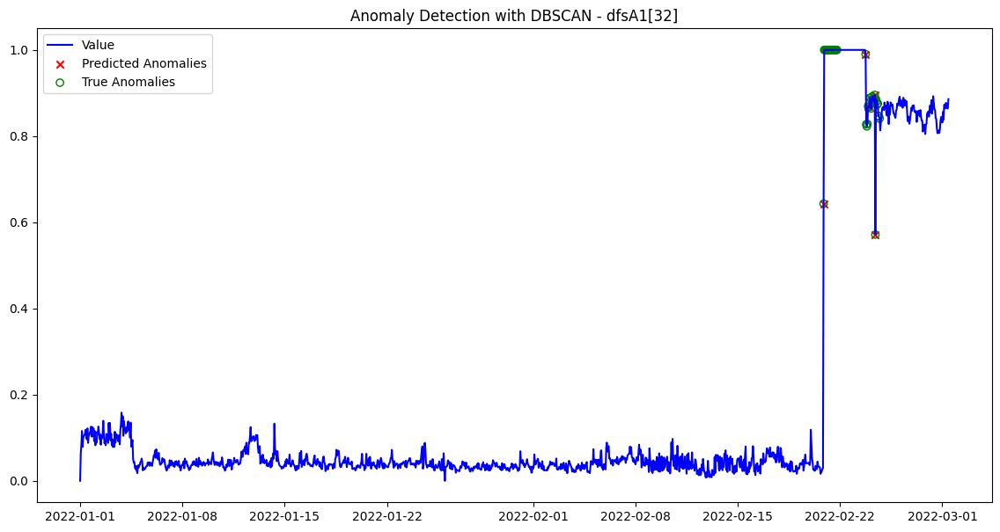

Processing dataset dfsA1[48]...


/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Best F1 Score for dfsA1[48]: 0.0000
Best Precision: 0.0000
Best Recall: 0.0000
Best Parameters: {'eps': 0.5, 'min_samples': 5}


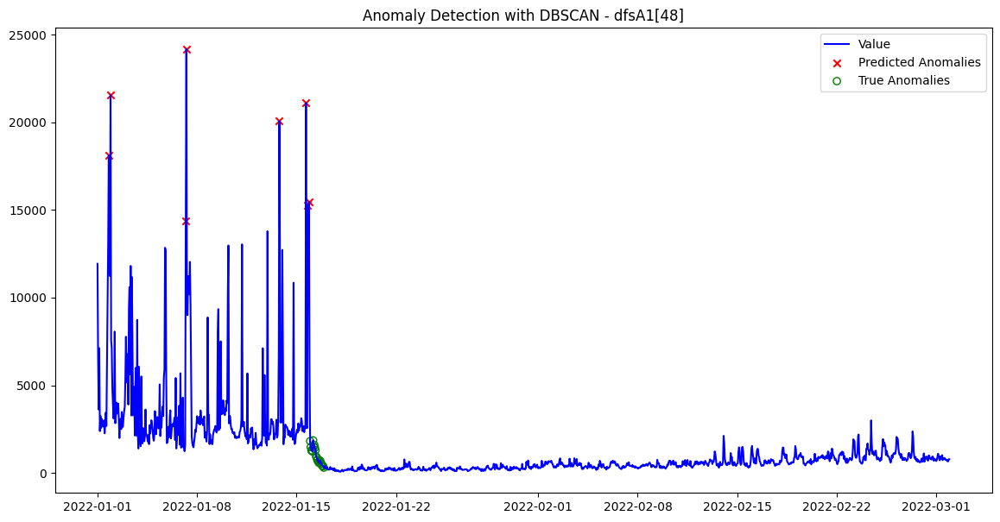

Processing dataset dfsA1[57]...


/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.p

Best F1 Score for dfsA1[57]: 0.0000
Best Precision: 0.0000
Best Recall: 0.0000
Best Parameters: {'eps': 0.5, 'min_samples': 5}


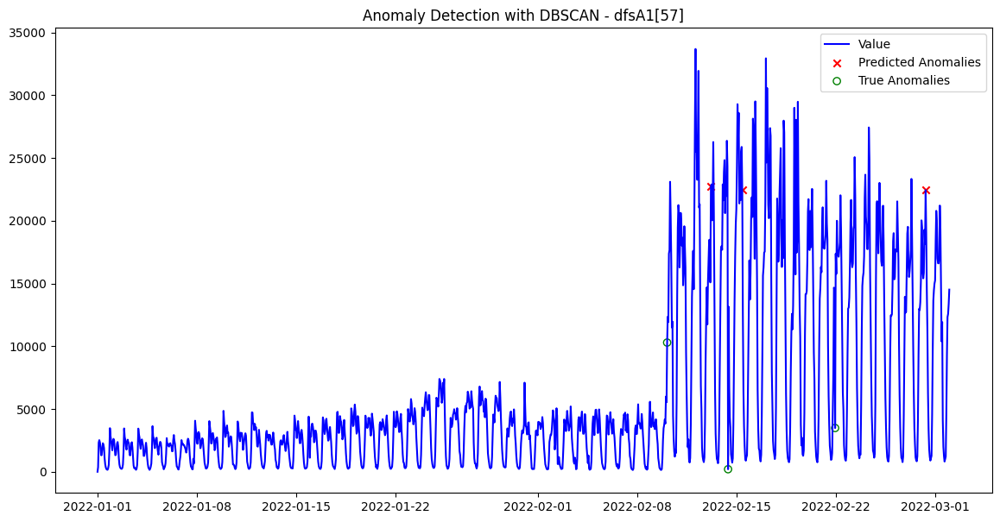

Processing dataset dfsA1[61]...
Best F1 Score for dfsA1[61]: 0.0800
Best Precision: 1.0000
Best Recall: 0.0417
Best Parameters: {'eps': 0.5, 'min_samples': 5}


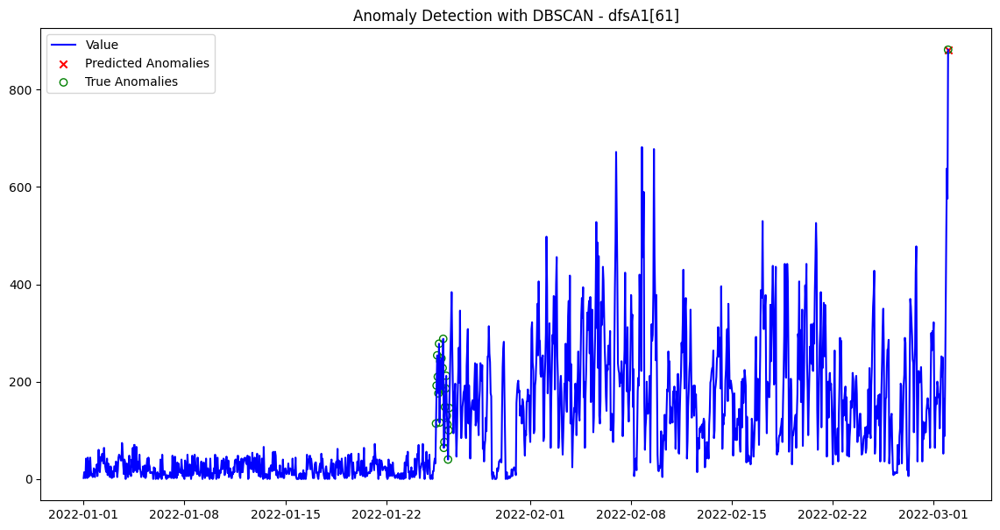

Average F1 Score across all datasets: 0.1679
Average Precision across all datasets: 0.4821
Average Recall across all datasets: 0.1238
All F1 Scores for each dataset: 0.0000, 0.3692, 0.5000, 0.2264, 0.0000, 0.0000, 0.0800


In [ ]:
from sklearn.cluster import DBSCAN
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import f1_score, precision_score, recall_score
from sklearn.model_selection import ParameterGrid
import matplotlib.pyplot as plt
import pandas as pd

# Define A1A and ParameterGrid for hyperparameter tuning
A1B = [7,20,31,32,48,57,61]
param_grid = {
    'eps': [0.5, 1.0, 1.5, 2.0],
    'min_samples': [5, 10, 20]
}
grid = ParameterGrid(param_grid)

# To calculate the average F1 score, precision, and recall
f1_scores = []
precision_scores = []
recall_scores = []

# Iterate through datasets
for i in A1B:
    print(f"Processing dataset dfsA1[{i}]...")

    # Feature engineering (you'll need to implement this function)
    data_features = dfsA1[i]

    # Separate features and labels
    X = data_features.drop(columns=['label'])  # Drop the label column
    y = data_features['label']  # Ground truth labels

    # Standardize features
    scaler = StandardScaler()
    X_scaled = scaler.fit_transform(X)

    # Hyperparameter tuning using grid search
    best_f1 = -1
    best_precision = -1
    best_recall = -1
    best_params = None
    best_predictions = None

    for params in grid:
        # Train DBSCAN with current parameters
        dbscan = DBSCAN(eps=params['eps'], min_samples=params['min_samples'])
        predictions = dbscan.fit_predict(X_scaled)

        # Map predictions to binary (1 = anomaly, 0 = normal)
        predictions = [1 if pred == -1 else 0 for pred in predictions]

        # Calculate metrics
        f1 = f1_score(y, predictions)
        precision = precision_score(y, predictions)
        recall = recall_score(y, predictions)

        # Update best parameters if current F1 is better
        if f1 > best_f1:
            best_f1 = f1
            best_precision = precision
            best_recall = recall
            best_params = params
            best_predictions = predictions

    # Append best metrics for the dataset
    f1_scores.append(best_f1)
    precision_scores.append(best_precision)
    recall_scores.append(best_recall)

    # Output best parameters and metrics for current dataset
    print(f"Best F1 Score for dfsA1[{i}]: {best_f1:.4f}")
    print(f"Best Precision: {best_precision:.4f}")
    print(f"Best Recall: {best_recall:.4f}")
    print(f"Best Parameters: {best_params}")

    # Add predictions to the original DataFrame for inspection
    data_features['predictions'] = best_predictions

    # Visualize anomalies
    plt.figure(figsize=(14, 7))
    plt.plot(data_features.index, data_features[f"value_{i}"], label='Value', color='blue')
    plt.scatter(data_features[data_features['predictions'] == 1].index,
                data_features[data_features['predictions'] == 1][f"value_{i}"],
                color='red', label='Predicted Anomalies', marker='x')
    plt.scatter(data_features[data_features['label'] == 1].index,
                data_features[data_features['label'] == 1][f"value_{i}"],
                color='green', label='True Anomalies', facecolors="none", marker='o')

    plt.title(f'Anomaly Detection with DBSCAN - dfsA1[{i}]')
    plt.legend()
    plt.show()

# Calculate and output the average metrics
avg_f1_score = sum(f1_scores) / len(f1_scores)
avg_precision = sum(precision_scores) / len(precision_scores)
avg_recall = sum(recall_scores) / len(recall_scores)
print(f"Average F1 Score across all datasets: {avg_f1_score:.4f}")
print(f"Average Precision across all datasets: {avg_precision:.4f}")
print(f"Average Recall across all datasets: {avg_recall:.4f}")
# Print each F1 score formatted individually
formatted_f1_scores = [f"{score:.4f}" for score in f1_scores]
print(f"All F1 Scores for each dataset: {', '.join(formatted_f1_scores)}")


Processing dataset dfsA1[17]...
Best F1 Score for dfsA1[17]: 0.7726
Best Precision: 0.6313
Best Recall: 0.9956
Best Parameters: {'eps': 1.5, 'min_samples': 20}


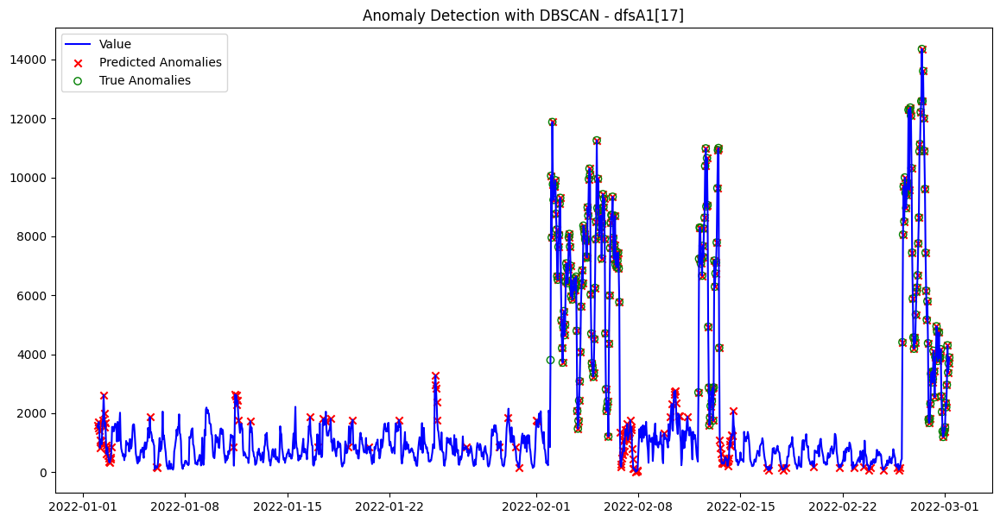

Processing dataset dfsA1[19]...
Best F1 Score for dfsA1[19]: 0.8043
Best Precision: 0.6746
Best Recall: 0.9956
Best Parameters: {'eps': 1.5, 'min_samples': 20}


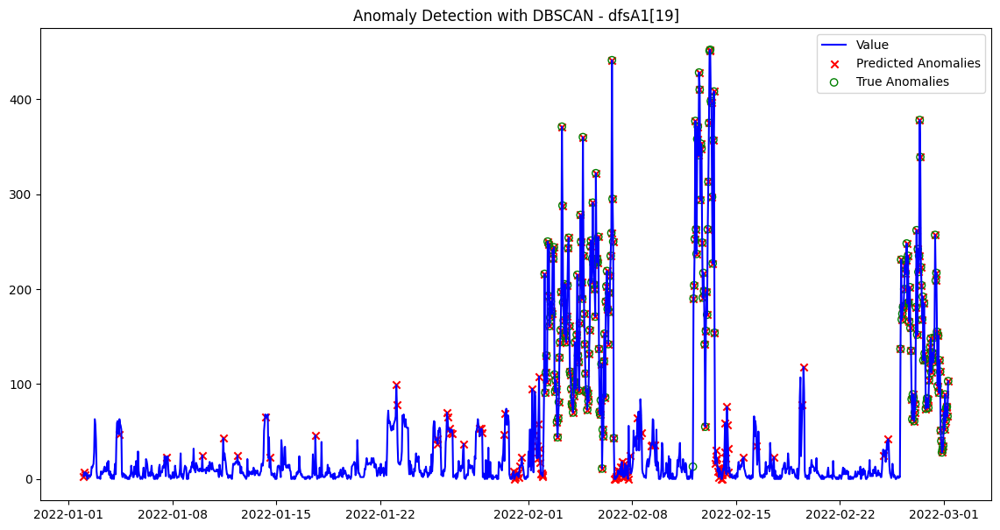

Processing dataset dfsA1[26]...
Best F1 Score for dfsA1[26]: 0.1009
Best Precision: 0.0532
Best Recall: 1.0000
Best Parameters: {'eps': 0.5, 'min_samples': 10}


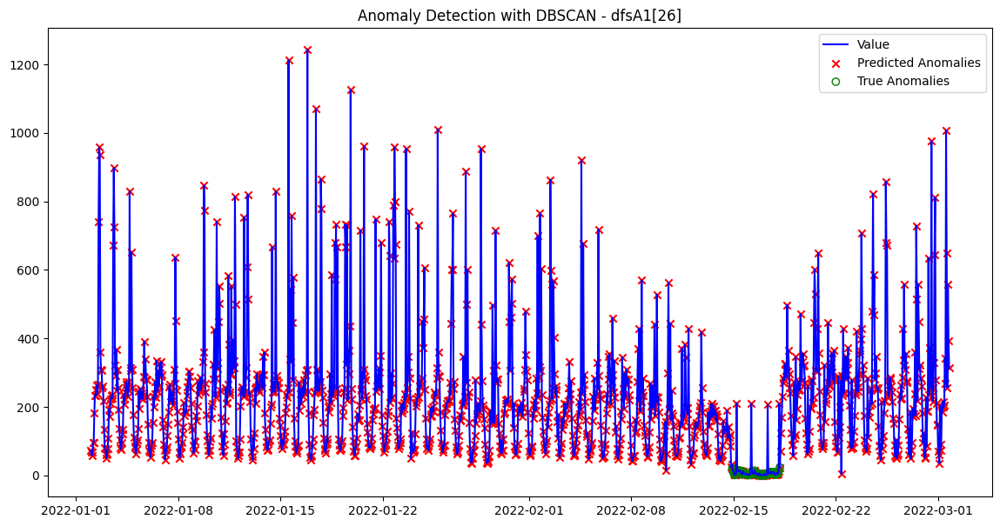

Processing dataset dfsA1[37]...
Best F1 Score for dfsA1[37]: 0.3117
Best Precision: 0.2791
Best Recall: 0.3529
Best Parameters: {'eps': 2.0, 'min_samples': 5}


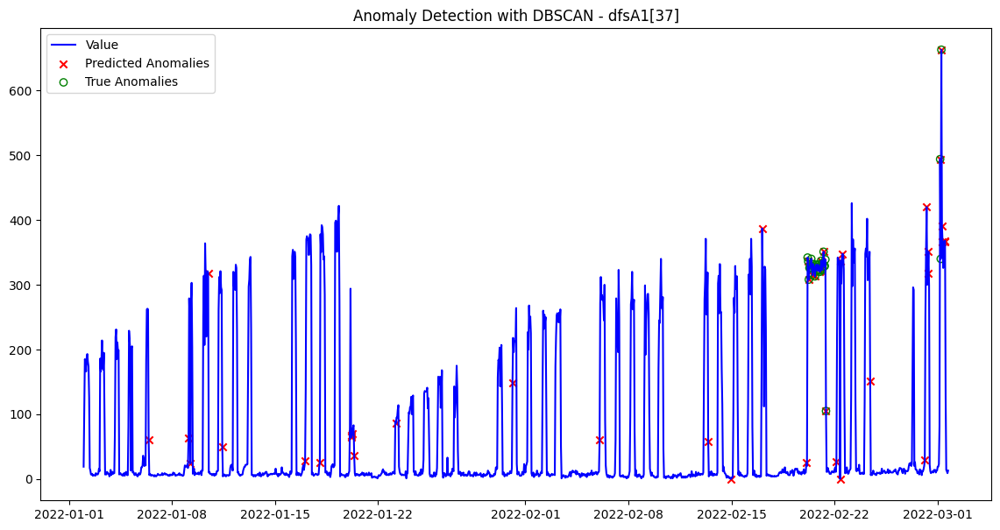

Processing dataset dfsA1[40]...
Best F1 Score for dfsA1[40]: 0.1851
Best Precision: 0.1294
Best Recall: 0.3250
Best Parameters: {'eps': 2.0, 'min_samples': 20}


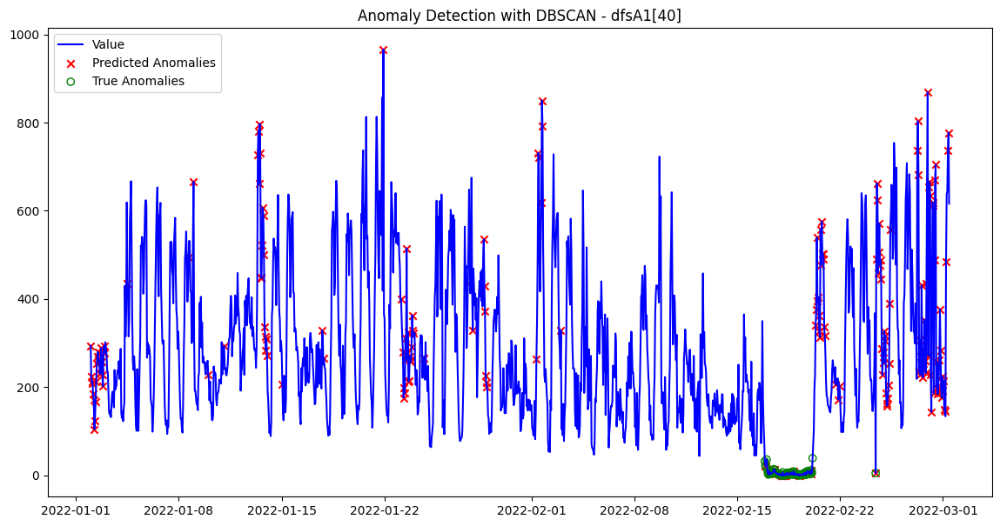

Processing dataset dfsA1[47]...
Best F1 Score for dfsA1[47]: 0.2353
Best Precision: 0.1667
Best Recall: 0.4000
Best Parameters: {'eps': 1.5, 'min_samples': 5}


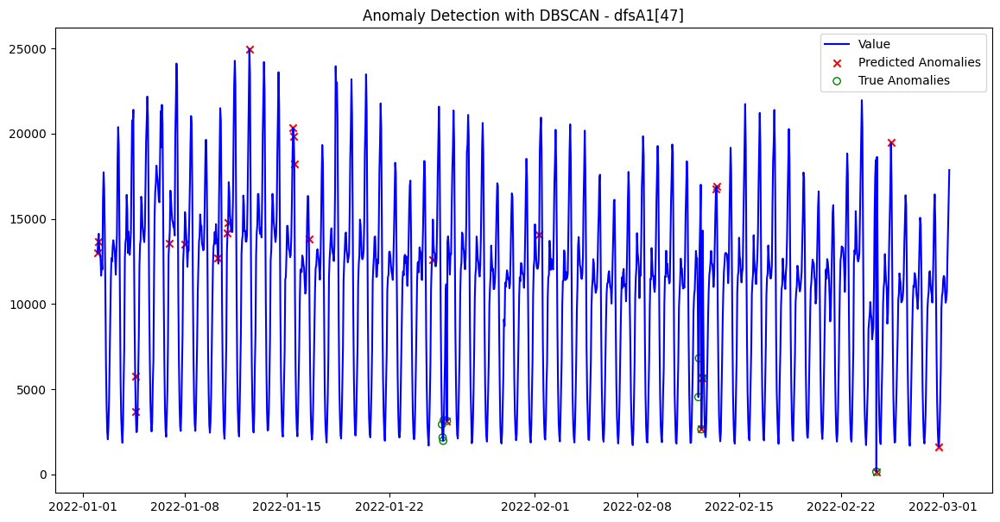

Average F1 Score across all datasets: 0.4016
Average Precision across all datasets: 0.3224
Average Recall across all datasets: 0.6782
All F1 Scores for each dataset: 0.7726, 0.8043, 0.1009, 0.3117, 0.1851, 0.2353


In [ ]:
from sklearn.cluster import DBSCAN
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import f1_score, precision_score, recall_score
from sklearn.model_selection import ParameterGrid
import matplotlib.pyplot as plt
import pandas as pd

# Define A1A and ParameterGrid for hyperparameter tuning
A1C = [17, 19, 26, 37, 40, 47]
param_grid = {
    'eps': [0.5, 1.0, 1.5, 2.0],
    'min_samples': [5, 10, 20]
}
grid = ParameterGrid(param_grid)

# To calculate the average F1 score, precision, and recall
f1_scores = []
precision_scores = []
recall_scores = []

# Iterate through datasets
for i in A1C:
    print(f"Processing dataset dfsA1[{i}]...")

    # Feature engineering (you'll need to implement this function)
    data_features = feature_engineering(dfsA1[i], value_col=f"value_{i}", window_size=24)

    # Separate features and labels
    X = data_features.drop(columns=['label'])  # Drop the label column
    y = data_features['label']  # Ground truth labels

    # Standardize features
    scaler = StandardScaler()
    X_scaled = scaler.fit_transform(X)

    # Hyperparameter tuning using grid search
    best_f1 = -1
    best_precision = -1
    best_recall = -1
    best_params = None
    best_predictions = None

    for params in grid:
        # Train DBSCAN with current parameters
        dbscan = DBSCAN(eps=params['eps'], min_samples=params['min_samples'])
        predictions = dbscan.fit_predict(X_scaled)

        # Map predictions to binary (1 = anomaly, 0 = normal)
        predictions = [1 if pred == -1 else 0 for pred in predictions]

        # Calculate metrics
        f1 = f1_score(y, predictions)
        precision = precision_score(y, predictions)
        recall = recall_score(y, predictions)

        # Update best parameters if current F1 is better
        if f1 > best_f1:
            best_f1 = f1
            best_precision = precision
            best_recall = recall
            best_params = params
            best_predictions = predictions

    # Append best metrics for the dataset
    f1_scores.append(best_f1)
    precision_scores.append(best_precision)
    recall_scores.append(best_recall)

    # Output best parameters and metrics for current dataset
    print(f"Best F1 Score for dfsA1[{i}]: {best_f1:.4f}")
    print(f"Best Precision: {best_precision:.4f}")
    print(f"Best Recall: {best_recall:.4f}")
    print(f"Best Parameters: {best_params}")

    # Add predictions to the original DataFrame for inspection
    data_features['predictions'] = best_predictions

    # Visualize anomalies
    plt.figure(figsize=(14, 7))
    plt.plot(data_features.index, data_features[f"value_{i}"], label='Value', color='blue')
    plt.scatter(data_features[data_features['predictions'] == 1].index,
                data_features[data_features['predictions'] == 1][f"value_{i}"],
                color='red', label='Predicted Anomalies', marker='x')
    plt.scatter(data_features[data_features['label'] == 1].index,
                data_features[data_features['label'] == 1][f"value_{i}"],
                color='green', label='True Anomalies', facecolors="none", marker='o')

    plt.title(f'Anomaly Detection with DBSCAN - dfsA1[{i}]')
    plt.legend()
    plt.show()

# Calculate and output the average metrics
avg_f1_score = sum(f1_scores) / len(f1_scores)
avg_precision = sum(precision_scores) / len(precision_scores)
avg_recall = sum(recall_scores) / len(recall_scores)
print(f"Average F1 Score across all datasets: {avg_f1_score:.4f}")
print(f"Average Precision across all datasets: {avg_precision:.4f}")
print(f"Average Recall across all datasets: {avg_recall:.4f}")
# Print each F1 score formatted individually
formatted_f1_scores = [f"{score:.4f}" for score in f1_scores]
print(f"All F1 Scores for each dataset: {', '.join(formatted_f1_scores)}")


Processing dataset dfsA1[17]...


/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.p

Best F1 Score for dfsA1[17]: 0.2403
Best Precision: 1.0000
Best Recall: 0.1366
Best Parameters: {'eps': 0.5, 'min_samples': 20}


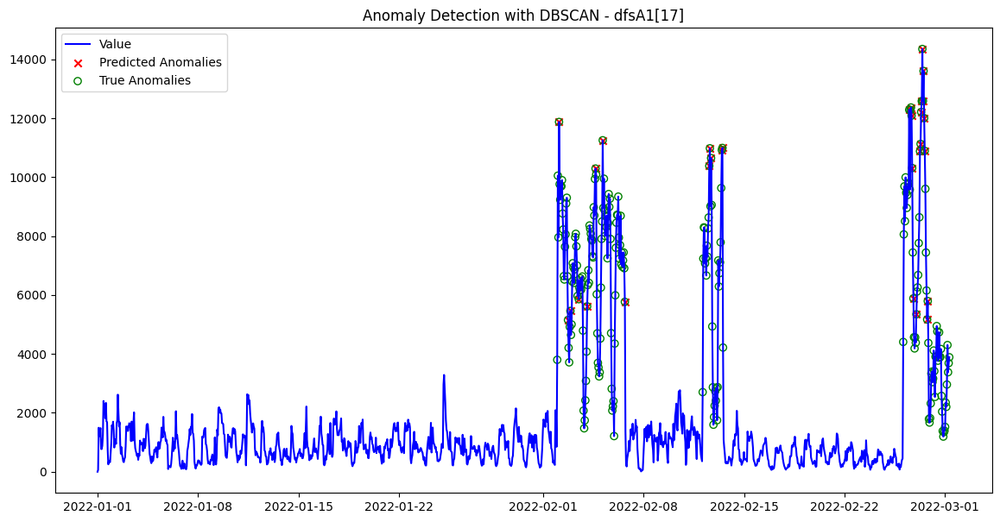

Processing dataset dfsA1[19]...


/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.p

Best F1 Score for dfsA1[19]: 0.2126
Best Precision: 1.0000
Best Recall: 0.1189
Best Parameters: {'eps': 0.5, 'min_samples': 20}


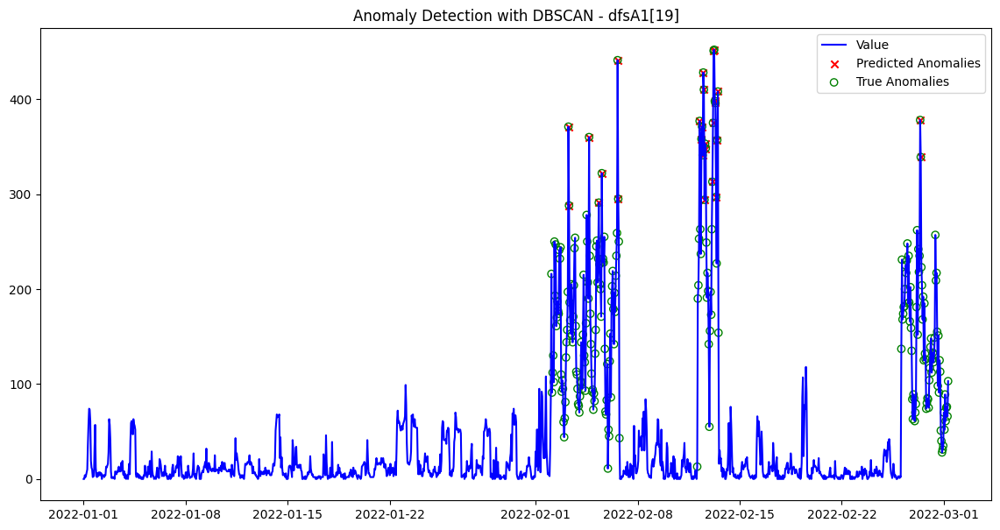

Processing dataset dfsA1[26]...


/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.p

Best F1 Score for dfsA1[26]: 0.0000
Best Precision: 0.0000
Best Recall: 0.0000
Best Parameters: {'eps': 0.5, 'min_samples': 5}


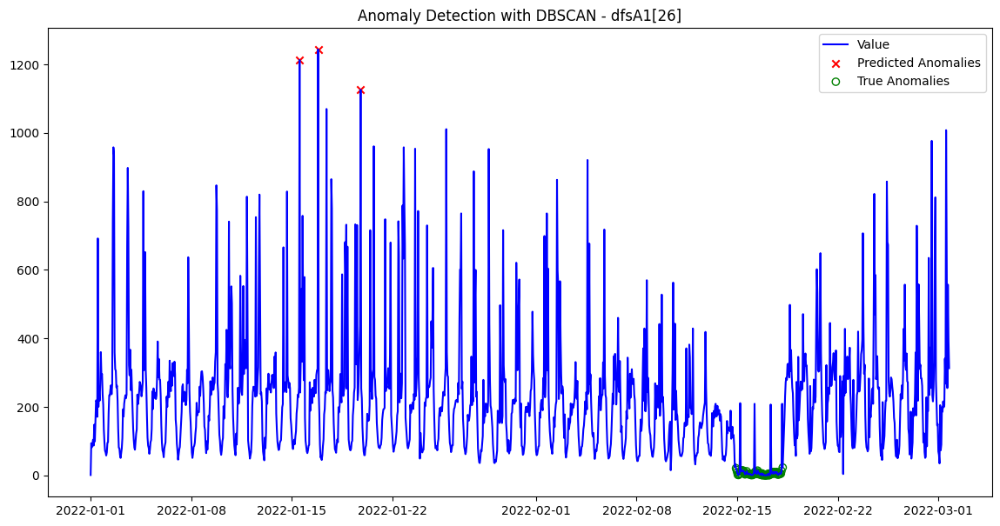

Processing dataset dfsA1[37]...


/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.p

Best F1 Score for dfsA1[37]: 0.1111
Best Precision: 1.0000
Best Recall: 0.0588
Best Parameters: {'eps': 0.5, 'min_samples': 5}


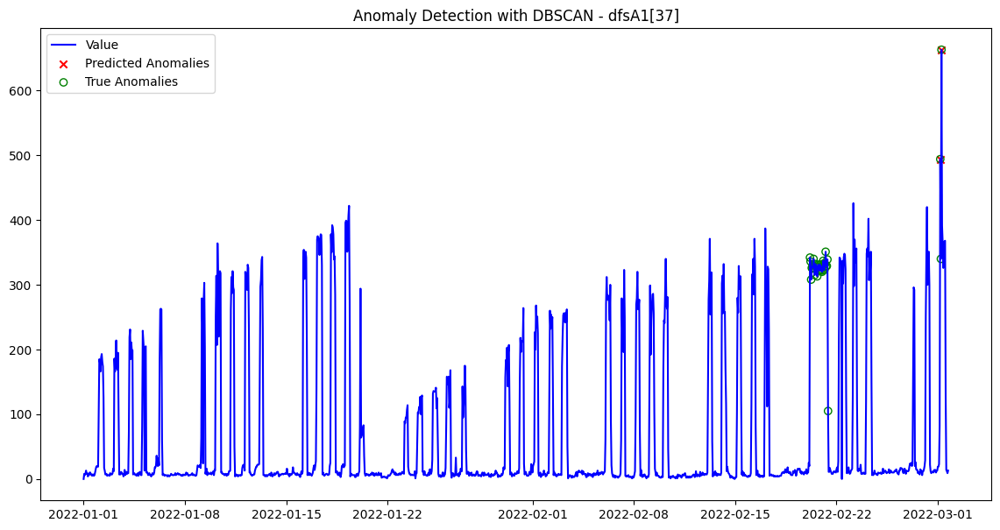

Processing dataset dfsA1[40]...
Best F1 Score for dfsA1[40]: 0.0000
Best Precision: 0.0000
Best Recall: 0.0000
Best Parameters: {'eps': 0.5, 'min_samples': 5}


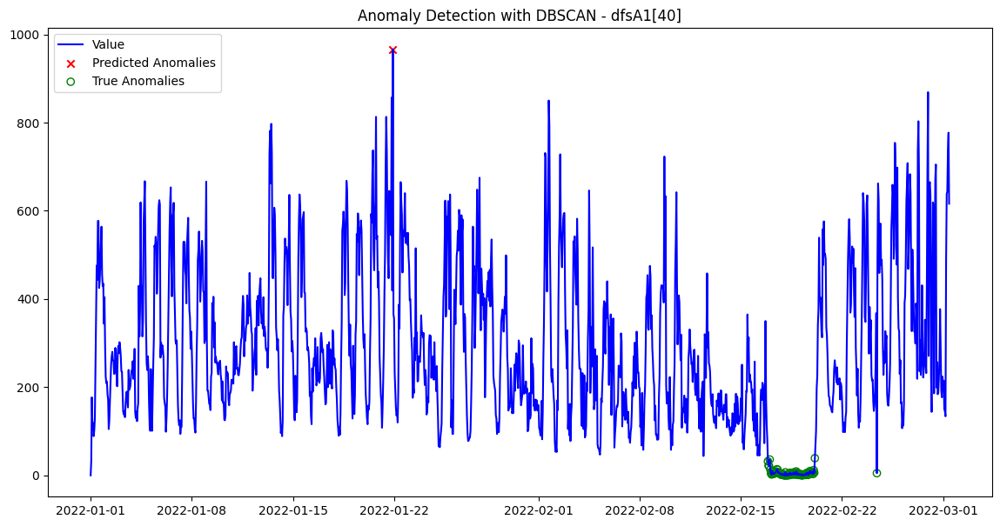

Processing dataset dfsA1[47]...
Best F1 Score for dfsA1[47]: 0.1176
Best Precision: 0.1429
Best Recall: 0.1000
Best Parameters: {'eps': 0.5, 'min_samples': 5}


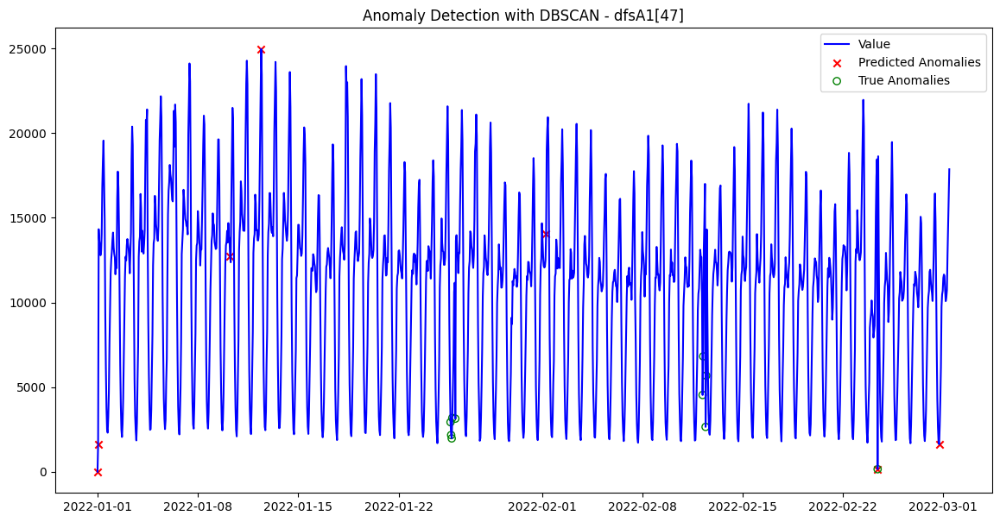

Average F1 Score across all datasets: 0.1136
Average Precision across all datasets: 0.5238
Average Recall across all datasets: 0.0691
All F1 Scores for each dataset: 0.2403, 0.2126, 0.0000, 0.1111, 0.0000, 0.1176


In [ ]:
from sklearn.cluster import DBSCAN
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import f1_score, precision_score, recall_score
from sklearn.model_selection import ParameterGrid
import matplotlib.pyplot as plt
import pandas as pd

# Define A1A and ParameterGrid for hyperparameter tuning
A1C = [17, 19, 26, 37, 40, 47]
param_grid = {
    'eps': [0.5, 1.0, 1.5, 2.0],
    'min_samples': [5, 10, 20]
}
grid = ParameterGrid(param_grid)

# To calculate the average F1 score, precision, and recall
f1_scores = []
precision_scores = []
recall_scores = []

# Iterate through datasets
for i in A1C:
    print(f"Processing dataset dfsA1[{i}]...")

    # Feature engineering (you'll need to implement this function)
    data_features = dfsA1[i]

    # Separate features and labels
    X = data_features.drop(columns=['label'])  # Drop the label column
    y = data_features['label']  # Ground truth labels

    # Standardize features
    scaler = StandardScaler()
    X_scaled = scaler.fit_transform(X)

    # Hyperparameter tuning using grid search
    best_f1 = -1
    best_precision = -1
    best_recall = -1
    best_params = None
    best_predictions = None

    for params in grid:
        # Train DBSCAN with current parameters
        dbscan = DBSCAN(eps=params['eps'], min_samples=params['min_samples'])
        predictions = dbscan.fit_predict(X_scaled)

        # Map predictions to binary (1 = anomaly, 0 = normal)
        predictions = [1 if pred == -1 else 0 for pred in predictions]

        # Calculate metrics
        f1 = f1_score(y, predictions)
        precision = precision_score(y, predictions)
        recall = recall_score(y, predictions)

        # Update best parameters if current F1 is better
        if f1 > best_f1:
            best_f1 = f1
            best_precision = precision
            best_recall = recall
            best_params = params
            best_predictions = predictions

    # Append best metrics for the dataset
    f1_scores.append(best_f1)
    precision_scores.append(best_precision)
    recall_scores.append(best_recall)

    # Output best parameters and metrics for current dataset
    print(f"Best F1 Score for dfsA1[{i}]: {best_f1:.4f}")
    print(f"Best Precision: {best_precision:.4f}")
    print(f"Best Recall: {best_recall:.4f}")
    print(f"Best Parameters: {best_params}")

    # Add predictions to the original DataFrame for inspection
    data_features['predictions'] = best_predictions

    # Visualize anomalies
    plt.figure(figsize=(14, 7))
    plt.plot(data_features.index, data_features[f"value_{i}"], label='Value', color='blue')
    plt.scatter(data_features[data_features['predictions'] == 1].index,
                data_features[data_features['predictions'] == 1][f"value_{i}"],
                color='red', label='Predicted Anomalies', marker='x')
    plt.scatter(data_features[data_features['label'] == 1].index,
                data_features[data_features['label'] == 1][f"value_{i}"],
                color='green', label='True Anomalies', facecolors="none", marker='o')

    plt.title(f'Anomaly Detection with DBSCAN - dfsA1[{i}]')
    plt.legend()
    plt.show()

# Calculate and output the average metrics
avg_f1_score = sum(f1_scores) / len(f1_scores)
avg_precision = sum(precision_scores) / len(precision_scores)
avg_recall = sum(recall_scores) / len(recall_scores)
print(f"Average F1 Score across all datasets: {avg_f1_score:.4f}")
print(f"Average Precision across all datasets: {avg_precision:.4f}")
print(f"Average Recall across all datasets: {avg_recall:.4f}")
# Print each F1 score formatted individually
formatted_f1_scores = [f"{score:.4f}" for score in f1_scores]
print(f"All F1 Scores for each dataset: {', '.join(formatted_f1_scores)}")


Processing dataset dfsA1[28]...
Best F1 Score for dfsA1[28]: 0.4765
Best Precision: 0.3140
Best Recall: 0.9878
Best Parameters: {'eps': 2.0, 'min_samples': 60}


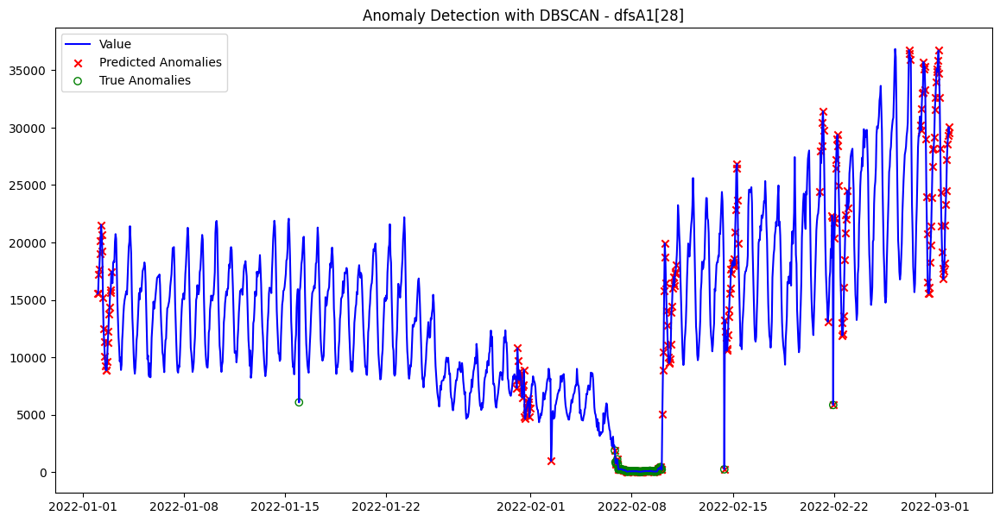

Processing dataset dfsA1[43]...
Best F1 Score for dfsA1[43]: 0.6275
Best Precision: 0.4571
Best Recall: 1.0000
Best Parameters: {'eps': 1.0, 'min_samples': 10}


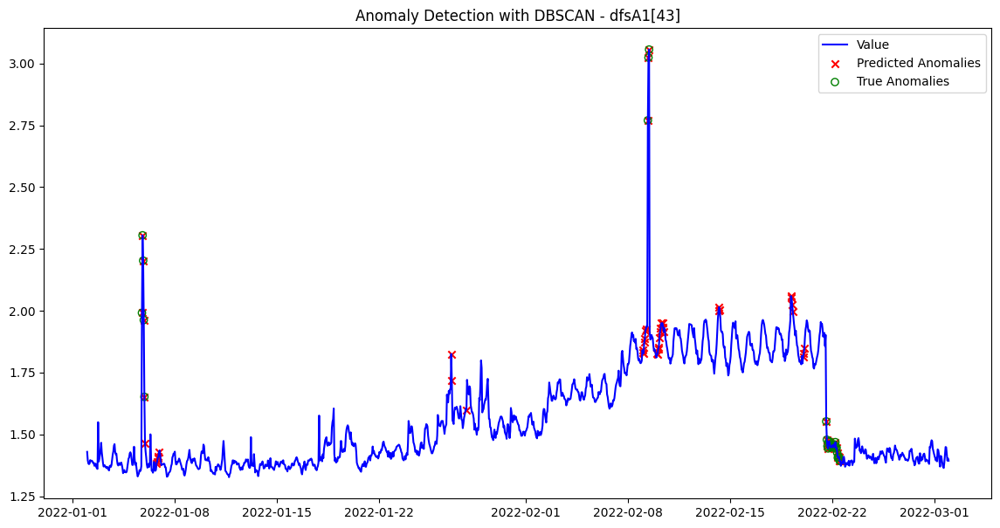

Processing dataset dfsA1[46]...
Best F1 Score for dfsA1[46]: 0.2983
Best Precision: 0.2366
Best Recall: 0.4037
Best Parameters: {'eps': 2.0, 'min_samples': 40}


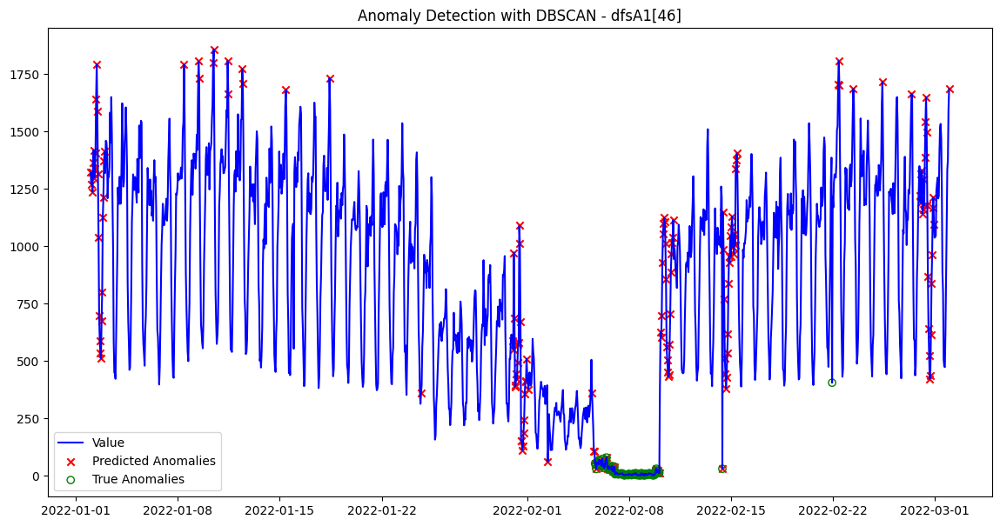

Processing dataset dfsA1[55]...
Best F1 Score for dfsA1[55]: 0.3636
Best Precision: 0.3333
Best Recall: 0.4000
Best Parameters: {'eps': 2.0, 'min_samples': 5}


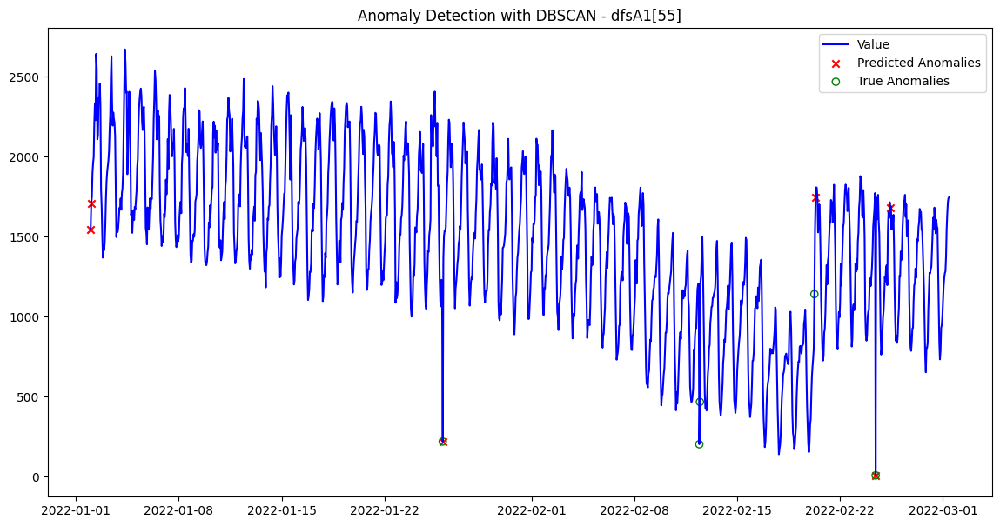

Processing dataset dfsA1[56]...
Best F1 Score for dfsA1[56]: 0.5263
Best Precision: 0.3571
Best Recall: 1.0000
Best Parameters: {'eps': 1.5, 'min_samples': 5}


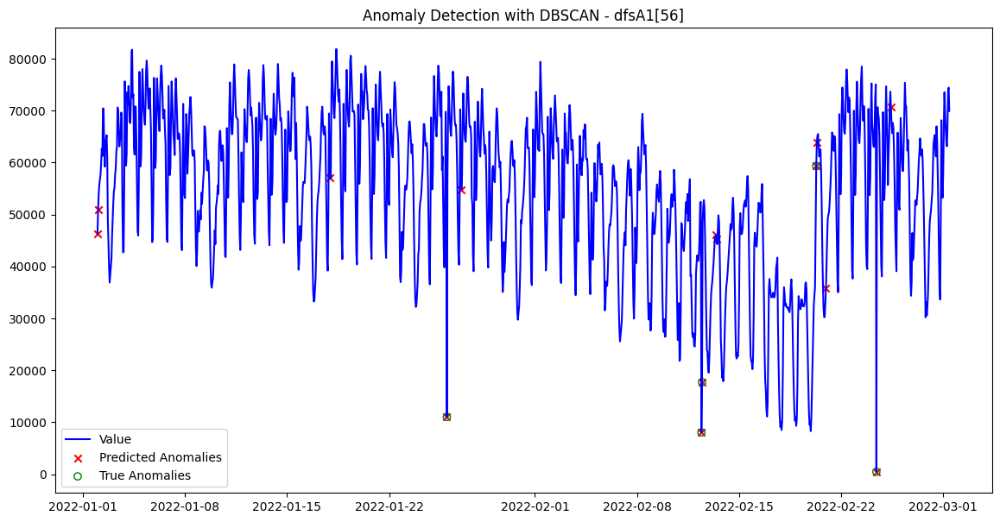

Processing dataset dfsA1[65]...
Best F1 Score for dfsA1[65]: 0.2778
Best Precision: 0.2632
Best Recall: 0.2941
Best Parameters: {'eps': 2.0, 'min_samples': 5}


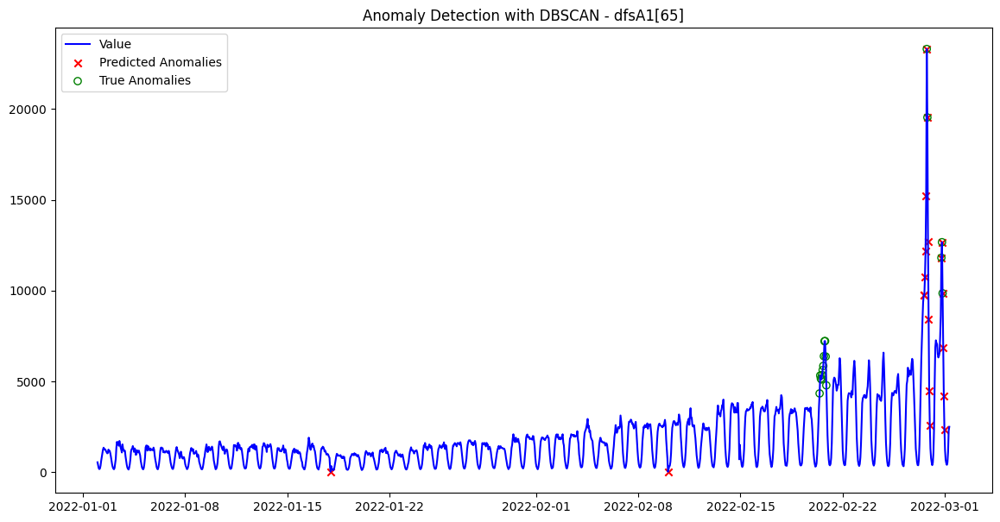

Average F1 Score across all datasets: 0.4283
Average Precision across all datasets: 0.3269
Average Recall across all datasets: 0.6809
All F1 Scores for each dataset: 0.4765, 0.6275, 0.2983, 0.3636, 0.5263, 0.2778


In [ ]:
from sklearn.cluster import DBSCAN
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import f1_score, precision_score, recall_score
from sklearn.model_selection import ParameterGrid
import matplotlib.pyplot as plt
import pandas as pd

# Define A1A and ParameterGrid for hyperparameter tuning
A1D = [28,43,46,55,56,65]
param_grid = {
    'eps': [0.5, 1.0, 1.5, 2.0],
    'min_samples': [5, 10, 20,30,40,50,60, 100, 200]
}
grid = ParameterGrid(param_grid)

# To calculate the average F1 score, precision, and recall
f1_scores = []
precision_scores = []
recall_scores = []

# Iterate through datasets
for i in A1D:
    print(f"Processing dataset dfsA1[{i}]...")

    # Feature engineering (you'll need to implement this function)
    data_features = feature_engineering(dfsA1[i], value_col=f"value_{i}", window_size=24)

    # Separate features and labels
    X = data_features.drop(columns=['label'])  # Drop the label column
    y = data_features['label']  # Ground truth labels

    # Standardize features
    scaler = StandardScaler()
    X_scaled = scaler.fit_transform(X)

    # Hyperparameter tuning using grid search
    best_f1 = -1
    best_precision = -1
    best_recall = -1
    best_params = None
    best_predictions = None

    for params in grid:
        # Train DBSCAN with current parameters
        dbscan = DBSCAN(eps=params['eps'], min_samples=params['min_samples'])
        predictions = dbscan.fit_predict(X_scaled)

        # Map predictions to binary (1 = anomaly, 0 = normal)
        predictions = [1 if pred == -1 else 0 for pred in predictions]

        # Calculate metrics
        f1 = f1_score(y, predictions)
        precision = precision_score(y, predictions)
        recall = recall_score(y, predictions)

        # Update best parameters if current F1 is better
        if f1 > best_f1:
            best_f1 = f1
            best_precision = precision
            best_recall = recall
            best_params = params
            best_predictions = predictions

    # Append best metrics for the dataset
    f1_scores.append(best_f1)
    precision_scores.append(best_precision)
    recall_scores.append(best_recall)

    # Output best parameters and metrics for current dataset
    print(f"Best F1 Score for dfsA1[{i}]: {best_f1:.4f}")
    print(f"Best Precision: {best_precision:.4f}")
    print(f"Best Recall: {best_recall:.4f}")
    print(f"Best Parameters: {best_params}")

    # Add predictions to the original DataFrame for inspection
    data_features['predictions'] = best_predictions

    # Visualize anomalies
    plt.figure(figsize=(14, 7))
    plt.plot(data_features.index, data_features[f"value_{i}"], label='Value', color='blue')
    plt.scatter(data_features[data_features['predictions'] == 1].index,
                data_features[data_features['predictions'] == 1][f"value_{i}"],
                color='red', label='Predicted Anomalies', marker='x')
    plt.scatter(data_features[data_features['label'] == 1].index,
                data_features[data_features['label'] == 1][f"value_{i}"],
                color='green', label='True Anomalies', facecolors="none", marker='o')

    plt.title(f'Anomaly Detection with DBSCAN - dfsA1[{i}]')
    plt.legend()
    plt.show()

# Calculate and output the average metrics
avg_f1_score = sum(f1_scores) / len(f1_scores)
avg_precision = sum(precision_scores) / len(precision_scores)
avg_recall = sum(recall_scores) / len(recall_scores)
print(f"Average F1 Score across all datasets: {avg_f1_score:.4f}")
print(f"Average Precision across all datasets: {avg_precision:.4f}")
print(f"Average Recall across all datasets: {avg_recall:.4f}")
# Print each F1 score formatted individually
formatted_f1_scores = [f"{score:.4f}" for score in f1_scores]
print(f"All F1 Scores for each dataset: {', '.join(formatted_f1_scores)}")


Processing dataset dfsA1[28]...


/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.p

Best F1 Score for dfsA1[28]: 0.0000
Best Precision: 0.0000
Best Recall: 0.0000
Best Parameters: {'eps': 0.5, 'min_samples': 5}


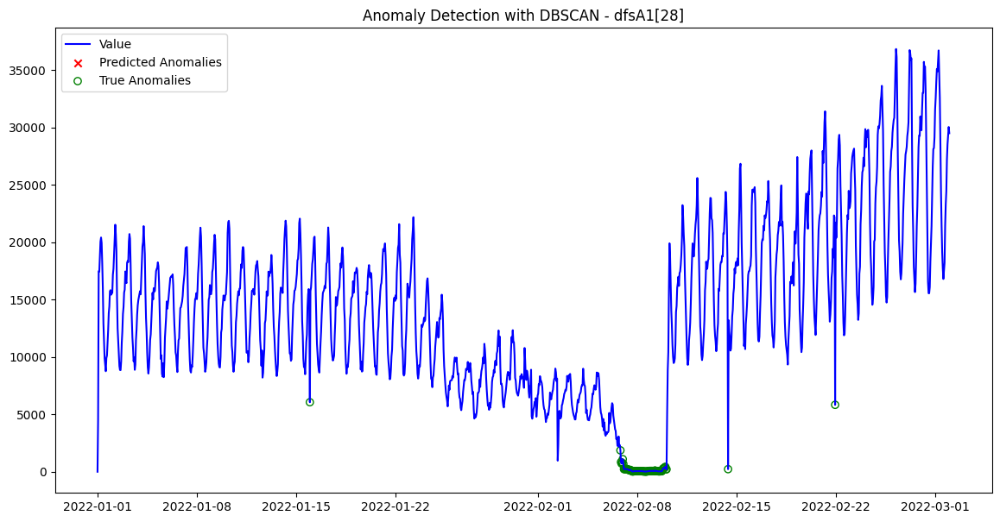

Processing dataset dfsA1[43]...
Best F1 Score for dfsA1[43]: 0.2703
Best Precision: 1.0000
Best Recall: 0.1562
Best Parameters: {'eps': 0.5, 'min_samples': 5}


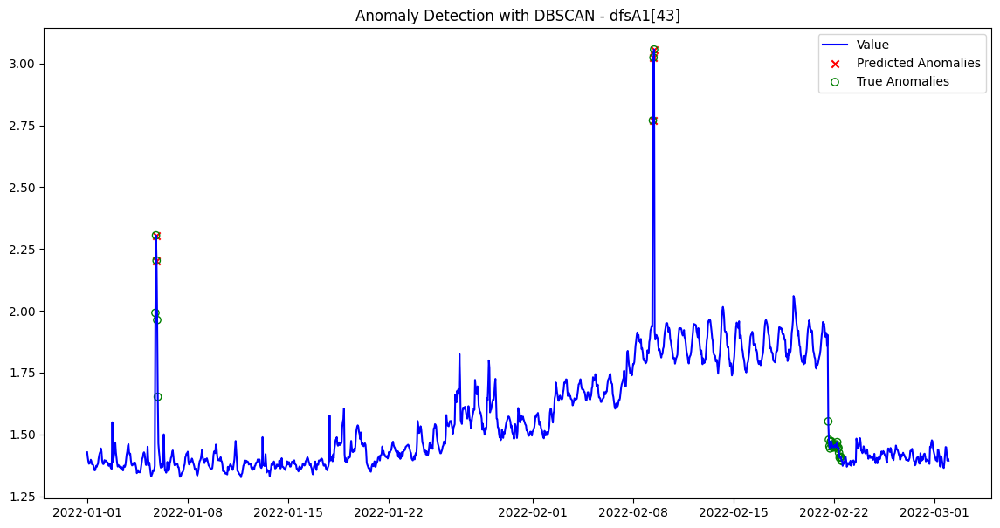

Processing dataset dfsA1[46]...


/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.p

Best F1 Score for dfsA1[46]: 0.0000
Best Precision: 0.0000
Best Recall: 0.0000
Best Parameters: {'eps': 0.5, 'min_samples': 5}


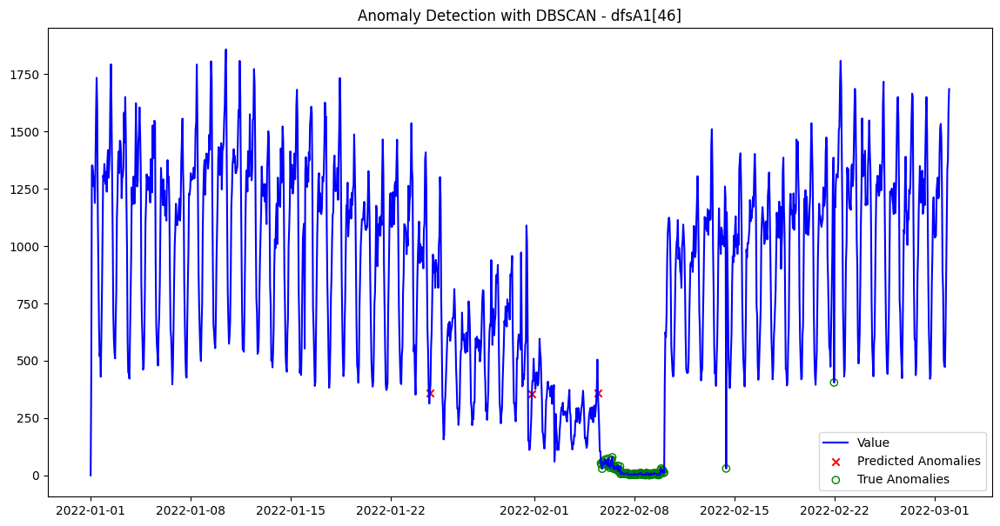

Processing dataset dfsA1[55]...
Best F1 Score for dfsA1[55]: 0.2500
Best Precision: 0.3333
Best Recall: 0.2000
Best Parameters: {'eps': 0.5, 'min_samples': 5}


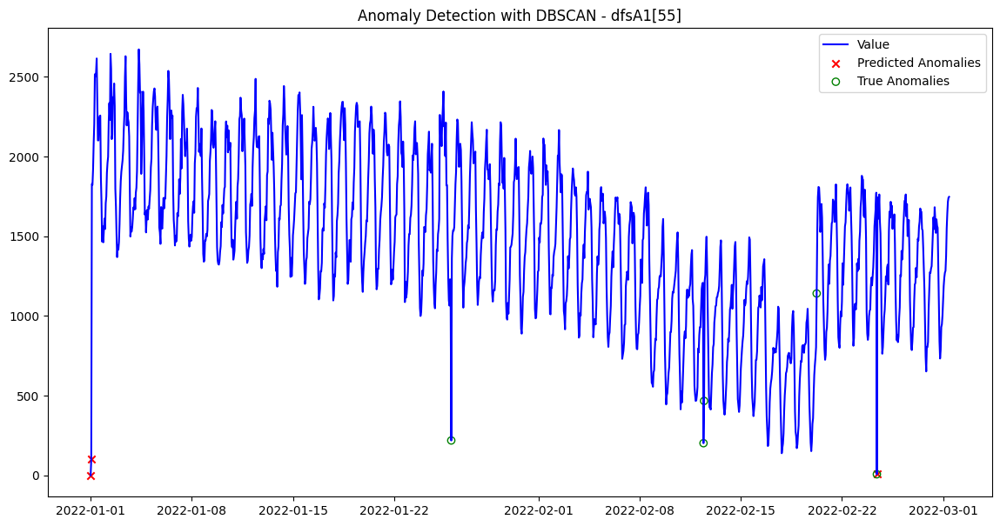

Processing dataset dfsA1[56]...
Best F1 Score for dfsA1[56]: 0.2500
Best Precision: 0.3333
Best Recall: 0.2000
Best Parameters: {'eps': 0.5, 'min_samples': 5}


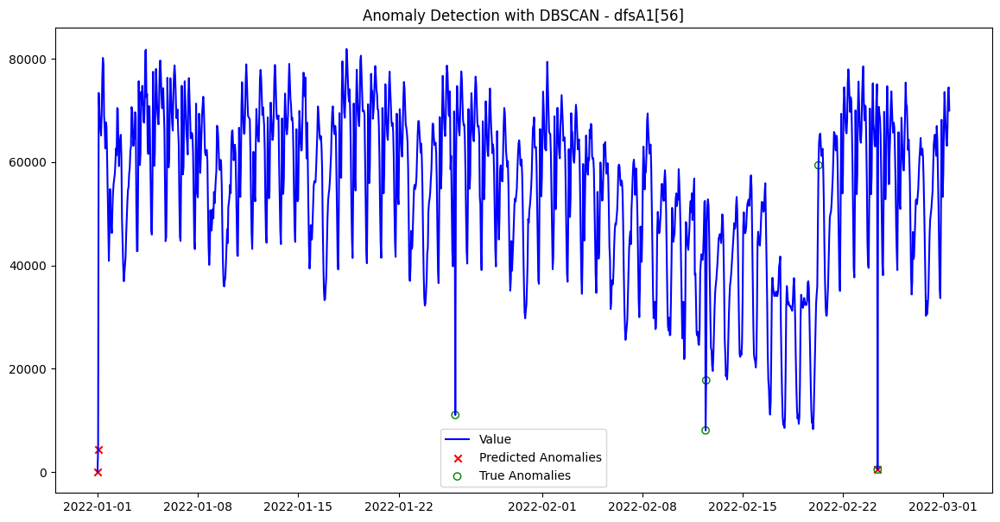

Processing dataset dfsA1[65]...
Best F1 Score for dfsA1[65]: 0.3226
Best Precision: 0.3571
Best Recall: 0.2941
Best Parameters: {'eps': 1.0, 'min_samples': 10}


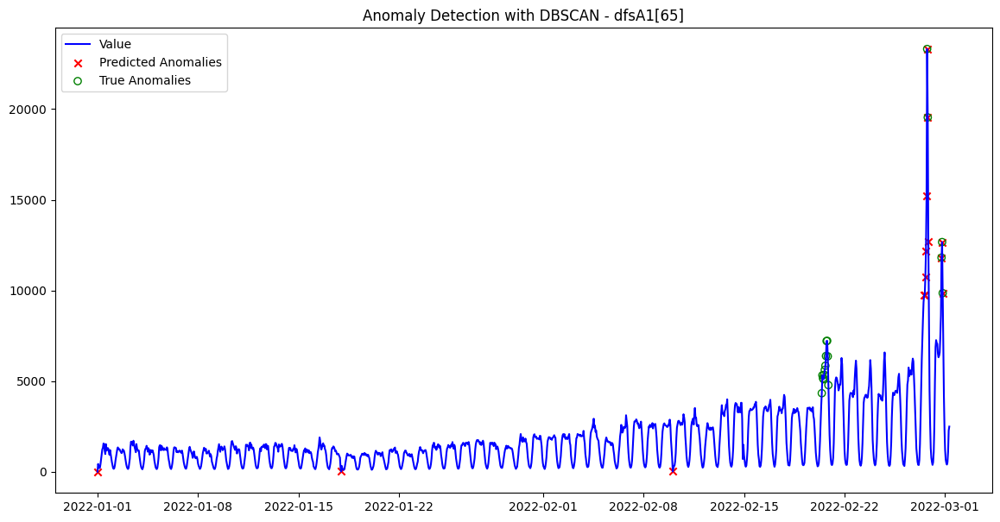

Average F1 Score across all datasets: 0.1821
Average Precision across all datasets: 0.3373
Average Recall across all datasets: 0.1417
All F1 Scores for each dataset: 0.0000, 0.2703, 0.0000, 0.2500, 0.2500, 0.3226


In [ ]:
from sklearn.cluster import DBSCAN
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import f1_score, precision_score, recall_score
from sklearn.model_selection import ParameterGrid
import matplotlib.pyplot as plt
import pandas as pd

# Define A1A and ParameterGrid for hyperparameter tuning
A1D = [28,43,46,55,56,65]
param_grid = {
    'eps': [0.5, 1.0, 1.5, 2.0],
    'min_samples': [5, 10, 20]
}
grid = ParameterGrid(param_grid)

# To calculate the average F1 score, precision, and recall
f1_scores = []
precision_scores = []
recall_scores = []

# Iterate through datasets
for i in A1D:
    print(f"Processing dataset dfsA1[{i}]...")

    # Feature engineering (you'll need to implement this function)
    data_features = dfsA1[i]

    # Separate features and labels
    X = data_features.drop(columns=['label'])  # Drop the label column
    y = data_features['label']  # Ground truth labels

    # Standardize features
    scaler = StandardScaler()
    X_scaled = scaler.fit_transform(X)

    # Hyperparameter tuning using grid search
    best_f1 = -1
    best_precision = -1
    best_recall = -1
    best_params = None
    best_predictions = None

    for params in grid:
        # Train DBSCAN with current parameters
        dbscan = DBSCAN(eps=params['eps'], min_samples=params['min_samples'])
        predictions = dbscan.fit_predict(X_scaled)

        # Map predictions to binary (1 = anomaly, 0 = normal)
        predictions = [1 if pred == -1 else 0 for pred in predictions]

        # Calculate metrics
        f1 = f1_score(y, predictions)
        precision = precision_score(y, predictions)
        recall = recall_score(y, predictions)

        # Update best parameters if current F1 is better
        if f1 > best_f1:
            best_f1 = f1
            best_precision = precision
            best_recall = recall
            best_params = params
            best_predictions = predictions

    # Append best metrics for the dataset
    f1_scores.append(best_f1)
    precision_scores.append(best_precision)
    recall_scores.append(best_recall)

    # Output best parameters and metrics for current dataset
    print(f"Best F1 Score for dfsA1[{i}]: {best_f1:.4f}")
    print(f"Best Precision: {best_precision:.4f}")
    print(f"Best Recall: {best_recall:.4f}")
    print(f"Best Parameters: {best_params}")

    # Add predictions to the original DataFrame for inspection
    data_features['predictions'] = best_predictions

    # Visualize anomalies
    plt.figure(figsize=(14, 7))
    plt.plot(data_features.index, data_features[f"value_{i}"], label='Value', color='blue')
    plt.scatter(data_features[data_features['predictions'] == 1].index,
                data_features[data_features['predictions'] == 1][f"value_{i}"],
                color='red', label='Predicted Anomalies', marker='x')
    plt.scatter(data_features[data_features['label'] == 1].index,
                data_features[data_features['label'] == 1][f"value_{i}"],
                color='green', label='True Anomalies', facecolors="none", marker='o')

    plt.title(f'Anomaly Detection with DBSCAN - dfsA1[{i}]')
    plt.legend()
    plt.show()

# Calculate and output the average metrics
avg_f1_score = sum(f1_scores) / len(f1_scores)
avg_precision = sum(precision_scores) / len(precision_scores)
avg_recall = sum(recall_scores) / len(recall_scores)
print(f"Average F1 Score across all datasets: {avg_f1_score:.4f}")
print(f"Average Precision across all datasets: {avg_precision:.4f}")
print(f"Average Recall across all datasets: {avg_recall:.4f}")
# Print each F1 score formatted individually
formatted_f1_scores = [f"{score:.4f}" for score in f1_scores]
print(f"All F1 Scores for each dataset: {', '.join(formatted_f1_scores)}")


## NAB

## NYC TEMP

In [ ]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import StandardScaler

# Perform feature engineering
def feature_engineering_nab(df, value_col, window_size):
    df = df.copy()

    if not isinstance(df.index, pd.DatetimeIndex):
      df['timestamp'] = pd.to_datetime(df['timestamp'])  # Assuming 'timestamp' is the datetime column
      df.set_index('timestamp', inplace=True)

    # Rolling statistics
    df[f'rolling_mean_{window_size}'] = df[value_col].rolling(window=window_size).mean()
    df[f'rolling_std_{window_size}'] = df[value_col].rolling(window=window_size).std()
    df[f'rolling_min_{window_size}'] = df[value_col].rolling(window=window_size).min()
    df[f'rolling_max_{window_size}'] = df[value_col].rolling(window=window_size).max()

    # Time-based features
    df['hour'] = df.index.hour
    df['day_of_week'] = df.index.weekday
    df['day_of_month'] = df.index.day
    df['Lag'] = df[value_col].shift(window_size)


    # Sinusoidal encoding for capturing daily seasonality
    df['sin_day'] = np.sin(2 * np.pi * df.index.hour / window_size)
    df['cos_day'] = np.cos(2 * np.pi * df.index.hour / window_size)
    # Drop rows with NaN due to rolling statistics
    df.dropna(inplace=True)
    return df

Window 0: (5839, 6045), Detection t=-2.728, Contribution=1.000
Window 1: (7080, 7286), Detection t=-2.379, Contribution=1.000
Window 2: (8423, 8629), Detection t=-2.320, Contribution=1.000
Window 3: (8731, 8937), Detection t=-2.476, Contribution=1.000
Window 4: (9977, 10183), Detection t=-2.485, Contribution=1.000
False positive detection at 147, Contribution=-1.000
Raw score for dataset: 4.000
Best F1 Score for NYC]: 0.1793
Best Precision: 0.9903
Best Recall: 0.0986
Best Parameters: {'eps': 2.0, 'min_samples': 10}
Best NAB Score: 3.9999


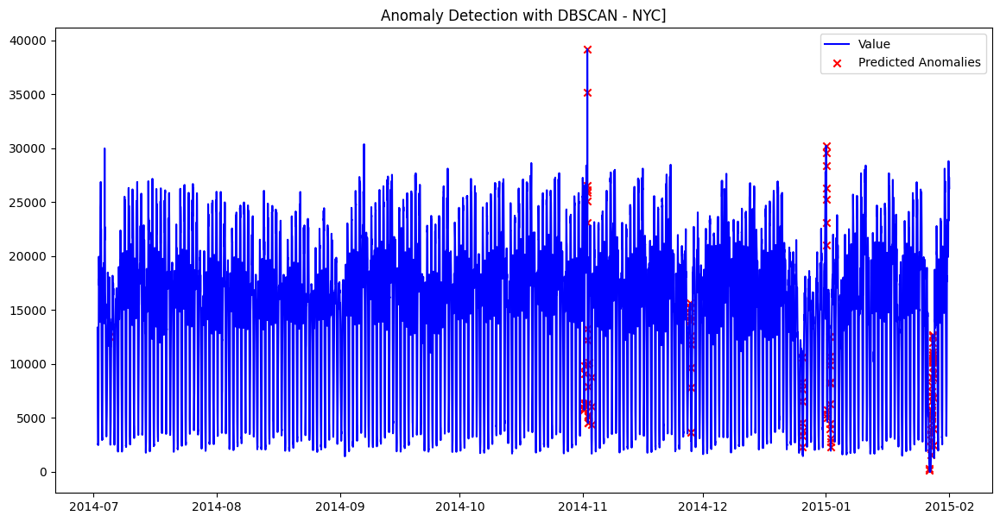

In [ ]:
from sklearn.cluster import DBSCAN
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import f1_score, precision_score, recall_score
from sklearn.model_selection import ParameterGrid
import matplotlib.pyplot as plt
import pandas as pd


param_grid = {
   # 'eps': [0.5, 1.0, 1.5, 2.0],
   # 'min_samples': [5, 10, 20]
    'eps': [2.0],
    'min_samples': [10]
}
grid = ParameterGrid(param_grid)

# Feature engineering (you'll need to implement this function)
data_features = feature_engineering_nab(data["realKnownCause"]["nyc_taxi.csv"], value_col=f"value", window_size=48)

# Separate features and labels
X = data_features.drop(columns=['label'])  # Drop the label column
y = data_features['label']  # Ground truth labels

# Standardize features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Hyperparameter tuning using grid search
best_f1 = -1
best_precision = -1
best_recall = -1
best_params = None
best_predictions = None
best_nab = float("-inf")

for params in grid:
    # Train DBSCAN with current parameters
    dbscan = DBSCAN(eps=params['eps'], min_samples=params['min_samples'])
    predictions = dbscan.fit_predict(X_scaled)

    # Map predictions to binary (1 = anomaly, 0 = normal)
    predictions = [1 if pred == -1 else 0 for pred in predictions]

    # Convert binary predictions to detection timestamps
    detections = [i for i, x in enumerate(predictions) if x == 1]

    # Compute the NAB score
    nab_score = compute_raw_score_debug(detections, anomaly_windows["nyc_taxi.csv"], A_tp = 1.0, A_fp = -0.11, A_fn = -1.0)

    # Calculate metrics
    f1 = f1_score(y, predictions)
    precision = precision_score(y, predictions)
    recall = recall_score(y, predictions)

    # Update best parameters if current F1 is better
    if nab_score > best_nab:
        best_f1 = f1
        best_precision = precision
        best_recall = recall
        best_params = params
        best_predictions = predictions
        best_nab = nab_score


# Output best parameters and metrics for current dataset
print(f"Best F1 Score for NYC]: {best_f1:.4f}")
print(f"Best Precision: {best_precision:.4f}")
print(f"Best Recall: {best_recall:.4f}")
print(f"Best Parameters: {best_params}")
print(f"Best NAB Score: {best_nab:.4f}")

# Add predictions to the original DataFrame for inspection
data_features['predictions'] = best_predictions

# Visualize anomalies
plt.figure(figsize=(14, 7))
plt.plot(data_features.index, data_features[f"value"], label='Value', color='blue')
plt.scatter(data_features[data_features['predictions'] == 1].index,
            data_features[data_features['predictions'] == 1][f"value"],
            color='red', label='Predicted Anomalies', marker='x')
#plt.scatter(data_features[data_features['label'] == 1].index,
#            data_features[data_features['label'] == 1][f"value"],
#            color='green', label='True Anomalies', facecolors="none", marker='o')

plt.title(f'Anomaly Detection with DBSCAN - NYC]')
plt.legend()
plt.show()




## NYC NO TEMP

Window 0: (5839, 6045), Detection t=-1.883, Contribution=1.000
Window 1: (7080, 7286), Missed anomaly window. Penalty=-1.000
Window 2: (8423, 8629), Missed anomaly window. Penalty=-1.000
Window 3: (8731, 8937), Missed anomaly window. Penalty=-1.000
Window 4: (9977, 10183), Missed anomaly window. Penalty=-1.000
Raw score for dataset: -3.000
Window 0: (5839, 6045), Detection t=-1.883, Contribution=1.000
Window 1: (7080, 7286), Missed anomaly window. Penalty=-1.000
Window 2: (8423, 8629), Missed anomaly window. Penalty=-1.000
Window 3: (8731, 8937), Missed anomaly window. Penalty=-1.000
Window 4: (9977, 10183), Missed anomaly window. Penalty=-1.000
Raw score for dataset: -3.000
Window 0: (5839, 6045), Detection t=-1.883, Contribution=1.000
Window 1: (7080, 7286), Missed anomaly window. Penalty=-1.000
Window 2: (8423, 8629), Missed anomaly window. Penalty=-1.000
Window 3: (8731, 8937), Missed anomaly window. Penalty=-1.000
Window 4: (9977, 10183), Missed anomaly window. Penalty=-1.000
Raw 

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Window 0: (5839, 6045), Missed anomaly window. Penalty=-1.000
Window 1: (7080, 7286), Missed anomaly window. Penalty=-1.000
Window 2: (8423, 8629), Missed anomaly window. Penalty=-1.000
Window 3: (8731, 8937), Missed anomaly window. Penalty=-1.000
Window 4: (9977, 10183), Missed anomaly window. Penalty=-1.000
Raw score for dataset: -5.000


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Window 0: (5839, 6045), Detection t=-1.883, Contribution=1.000
Window 1: (7080, 7286), Missed anomaly window. Penalty=-1.000
Window 2: (8423, 8629), Missed anomaly window. Penalty=-1.000
Window 3: (8731, 8937), Missed anomaly window. Penalty=-1.000
Window 4: (9977, 10183), Missed anomaly window. Penalty=-1.000
Raw score for dataset: -3.000
Window 0: (5839, 6045), Missed anomaly window. Penalty=-1.000
Window 1: (7080, 7286), Missed anomaly window. Penalty=-1.000
Window 2: (8423, 8629), Missed anomaly window. Penalty=-1.000
Window 3: (8731, 8937), Missed anomaly window. Penalty=-1.000
Window 4: (9977, 10183), Missed anomaly window. Penalty=-1.000
Raw score for dataset: -5.000


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Window 0: (5839, 6045), Missed anomaly window. Penalty=-1.000
Window 1: (7080, 7286), Missed anomaly window. Penalty=-1.000
Window 2: (8423, 8629), Missed anomaly window. Penalty=-1.000
Window 3: (8731, 8937), Missed anomaly window. Penalty=-1.000
Window 4: (9977, 10183), Missed anomaly window. Penalty=-1.000
Raw score for dataset: -5.000


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Window 0: (5839, 6045), Missed anomaly window. Penalty=-1.000
Window 1: (7080, 7286), Missed anomaly window. Penalty=-1.000
Window 2: (8423, 8629), Missed anomaly window. Penalty=-1.000
Window 3: (8731, 8937), Missed anomaly window. Penalty=-1.000
Window 4: (9977, 10183), Missed anomaly window. Penalty=-1.000
Raw score for dataset: -5.000


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Window 0: (5839, 6045), Missed anomaly window. Penalty=-1.000
Window 1: (7080, 7286), Missed anomaly window. Penalty=-1.000
Window 2: (8423, 8629), Missed anomaly window. Penalty=-1.000
Window 3: (8731, 8937), Missed anomaly window. Penalty=-1.000
Window 4: (9977, 10183), Missed anomaly window. Penalty=-1.000
Raw score for dataset: -5.000


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Window 0: (5839, 6045), Missed anomaly window. Penalty=-1.000
Window 1: (7080, 7286), Missed anomaly window. Penalty=-1.000
Window 2: (8423, 8629), Missed anomaly window. Penalty=-1.000
Window 3: (8731, 8937), Missed anomaly window. Penalty=-1.000
Window 4: (9977, 10183), Missed anomaly window. Penalty=-1.000
Raw score for dataset: -5.000


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Window 0: (5839, 6045), Missed anomaly window. Penalty=-1.000
Window 1: (7080, 7286), Missed anomaly window. Penalty=-1.000
Window 2: (8423, 8629), Missed anomaly window. Penalty=-1.000
Window 3: (8731, 8937), Missed anomaly window. Penalty=-1.000
Window 4: (9977, 10183), Missed anomaly window. Penalty=-1.000
Raw score for dataset: -5.000
Best F1 Score for NYC]: 0.0039
Best Precision: 1.0000
Best Recall: 0.0019
Best Parameters: {'eps': 0.5, 'min_samples': 5}
Best NAB Score: -3.0002


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


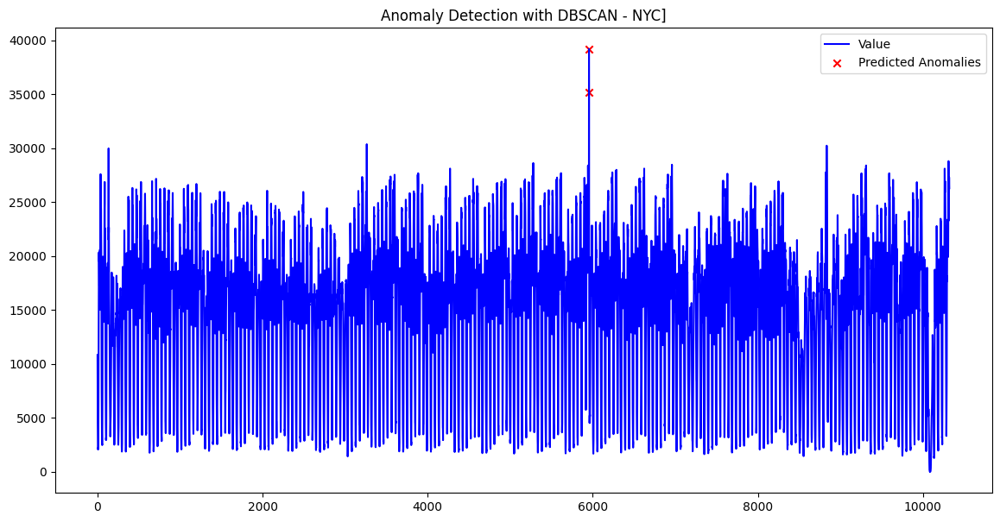

In [ ]:
from sklearn.cluster import DBSCAN
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import f1_score, precision_score, recall_score
from sklearn.model_selection import ParameterGrid
import matplotlib.pyplot as plt
import pandas as pd


param_grid = {
    'eps': [0.5, 1.0, 1.5, 2.0],
    'min_samples': [5, 10, 20]
}
grid = ParameterGrid(param_grid)

# Feature engineering (you'll need to implement this function)
data_features = data["realKnownCause"]["nyc_taxi.csv"]

# Separate features and labels
X = data_features.drop(columns=["timestamp",'label'])  # Drop the label column
y = data_features['label']  # Ground truth labels

# Standardize features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Hyperparameter tuning using grid search
best_f1 = -1
best_precision = -1
best_recall = -1
best_params = None
best_predictions = None
best_nab = float("-inf")

for params in grid:
    # Train DBSCAN with current parameters
    dbscan = DBSCAN(eps=params['eps'], min_samples=params['min_samples'])
    predictions = dbscan.fit_predict(X_scaled)

    # Map predictions to binary (1 = anomaly, 0 = normal)
    predictions = [1 if pred == -1 else 0 for pred in predictions]

    # Convert binary predictions to detection timestamps
    detections = [i for i, x in enumerate(predictions) if x == 1]

    # Compute the NAB score
    nab_score = compute_raw_score_debug(detections, anomaly_windows["nyc_taxi.csv"], A_tp = 1.0, A_fp = -0.11, A_fn = -1.0)

    # Calculate metrics
    f1 = f1_score(y, predictions)
    precision = precision_score(y, predictions)
    recall = recall_score(y, predictions)

    # Update best parameters if current F1 is better
    if nab_score > best_nab:
        best_f1 = f1
        best_precision = precision
        best_recall = recall
        best_params = params
        best_predictions = predictions
        best_nab = nab_score


# Output best parameters and metrics for current dataset
print(f"Best F1 Score for NYC]: {best_f1:.4f}")
print(f"Best Precision: {best_precision:.4f}")
print(f"Best Recall: {best_recall:.4f}")
print(f"Best Parameters: {best_params}")
print(f"Best NAB Score: {best_nab:.4f}")

# Add predictions to the original DataFrame for inspection
data_features['predictions'] = best_predictions

# Visualize anomalies
plt.figure(figsize=(14, 7))
plt.plot(data_features.index, data_features[f"value"], label='Value', color='blue')
plt.scatter(data_features[data_features['predictions'] == 1].index,
            data_features[data_features['predictions'] == 1][f"value"],
            color='red', label='Predicted Anomalies', marker='x')
#plt.scatter(data_features[data_features['label'] == 1].index,
#            data_features[data_features['label'] == 1][f"value"],
#            color='green', label='True Anomalies', facecolors="none", marker='o')

plt.title(f'Anomaly Detection with DBSCAN - NYC]')
plt.legend()
plt.show()




## without keeping in mind temporal features, dbscan just clustered the nab dataset to 2 different clusters
